In [1]:
import pandas as pd 
import numpy as np 

In [2]:
bld = pd.read_csv('building_info.csv')
smp = pd.read_csv('sample_submission.csv')
test = pd.read_csv('test.csv')
train = pd.read_csv('train.csv')

In [3]:


# Rename columns
bld.rename(columns={
    "건물번호": "Building Number",
    "건물유형": "Building Type",
    "연면적(m2)": "Total Floor Area (m²)",
    "냉방면적(m2)": "Air-conditioned Area (m²)",
    "태양광용량(kW)": "Solar Power Capacity (kW)",
    "ESS저장용량(kWh)": "ESS Storage Capacity (kWh)",
    "PCS용량(kW)": "PCS Capacity (kW)"
}, inplace=True)
building_type_map = {
    '호텔': 'Hotel',
    '상용': 'Commercial',
    '병원': 'Hospital',
    '학교': 'School',
    '건물기타': 'Other Building',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '백화점': 'Department Store',
    'IDC(전화국)': 'IDC (Telecom Center)',
    '공공': 'Public Facility'
}

bld['Building Type'] = bld['Building Type'].replace(building_type_map)
test.rename(columns={
    
    "건물번호": "Building Number",
    "일시": "Datetime",
    "기온(°C)": "Temperature (°C)",
    "강수량(mm)": "Precipitation (mm)",
    "풍속(m/s)": "Wind Speed (m/s)",
    "습도(%)": "Humidity (%)"
}, inplace=True)

train.rename(columns={
    "건물번호": "Building Number",
    "일시": "Datetime",
    "기온(°C)": "Temperature (°C)",
    "강수량(mm)": "Precipitation (mm)",
    "풍속(m/s)": "Wind Speed (m/s)",
    "습도(%)": "Humidity (%)",
    "일조(hr)": "Sunshine Duration (hr)",
    "일사(MJ/m2)": "Solar Radiation (MJ/m²)",
    "전력소비량(kWh)": "Power Consumption (kWh)"
}, inplace=True)





In [4]:
bld.head()
bld

,Building Number,Building Type,Total Floor Area (m²),Air-conditioned Area (m²),Solar Power Capacity (kW),ESS Storage Capacity (kWh),PCS Capacity (kW)
0,1,Hotel,82912.71,77586.00,-,-,-
1,2,Commercial,40658.90,30392.82,-,-,-
2,3,Hospital,560431.00,418992.00,278.58,-,-
3,4,Hotel,41813.29,23715.71,-,-,-
4,5,School,403749.39,248507.00,1983.05,1025,250
...,...,...,...,...,...,...,...
95,96,Other Building,3260213.41,1956128.00,-,-,-
96,97,Other Building,42370.93,3975.52,81.38,-,-
97,98,Hotel,99102.62,22097.00,-,-,-
98,99,Commercial,329867.95,13442.35,171.6,-,-


In [5]:
bld['Building Number'].value_counts()

Building Number
1      1
64     1
74     1
73     1
72     1
      ..
31     1
30     1
29     1
28     1
100    1
Name: count, Length: 100, dtype: int64

In [6]:
bld['Building Type'].value_counts()

Building Type
Department Store        16
Hotel                   10
Commercial              10
School                  10
Other Building          10
Hospital                 9
Apartment                9
Research Institute       9
IDC (Telecom Center)     9
Public Facility          8
Name: count, dtype: int64

In [8]:
smp.head()


,num_date_time,answer
0,1_20240825 00,0
1,1_20240825 01,0
2,1_20240825 02,0
3,1_20240825 03,0
4,1_20240825 04,0


In [9]:
smp.count()

num_date_time    16800
answer           16800
dtype: int64

In [10]:
test.head()

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%)
0,1_20240825 00,1,20240825 00,26.5,0.0,0.7,80.0
1,1_20240825 01,1,20240825 01,26.1,0.0,0.0,80.0
2,1_20240825 02,1,20240825 02,25.9,0.0,0.3,83.0
3,1_20240825 03,1,20240825 03,25.7,0.0,1.1,83.0
4,1_20240825 04,1,20240825 04,25.5,0.0,1.0,86.0


In [11]:
train.head()

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh)
0,1_20240601 00,1,20240601 00,18.3,0.0,2.6,82.0,0.0,0.0,5794.80
1,1_20240601 01,1,20240601 01,18.3,0.0,2.7,82.0,0.0,0.0,5591.85
2,1_20240601 02,1,20240601 02,18.1,0.0,2.6,80.0,0.0,0.0,5338.17
3,1_20240601 03,1,20240601 03,18.0,0.0,2.6,81.0,0.0,0.0,4554.42
4,1_20240601 04,1,20240601 04,17.8,0.0,1.3,81.0,0.0,0.0,3602.25


In [12]:
train['Building Number'].value_counts()

Building Number
1      2040
2      2040
3      2040
4      2040
5      2040
       ... 
96     2040
97     2040
98     2040
99     2040
100    2040
Name: count, Length: 100, dtype: int64

In [13]:
train1 = train.drop(columns=['num_date_time', 'Building Number', 'Datetime'])

In [14]:
train1.head()

,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh)
0,18.3,0.0,2.6,82.0,0.0,0.0,5794.80
1,18.3,0.0,2.7,82.0,0.0,0.0,5591.85
2,18.1,0.0,2.6,80.0,0.0,0.0,5338.17
3,18.0,0.0,2.6,81.0,0.0,0.0,4554.42
4,17.8,0.0,1.3,81.0,0.0,0.0,3602.25


In [15]:
train1.corr()

,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh)
Temperature (°C),1.000000,-0.079778,0.277756,-0.434364,0.442492,0.482076,0.124400
Precipitation (mm),-0.079778,1.000000,0.054976,0.173126,-0.101001,-0.087888,0.009452
Wind Speed (m/s),0.277756,0.054976,1.000000,-0.208548,0.210888,0.303323,0.022214
Humidity (%),-0.434364,0.173126,-0.208548,1.000000,-0.641668,-0.590197,-0.082530
Sunshine Duration (hr),0.442492,-0.101001,0.210888,-0.641668,1.000000,0.766460,0.065969
Solar Radiation (MJ/m²),0.482076,-0.087888,0.303323,-0.590197,0.766460,1.000000,0.109885
Power Consumption (kWh),0.124400,0.009452,0.022214,-0.082530,0.065969,0.109885,1.000000


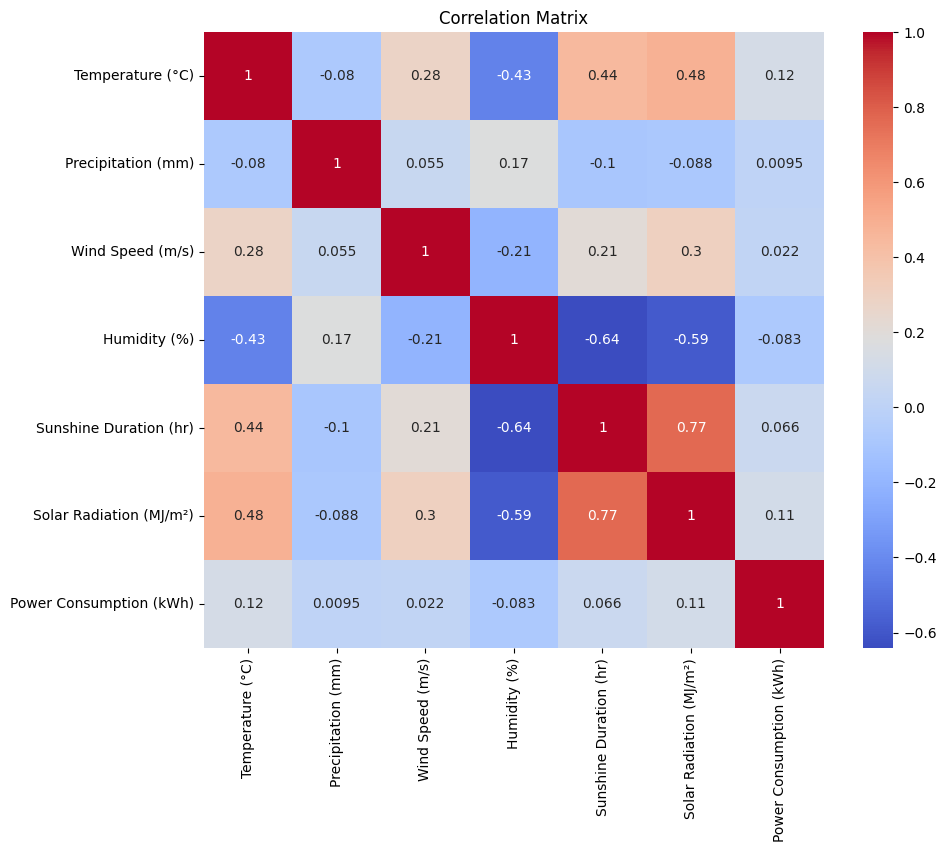

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.heatmap(train1.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [17]:
train.describe()

,Building Number,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh)
count,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000
mean,50.500000,26.098130,0.304185,1.967977,75.206706,0.277459,0.702752,3329.575857
std,28.866141,4.052888,2.052947,1.316102,16.378490,0.396476,1.017394,3689.102792
min,1.000000,8.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25.750000,23.500000,0.000000,1.000000,64.000000,0.000000,0.000000,1176.120000
50%,50.500000,26.300000,0.000000,1.800000,78.000000,0.000000,0.050000,1935.720000
75%,75.250000,28.800000,0.000000,2.700000,88.000000,0.600000,1.230000,3726.765000
max,100.000000,38.700000,100.900000,15.200000,100.000000,1.000000,3.950000,27155.940000


In [18]:
train1.corr()['Power Consumption (kWh)'].sort_values(ascending=False)

Power Consumption (kWh)    1.000000
Temperature (°C)           0.124400
Solar Radiation (MJ/m²)    0.109885
Sunshine Duration (hr)     0.065969
Wind Speed (m/s)           0.022214
Precipitation (mm)         0.009452
Humidity (%)              -0.082530
Name: Power Consumption (kWh), dtype: float64

<Axes: xlabel='Temperature (°C)', ylabel='Power Consumption (kWh)'>

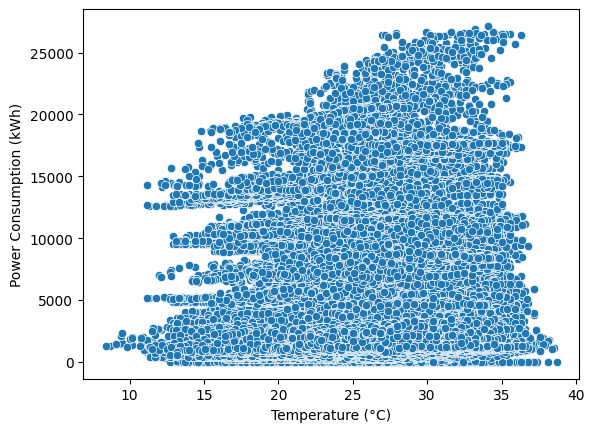

In [19]:
sns.scatterplot(x='Temperature (°C)', y='Power Consumption (kWh)', data=train1)


In [20]:
train.groupby('Building Number')['Power Consumption (kWh)'].mean().sort_values()


Building Number
85       26.259946
65       37.243054
92      471.776353
8       762.738382
31      793.054853
          ...     
64    11002.923529
36    13827.085647
43    14058.798235
3     17449.532324
57    17702.996471
Name: Power Consumption (kWh), Length: 100, dtype: float64

In [21]:
summary = (
    train.groupby('Building Number')['Power Consumption (kWh)']
    .mean()
    .round(2)
    .reset_index()
    .rename(columns={'Power Consumption (kWh)': 'Avg Power Consumption (kWh)'})
    .sort_values(by='Avg Power Consumption (kWh)', ascending=False)
)

# Display nicely
print(summary)

    Building Number  Avg Power Consumption (kWh)
56               57                     17703.00
2                 3                     17449.53
42               43                     14058.80
35               36                     13827.09
63               64                     11002.92
..              ...                          ...
30               31                       793.05
7                 8                       762.74
91               92                       471.78
64               65                        37.24
84               85                        26.26

[100 rows x 2 columns]


In [22]:
summary.head()

,Building Number,Avg Power Consumption (kWh)
56,57,17703.00
2,3,17449.53
42,43,14058.80
35,36,13827.09
63,64,11002.92


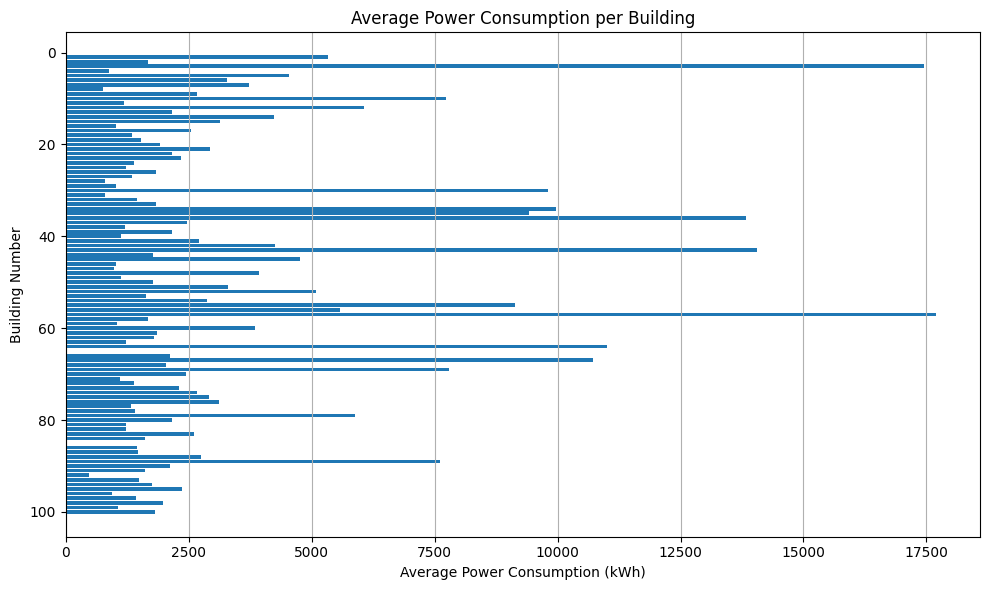

In [23]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.barh(summary['Building Number'], summary['Avg Power Consumption (kWh)'])
plt.xlabel('Average Power Consumption (kWh)')
plt.ylabel('Building Number')
plt.title('Average Power Consumption per Building')
plt.gca().invert_yaxis()  # Largest on top
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

<Axes: xlabel='Hour'>

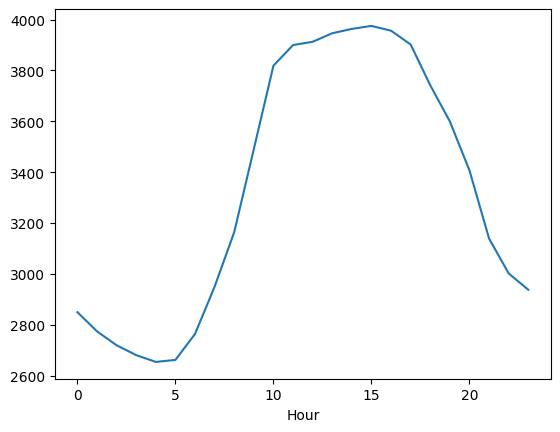

In [24]:
train['Datetime'] = pd.to_datetime(train['Datetime'])
train['Hour'] = train['Datetime'].dt.hour
train['Day'] = train['Datetime'].dt.day
train.groupby('Hour')['Power Consumption (kWh)'].mean().plot()


In [25]:
train

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),Hour,Day
0,1_20240601 00,1,2024-06-01 00:00:00,18.3,0.0,2.6,82.0,0.0,0.00,5794.80,0,1
1,1_20240601 01,1,2024-06-01 01:00:00,18.3,0.0,2.7,82.0,0.0,0.00,5591.85,1,1
2,1_20240601 02,1,2024-06-01 02:00:00,18.1,0.0,2.6,80.0,0.0,0.00,5338.17,2,1
3,1_20240601 03,1,2024-06-01 03:00:00,18.0,0.0,2.6,81.0,0.0,0.00,4554.42,3,1
4,1_20240601 04,1,2024-06-01 04:00:00,17.8,0.0,1.3,81.0,0.0,0.00,3602.25,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100_20240824 19,100,2024-08-24 19:00:00,29.1,0.0,4.4,76.0,0.4,0.18,3276.00,19,24
203996,100_20240824 20,100,2024-08-24 20:00:00,28.6,0.0,3.7,74.0,0.0,0.00,3197.52,20,24
203997,100_20240824 21,100,2024-08-24 21:00:00,28.3,0.0,2.9,74.0,0.0,0.00,3006.60,21,24
203998,100_20240824 22,100,2024-08-24 22:00:00,28.0,0.0,1.7,76.0,0.0,0.00,2649.72,22,24


In [26]:
hourly_per_building = train.groupby(['Building Number', 'Hour'])['Power Consumption (kWh)'].mean().unstack()


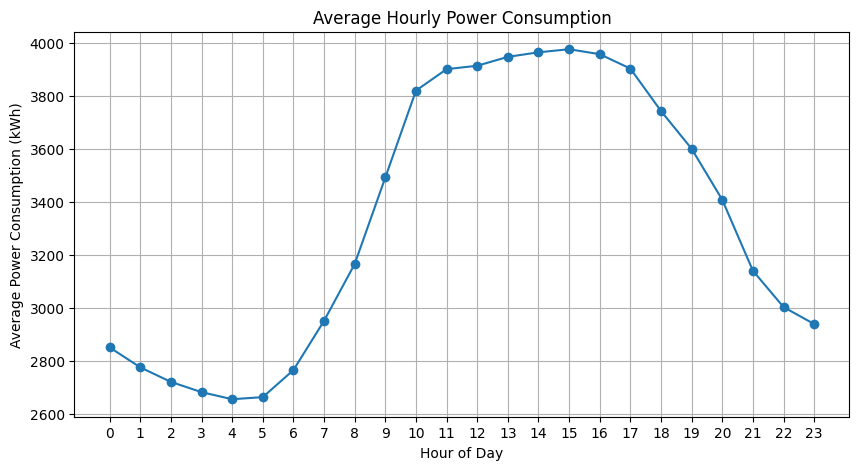

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure datetime is parsed
train['Datetime'] = pd.to_datetime(train['Datetime'])

# Extract hour
train['Hour'] = train['Datetime'].dt.hour

# Group by hour and calculate mean usage
hourly_avg = train.groupby('Hour')['Power Consumption (kWh)'].mean()

# Plot
plt.figure(figsize=(10,5))
plt.plot(hourly_avg.index, hourly_avg.values, marker='o')
plt.xticks(range(0,24))
plt.xlabel('Hour of Day')
plt.ylabel('Average Power Consumption (kWh)')
plt.title('Average Hourly Power Consumption')
plt.grid(True)
plt.show()


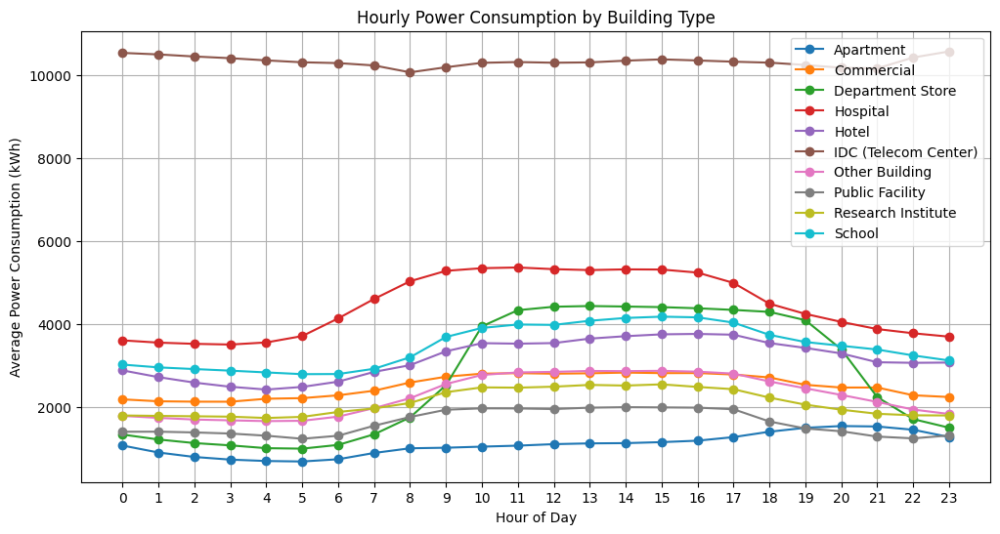

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Assume you have:
# df_usage = main hourly power consumption dataset
# df_info = building info dataset with Building Number and Building Type

# Merge on Building Number
df_merged = train.merge(bld[['Building Number', 'Building Type']], on='Building Number', how='left')

# Extract hour
df_merged['Hour'] = pd.to_datetime(df_merged['Datetime']).dt.hour

# Group by building type & hour
hourly_type_avg = (
    df_merged.groupby(['Building Type', 'Hour'])['Power Consumption (kWh)']
    .mean()
    .reset_index()
)

# Plot pattern for each building type
plt.figure(figsize=(12,6))
for btype in hourly_type_avg['Building Type'].unique():
    subset = hourly_type_avg[hourly_type_avg['Building Type'] == btype]
    plt.plot(subset['Hour'], subset['Power Consumption (kWh)'], marker='o', label=btype)

plt.xticks(range(0,24))
plt.xlabel('Hour of Day')
plt.ylabel('Average Power Consumption (kWh)')
plt.title('Hourly Power Consumption by Building Type')
plt.legend()
plt.grid(True)
plt.show()


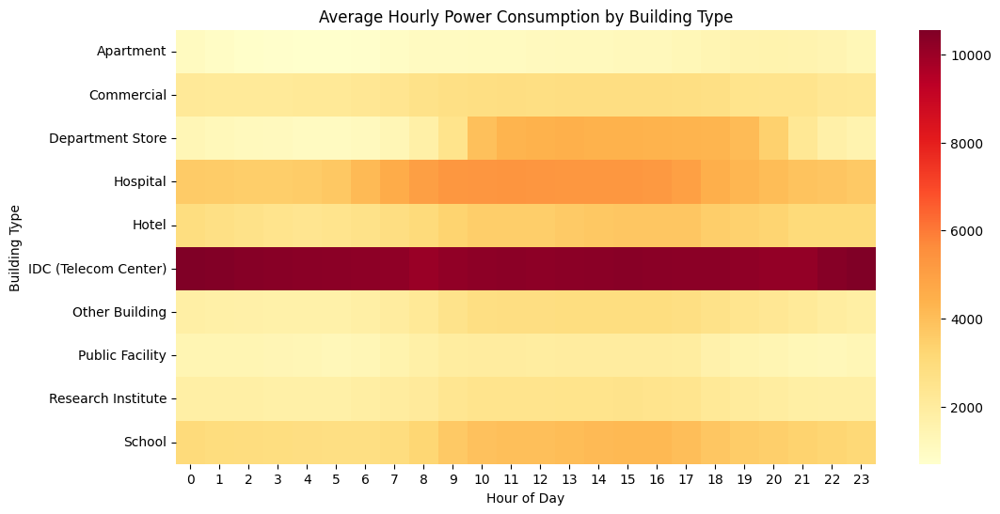

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Merge building info with usage data
df_merged = train.merge(bld[['Building Number', 'Building Type']], 
                           on='Building Number', how='left')

# Extract hour from datetime
df_merged['Hour'] = pd.to_datetime(df_merged['Datetime']).dt.hour

# Pivot to make building type vs hour matrix
heatmap_data = df_merged.pivot_table(
    index='Building Type',
    columns='Hour',
    values='Power Consumption (kWh)',
    aggfunc='mean'
)

# Plot heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=False, cmap='YlOrRd')
plt.title('Average Hourly Power Consumption by Building Type')
plt.xlabel('Hour of Day')
plt.ylabel('Building Type')
plt.show()


In [30]:
building_types = bld['Building Type'].unique()

for btype in building_types:
    # Filter data for one building type
    btype_buildings = bld[bld['Building Type'] == btype]['Building Number']
    df_btype = train[train['Building Number'].isin(btype_buildings)]

In [31]:
btype_buildings

32    33
37    38
49    50
65    66
67    68
71    72
79    80
91    92
Name: Building Number, dtype: int64

In [32]:
df_btype

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),Hour,Day
65280,33_20240601 00,33,2024-06-01 00:00:00,18.3,0.0,2.6,82.0,0.0,0.00,1542.42,0,1
65281,33_20240601 01,33,2024-06-01 01:00:00,18.3,0.0,2.7,82.0,0.0,0.00,1532.22,1,1
65282,33_20240601 02,33,2024-06-01 02:00:00,18.1,0.0,2.6,80.0,0.0,0.00,1505.04,2,1
65283,33_20240601 03,33,2024-06-01 03:00:00,18.0,0.0,2.6,81.0,0.0,0.00,1467.96,3,1
65284,33_20240601 04,33,2024-06-01 04:00:00,17.8,0.0,1.3,81.0,0.0,0.00,1021.20,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...
187675,92_20240824 19,92,2024-08-24 19:00:00,28.7,0.0,1.6,70.0,0.6,0.27,276.84,19,24
187676,92_20240824 20,92,2024-08-24 20:00:00,27.9,0.0,1.6,73.0,0.0,0.01,285.36,20,24
187677,92_20240824 21,92,2024-08-24 21:00:00,27.6,0.0,1.1,76.0,0.0,0.00,282.12,21,24
187678,92_20240824 22,92,2024-08-24 22:00:00,27.3,0.0,0.5,76.0,0.0,0.00,283.92,22,24


In [33]:
# Identify IDC buildings
idc_buildings = bld[bld['Building Type'] == 'IDC (Telecom Center)']['Building Number']

# Split into IDC and non-IDC datasets
df_idc = train[train['Building Number'].isin(idc_buildings)]
df_non_idc = train[~train['Building Number'].isin(idc_buildings)]



In [34]:
df_idc

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),Hour,Day
59160,30_20240601 00,30,2024-06-01 00:00:00,16.8,0.0,1.6,88.0,0.0,0.00,9557.28,0,1
59161,30_20240601 01,30,2024-06-01 01:00:00,16.5,0.7,2.0,92.0,0.0,0.00,9567.36,1,1
59162,30_20240601 02,30,2024-06-01 02:00:00,16.8,0.5,2.2,91.0,0.0,0.00,9563.04,2,1
59163,30_20240601 03,30,2024-06-01 03:00:00,16.5,0.0,1.5,90.0,0.0,0.00,9581.76,3,1
59164,30_20240601 04,30,2024-06-01 04:00:00,16.4,0.0,1.9,90.0,0.0,0.00,9555.84,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...
165235,81_20240824 19,81,2024-08-24 19:00:00,28.3,0.0,2.1,79.0,0.3,0.08,1145.04,19,24
165236,81_20240824 20,81,2024-08-24 20:00:00,28.0,0.0,2.1,81.0,0.0,0.00,1140.00,20,24
165237,81_20240824 21,81,2024-08-24 21:00:00,27.9,0.0,1.6,82.0,0.0,0.00,1139.04,21,24
165238,81_20240824 22,81,2024-08-24 22:00:00,27.1,0.0,0.0,84.0,0.0,0.00,1139.52,22,24


In [35]:
df_non_idc

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),Hour,Day
0,1_20240601 00,1,2024-06-01 00:00:00,18.3,0.0,2.6,82.0,0.0,0.00,5794.80,0,1
1,1_20240601 01,1,2024-06-01 01:00:00,18.3,0.0,2.7,82.0,0.0,0.00,5591.85,1,1
2,1_20240601 02,1,2024-06-01 02:00:00,18.1,0.0,2.6,80.0,0.0,0.00,5338.17,2,1
3,1_20240601 03,1,2024-06-01 03:00:00,18.0,0.0,2.6,81.0,0.0,0.00,4554.42,3,1
4,1_20240601 04,1,2024-06-01 04:00:00,17.8,0.0,1.3,81.0,0.0,0.00,3602.25,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100_20240824 19,100,2024-08-24 19:00:00,29.1,0.0,4.4,76.0,0.4,0.18,3276.00,19,24
203996,100_20240824 20,100,2024-08-24 20:00:00,28.6,0.0,3.7,74.0,0.0,0.00,3197.52,20,24
203997,100_20240824 21,100,2024-08-24 21:00:00,28.3,0.0,2.9,74.0,0.0,0.00,3006.60,21,24
203998,100_20240824 22,100,2024-08-24 22:00:00,28.0,0.0,1.7,76.0,0.0,0.00,2649.72,22,24


C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\2656640479.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour
C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\2656640479.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour


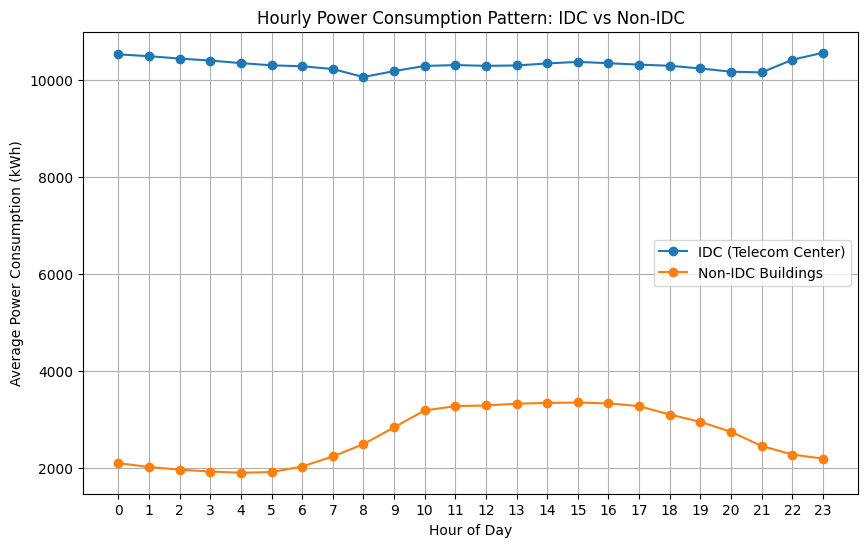

In [36]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_hourly_pattern(df, label):
    df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour
    hourly_avg = df.groupby('Hour')['Power Consumption (kWh)'].mean()
    plt.plot(hourly_avg.index, hourly_avg.values, marker='o', label=label)

plt.figure(figsize=(10, 6))
plot_hourly_pattern(df_idc, 'IDC (Telecom Center)')
plot_hourly_pattern(df_non_idc, 'Non-IDC Buildings')

plt.xticks(range(0, 24))
plt.xlabel('Hour of Day')
plt.ylabel('Average Power Consumption (kWh)')
plt.title('Hourly Power Consumption Pattern: IDC vs Non-IDC')
plt.legend()
plt.grid(True)
plt.show()


C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\2165055785.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour


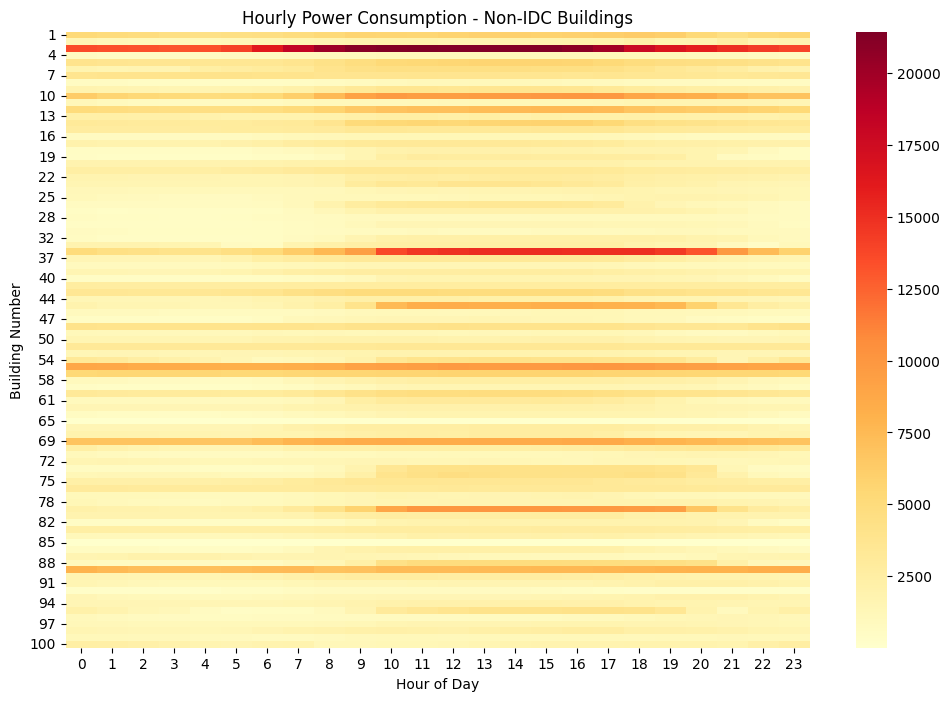

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\2165055785.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour


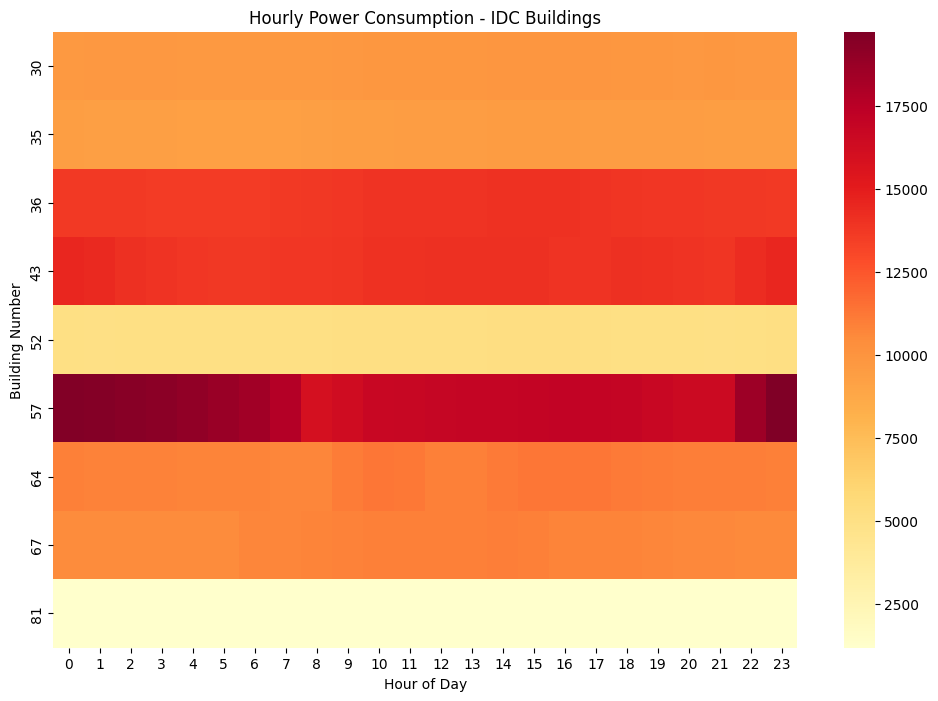

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_building_hourly_heatmap(df, title):
    # Extract hour
    df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour
    
    # Pivot: buildings vs hours
    heatmap_data = df.pivot_table(
        index='Building Number',
        columns='Hour',
        values='Power Consumption (kWh)',
        aggfunc='mean'
    )
    
    # Plot
    plt.figure(figsize=(12, 8))
    sns.heatmap(heatmap_data, cmap='YlOrRd')
    plt.title(title)
    plt.xlabel('Hour of Day')
    plt.ylabel('Building Number')
    plt.show()

# Non-IDC buildings
plot_building_hourly_heatmap(df_non_idc, 'Hourly Power Consumption - Non-IDC Buildings')

# IDC buildings
plot_building_hourly_heatmap(df_idc, 'Hourly Power Consumption - IDC Buildings')


C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\4073584023.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour
C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\4073584023.py:18: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


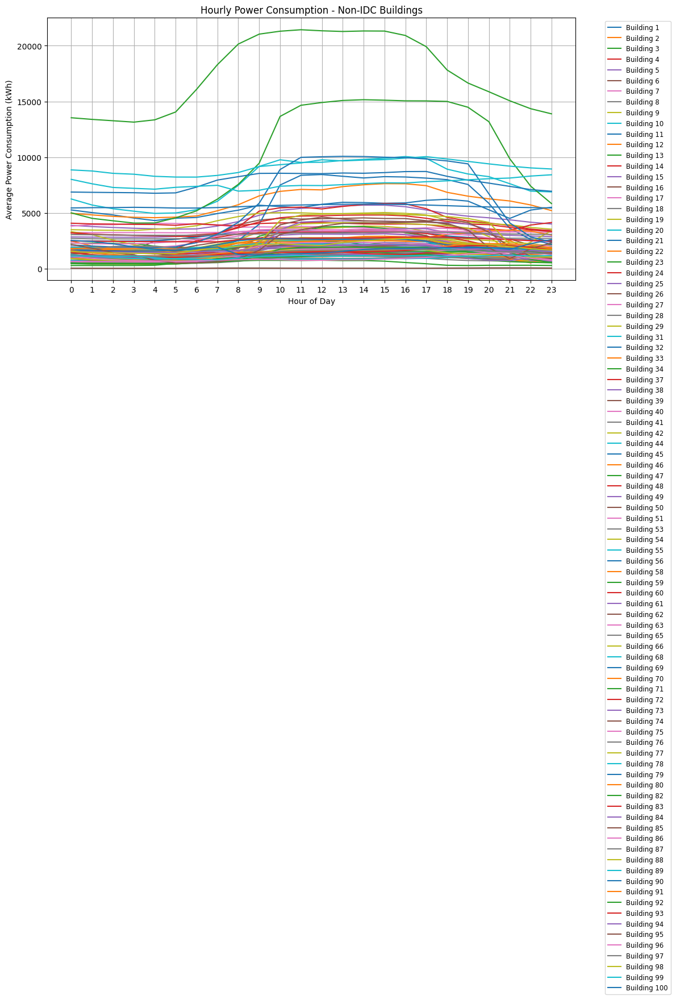

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\4073584023.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour


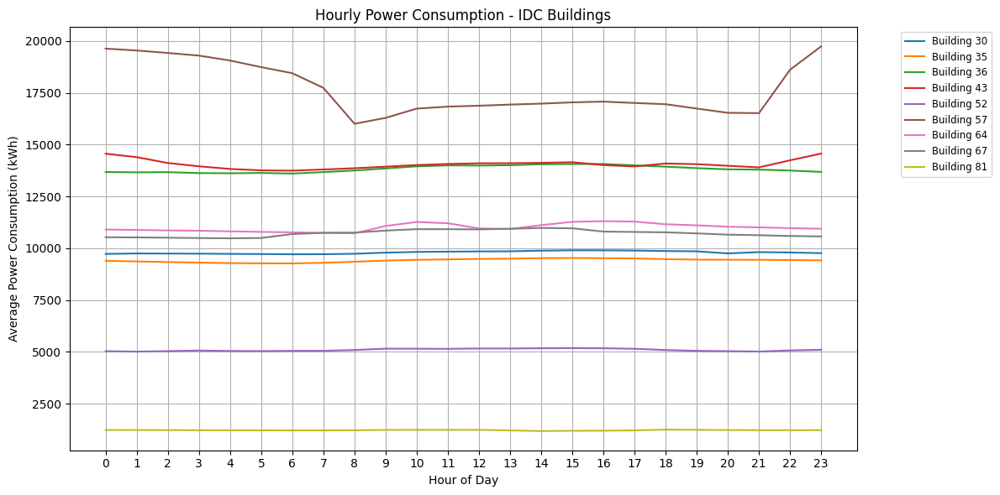

In [38]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_hourly_for_each_building(df, title):
    df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour
    plt.figure(figsize=(12, 6))

    for bnum, group in df.groupby('Building Number'):
        hourly_avg = group.groupby('Hour')['Power Consumption (kWh)'].mean()
        plt.plot(hourly_avg.index, hourly_avg.values, label=f'Building {bnum}')

    plt.title(title)
    plt.xlabel('Hour of Day')
    plt.ylabel('Average Power Consumption (kWh)')
    plt.xticks(range(0, 24))
    plt.grid(True)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.tight_layout()
    plt.show()

# Non-IDC
plot_hourly_for_each_building(df_non_idc, 'Hourly Power Consumption - Non-IDC Buildings')

# IDC
plot_hourly_for_each_building(df_idc, 'Hourly Power Consumption - IDC Buildings')


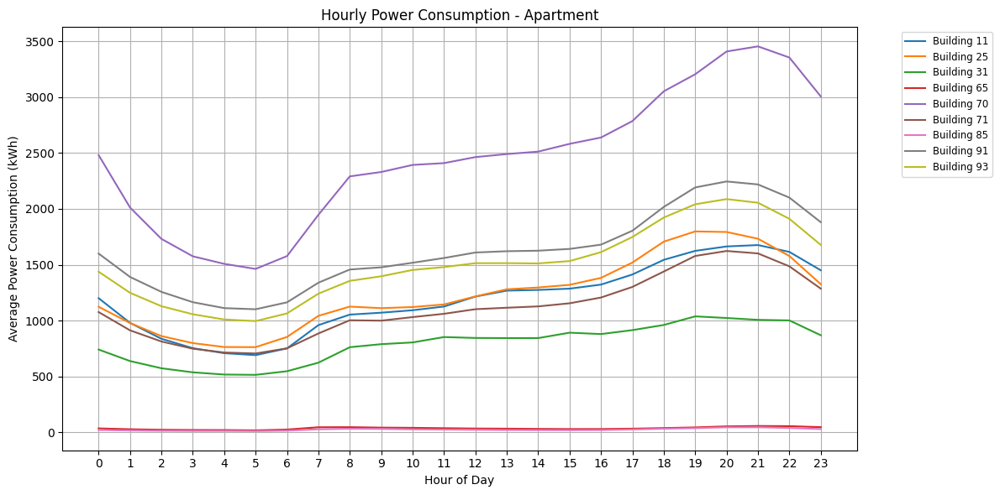

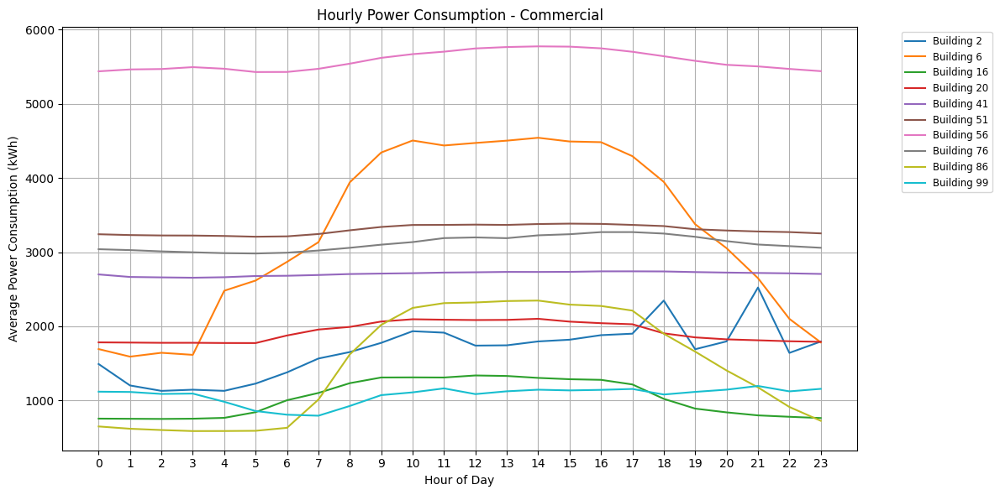

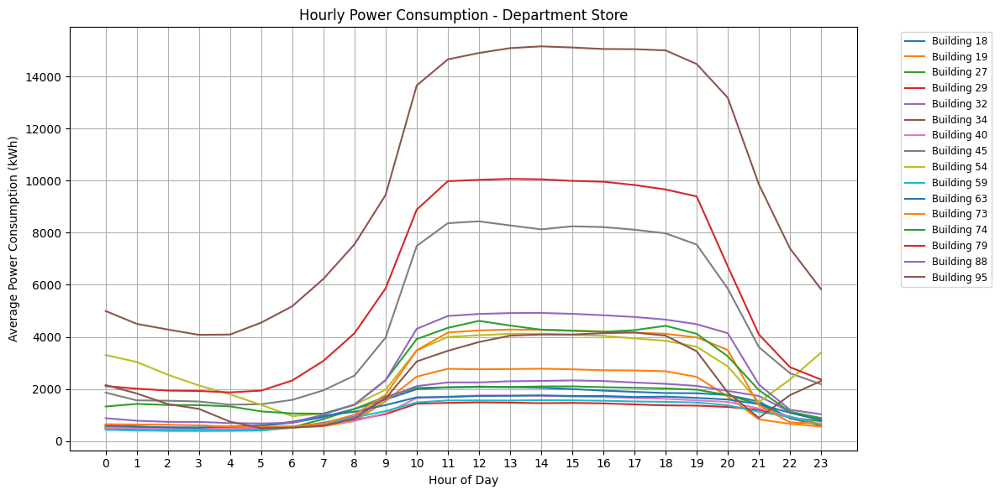

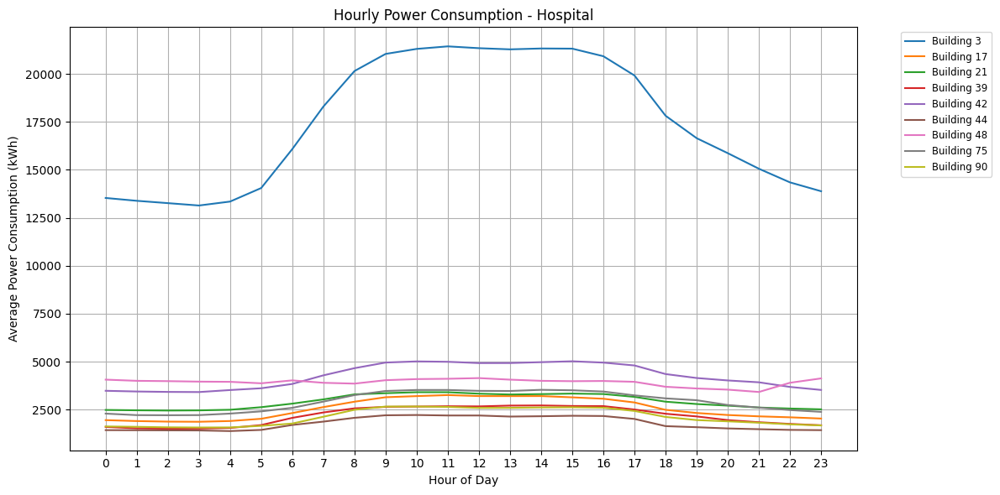

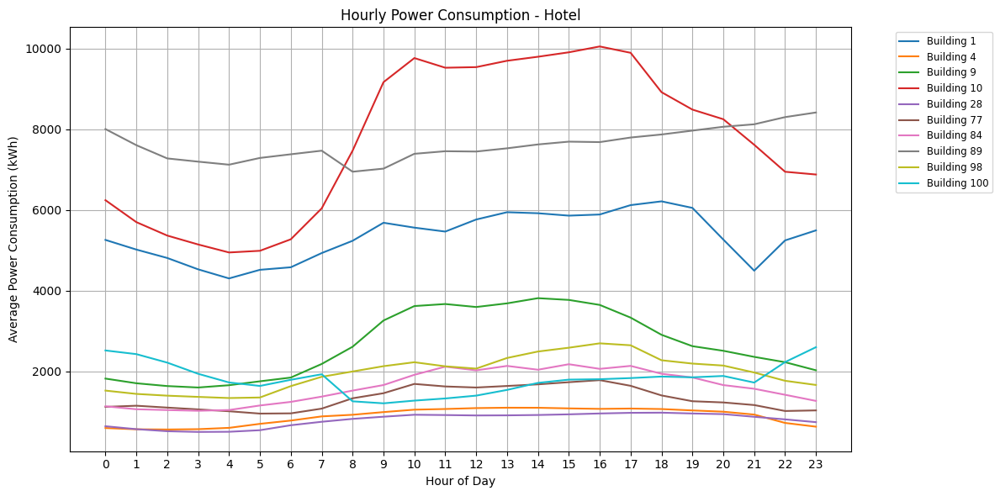

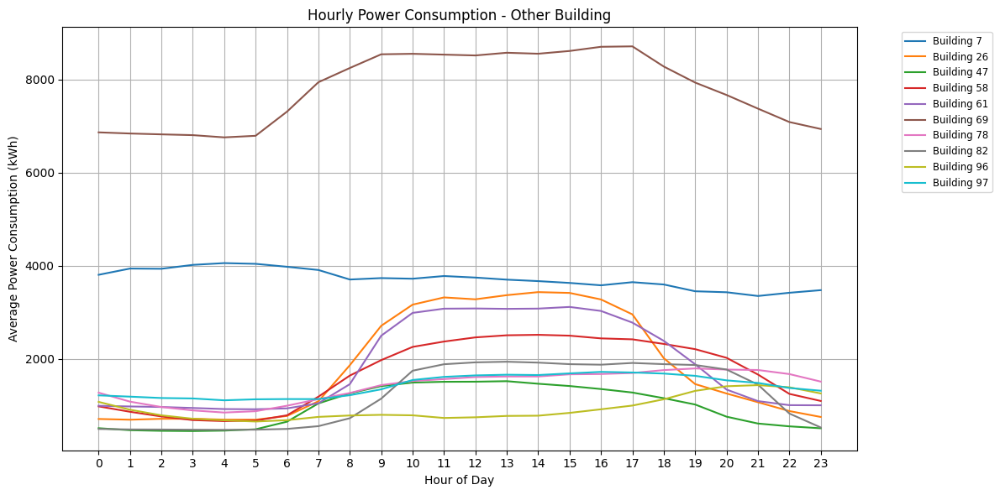

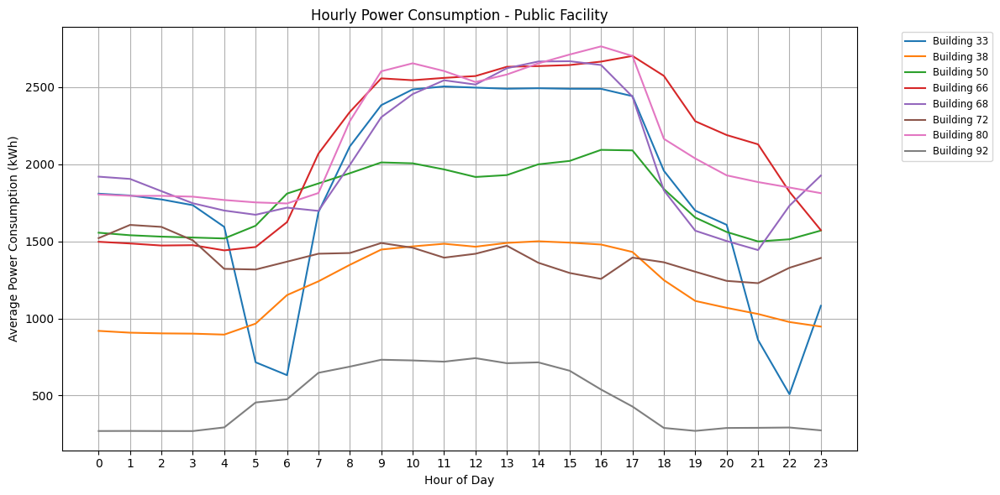

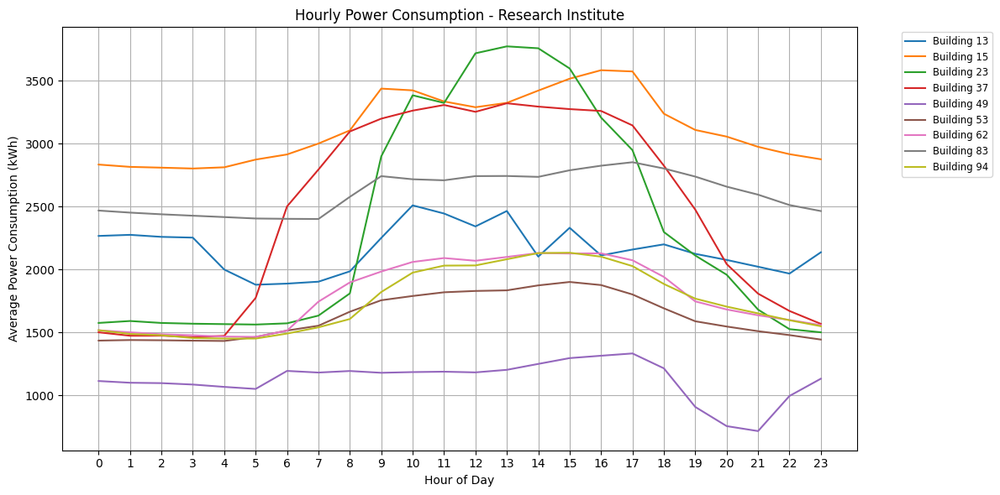

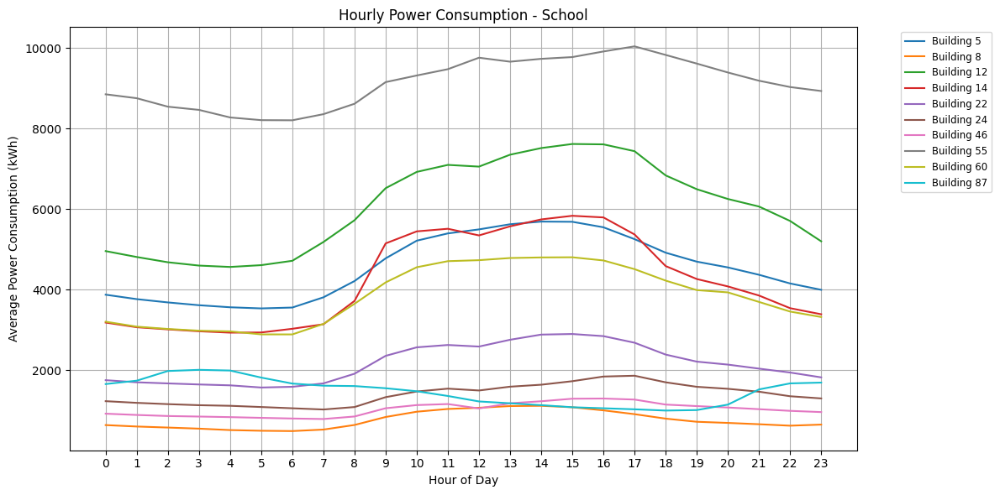

In [39]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_by_building_type(train, bld):
    # Merge usage data with building info to get type
    df = train.merge(bld[['Building Number', 'Building Type']], on='Building Number', how='left')

    # Exclude IDC
    df = df[df['Building Type'] != 'IDC (Telecom Center)']

    # Extract hour
    df['Hour'] = pd.to_datetime(df['Datetime']).dt.hour

    # Loop over each building type
    for btype, group_type in df.groupby('Building Type'):
        plt.figure(figsize=(12, 6))
        
        # Plot each building in this type
        for bnum, group_bld in group_type.groupby('Building Number'):
            hourly_avg = group_bld.groupby('Hour')['Power Consumption (kWh)'].mean()
            plt.plot(hourly_avg.index, hourly_avg.values, label=f'Building {bnum}')
        
        plt.title(f'Hourly Power Consumption - {btype}')
        plt.xlabel('Hour of Day')
        plt.ylabel('Average Power Consumption (kWh)')
        plt.xticks(range(0, 24))
        plt.grid(True)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        plt.tight_layout()
        plt.show()

# Usage:
plot_by_building_type(df_non_idc, bld)


In [40]:
# Select only numeric columns (correlation works on numbers)
numeric_df = train.select_dtypes(include=['number'])

# Correlation matrix
corr_matrix = numeric_df.corr()

# Correlation of Power Consumption with others
power_corr = corr_matrix['Power Consumption (kWh)'].drop('Power Consumption (kWh)')
print(power_corr.sort_values(ascending=False))


Temperature (°C)           0.124400
Solar Radiation (MJ/m²)    0.109885
Hour                       0.069610
Sunshine Duration (hr)     0.065969
Wind Speed (m/s)           0.022214
Day                        0.012565
Precipitation (mm)         0.009452
Humidity (%)              -0.082530
Building Number           -0.147515
Name: Power Consumption (kWh), dtype: float64


C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


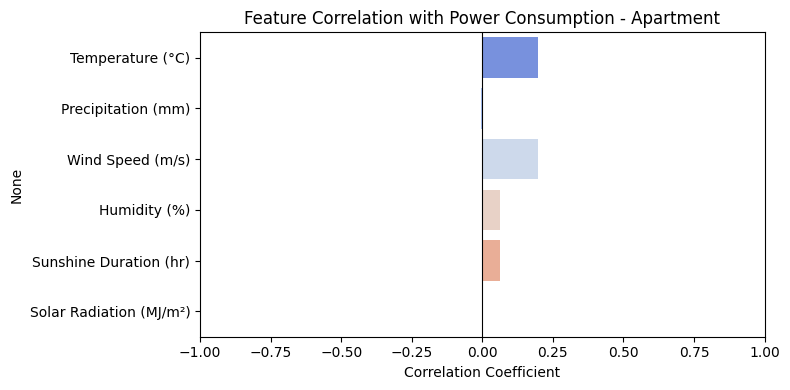

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


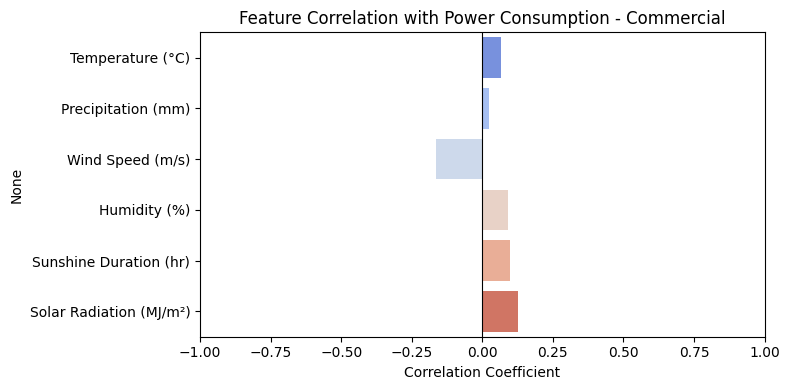

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


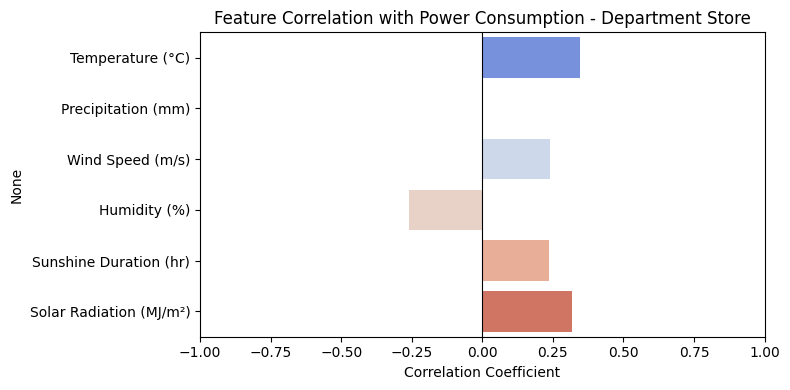

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


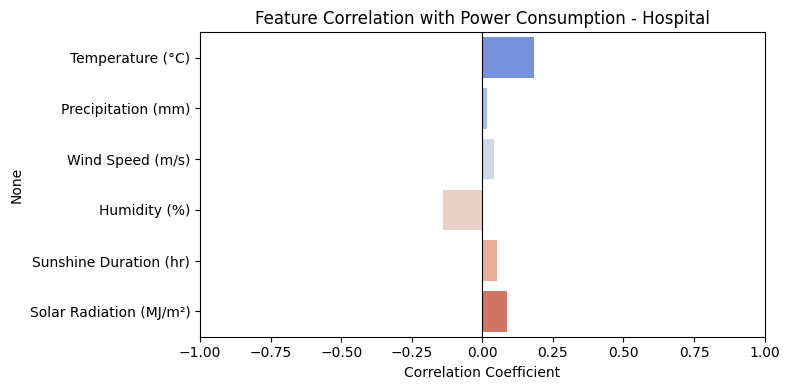

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


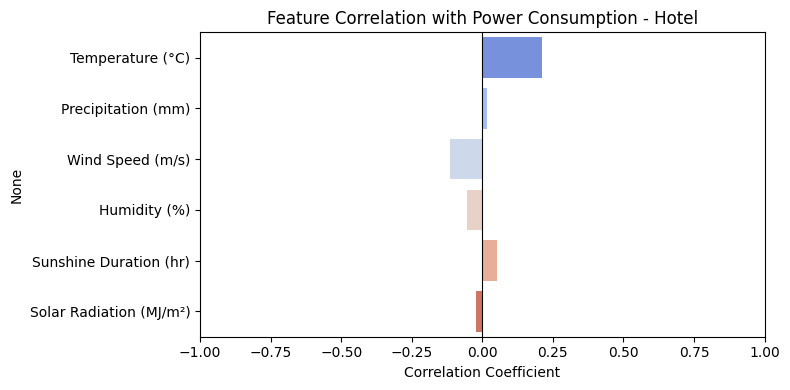

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


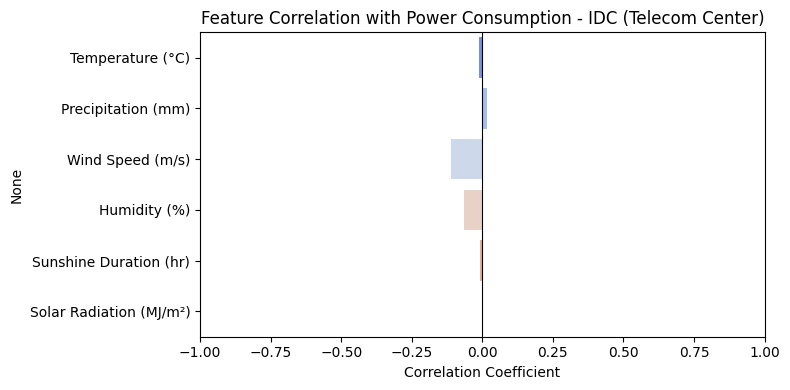

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


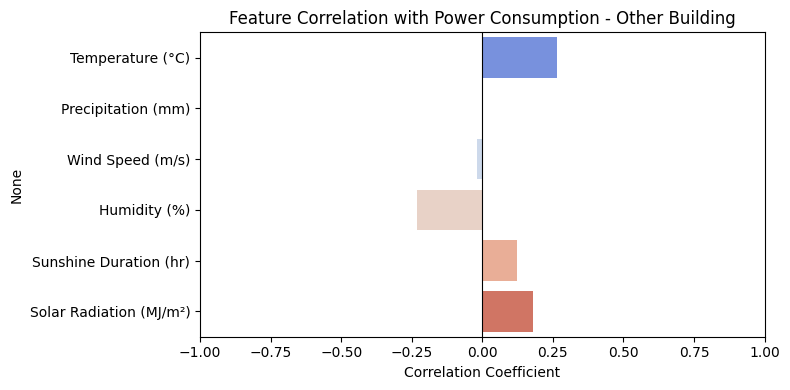

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


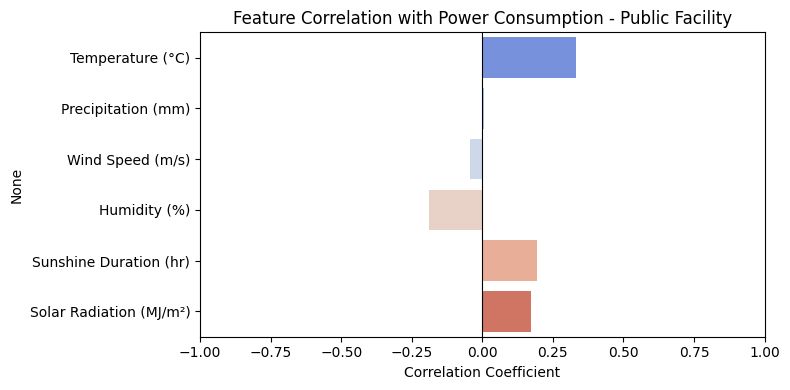

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


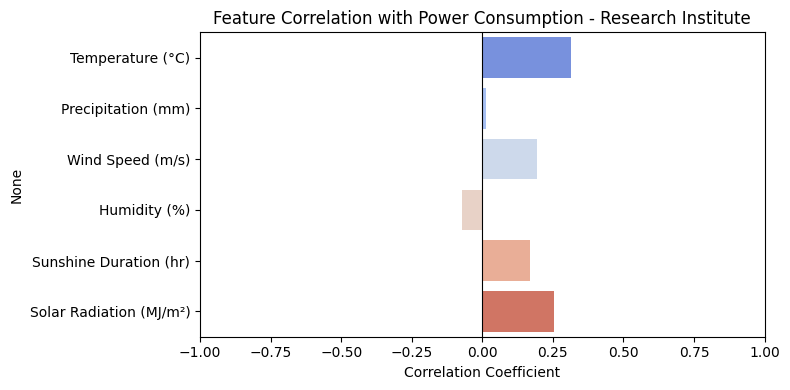

C:\Users\Dell\AppData\Local\Temp\ipykernel_25908\3605977053.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)


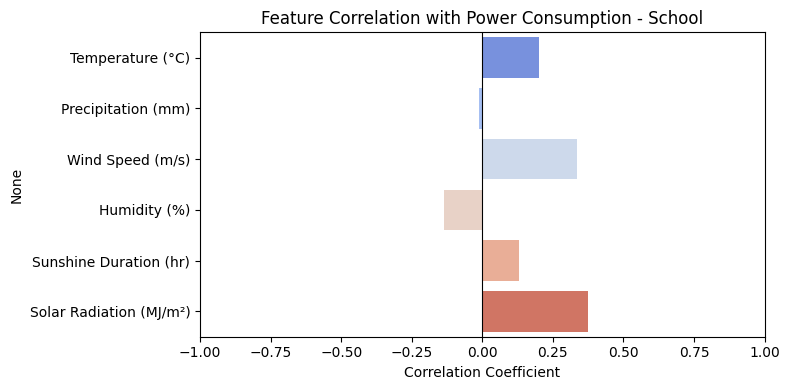

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Merge datasets to get Building Type for each record
df_merged = train.merge(
    bld[['Building Number', 'Building Type']], 
    on='Building Number', how='left'
)

# Filter out IDC buildings (if you want)
df_non_idc = df_merged[df_merged['Building Type'] != 'IDC(전화국)']

numeric_cols = [
    'Temperature (°C)', 'Precipitation (mm)', 'Wind Speed (m/s)', 
    'Humidity (%)', 'Sunshine Duration (hr)', 'Solar Radiation (MJ/m²)', 
    'Power Consumption (kWh)'
]

# Loop through each building type
for btype, group in df_non_idc.groupby('Building Type'):
    # Calculate correlation matrix for this building type
    corr = group[numeric_cols].corr()
    
    # Get correlation of each feature with power consumption
    corr_power = corr['Power Consumption (kWh)'].drop('Power Consumption (kWh)')
    
    # Plot bar chart
    plt.figure(figsize=(8,4))
    sns.barplot(x=corr_power.values, y=corr_power.index, palette='coolwarm', dodge=False)
    plt.title(f'Feature Correlation with Power Consumption - {btype}')
    plt.xlabel('Correlation Coefficient')
    plt.xlim(-1, 1)
    plt.axvline(0, color='black', linewidth=0.8)
    plt.tight_layout()
    plt.show()


Plotting for Building Type: Hotel with 10 buildings


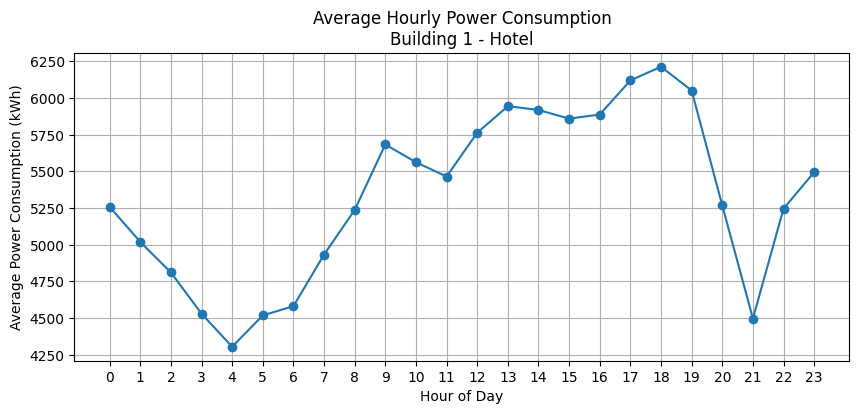

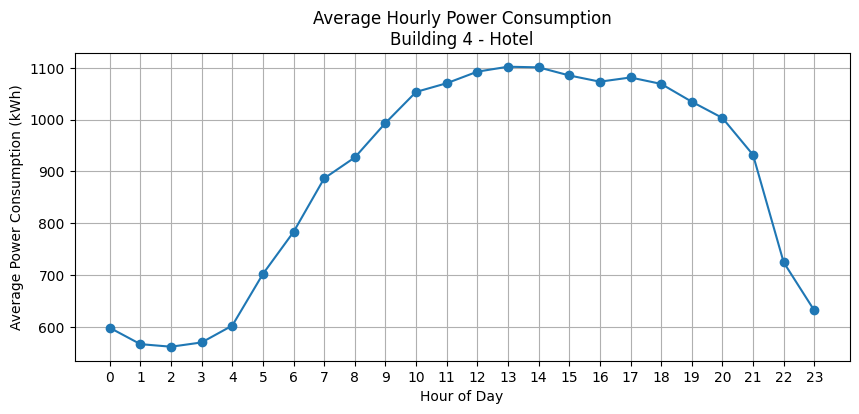

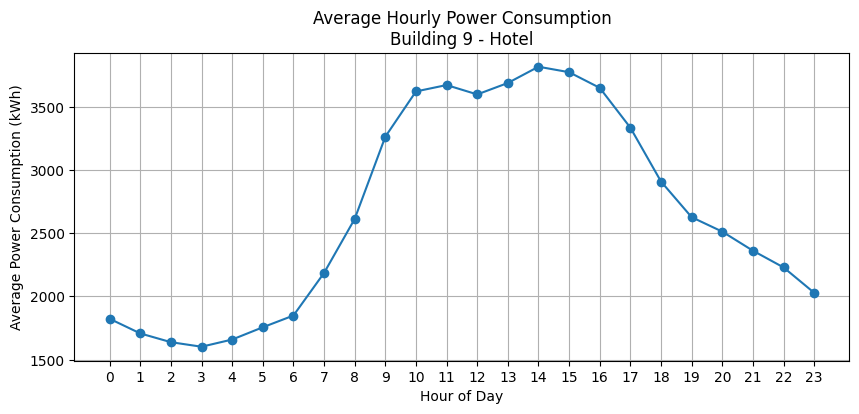

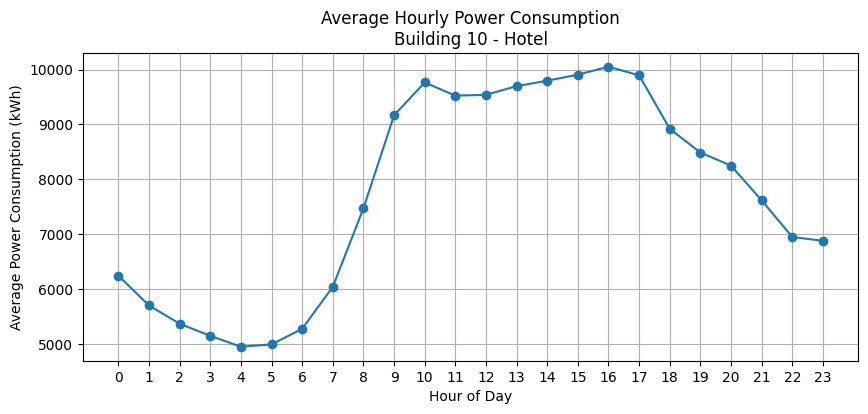

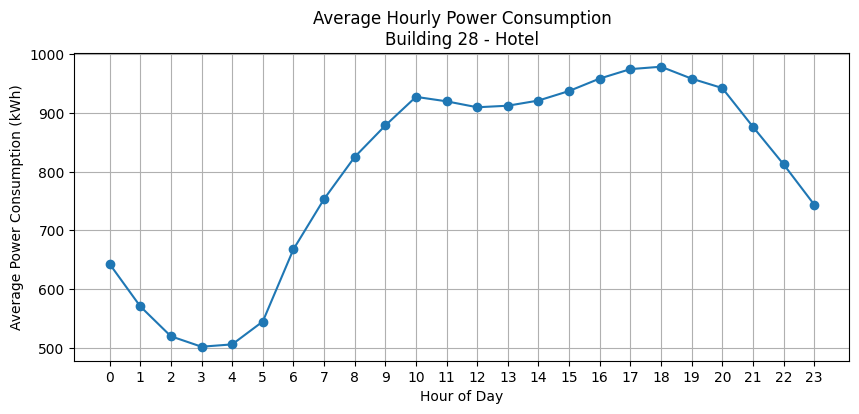

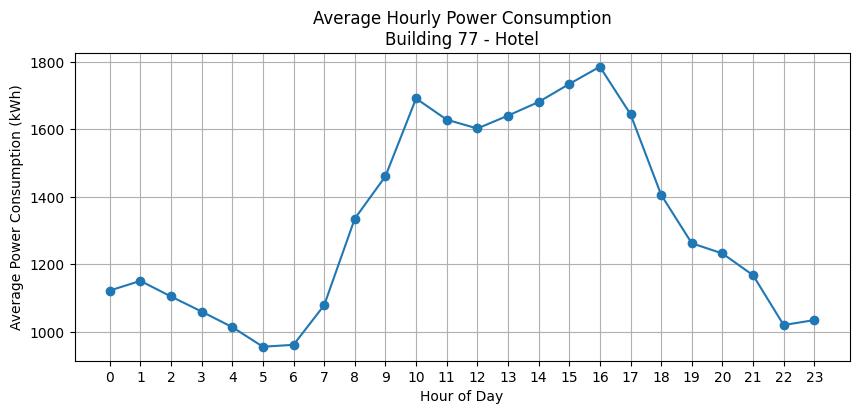

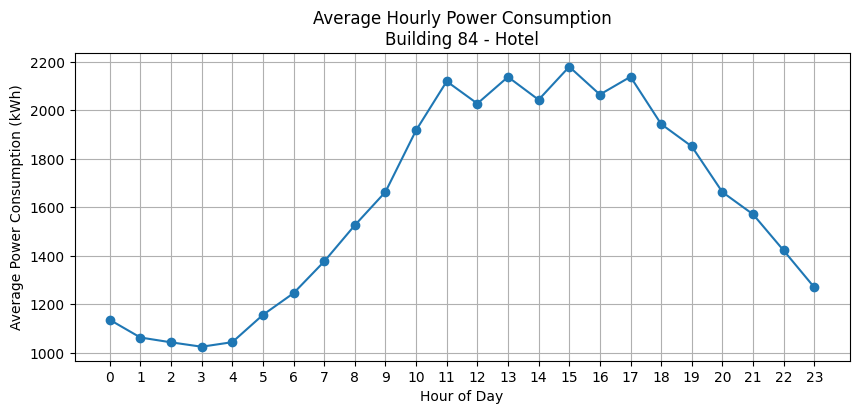

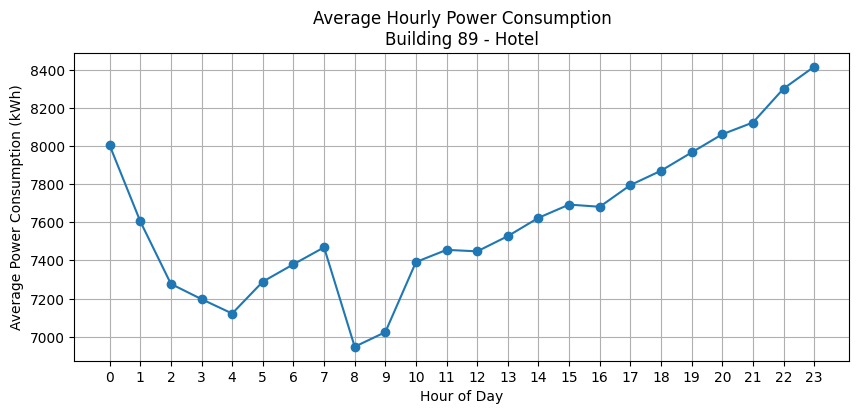

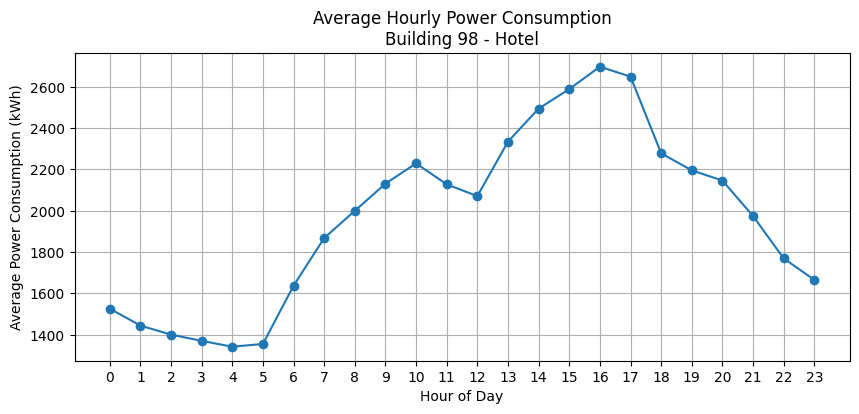

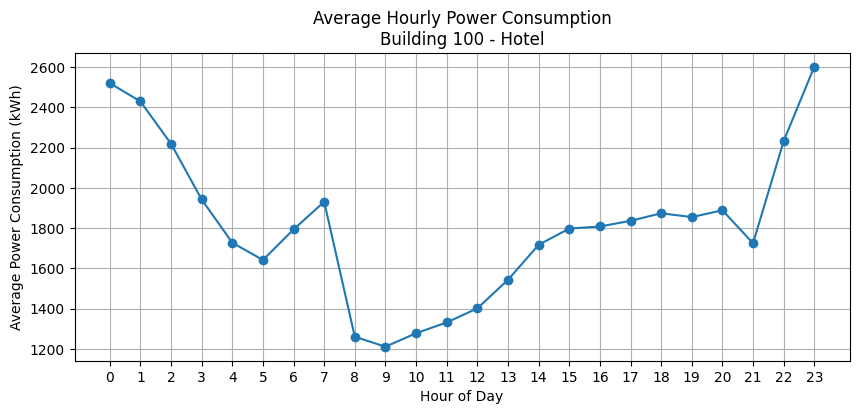

Plotting for Building Type: Commercial with 10 buildings


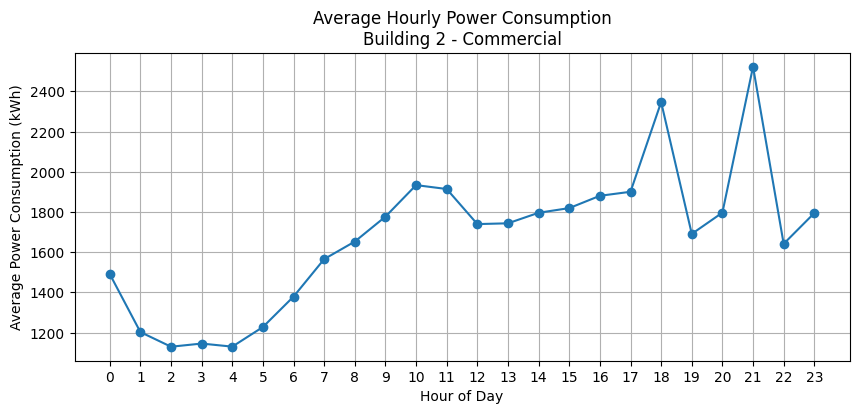

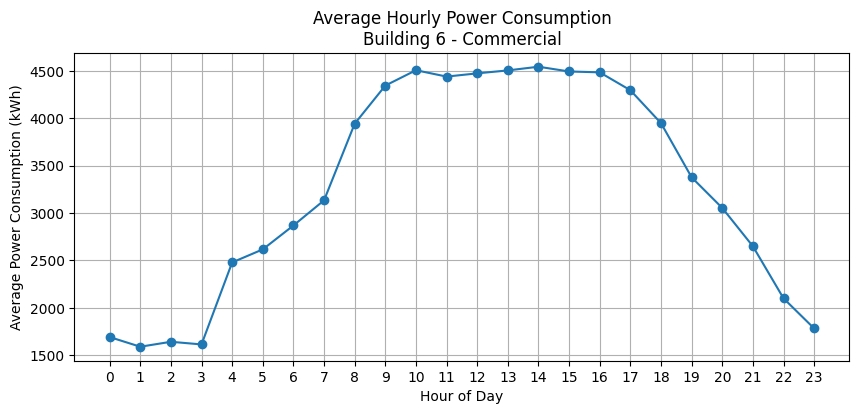

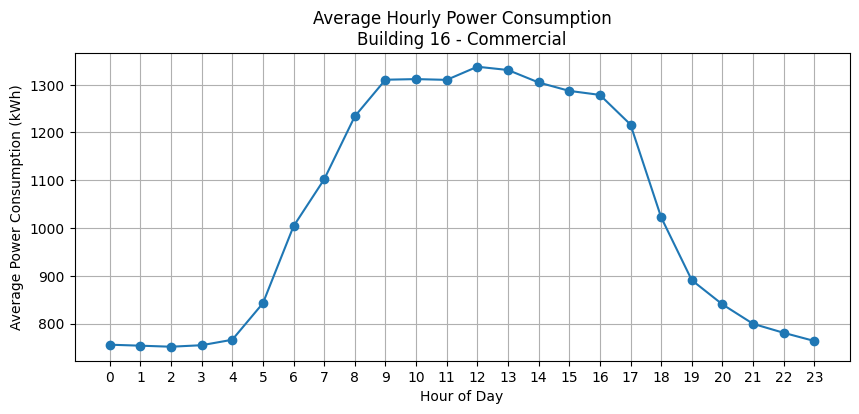

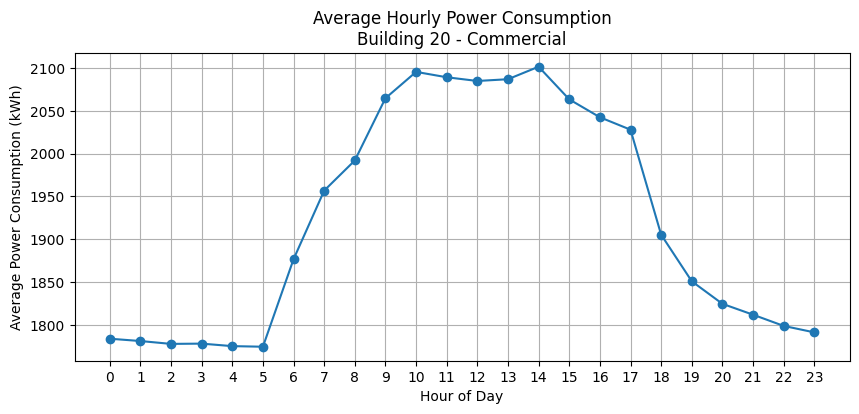

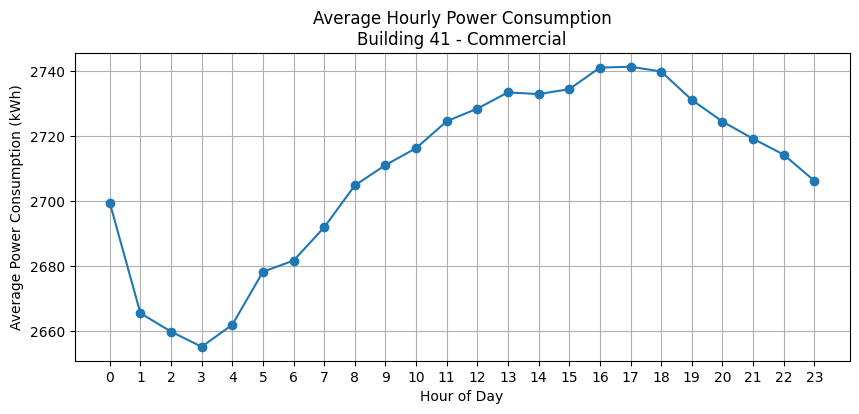

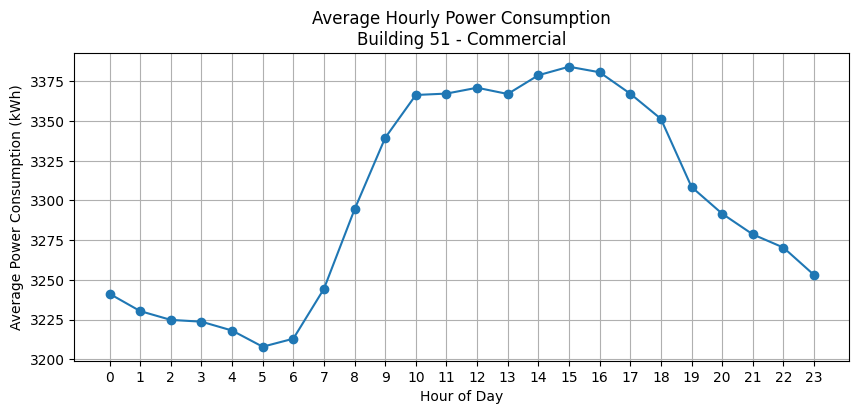

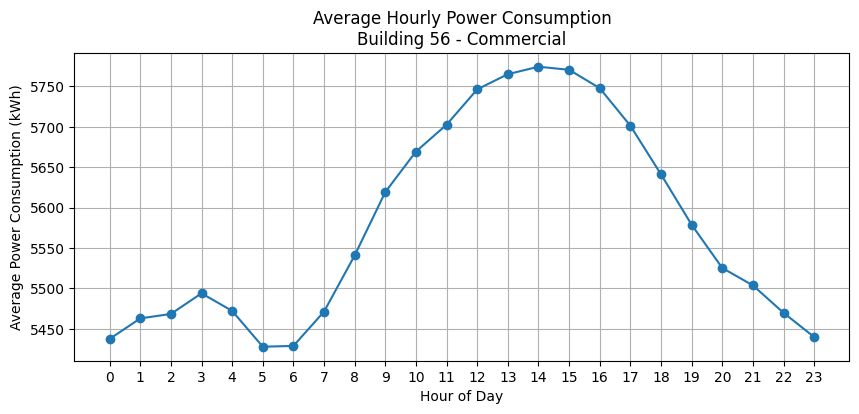

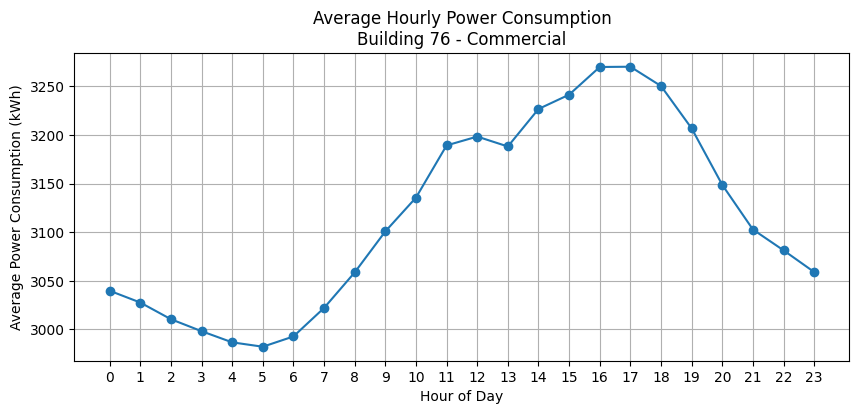

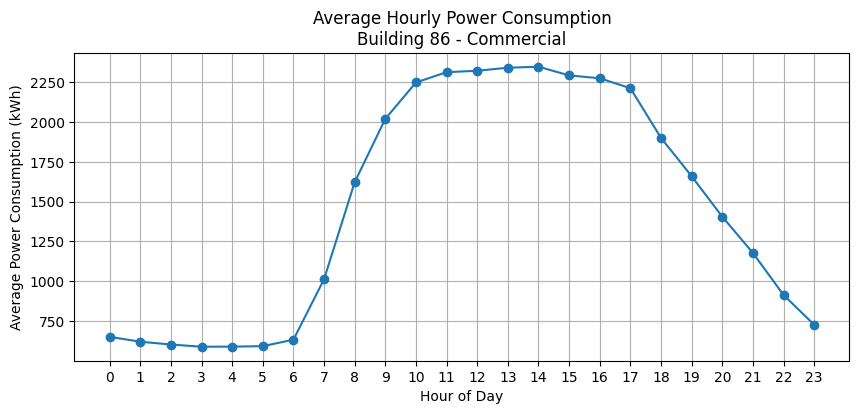

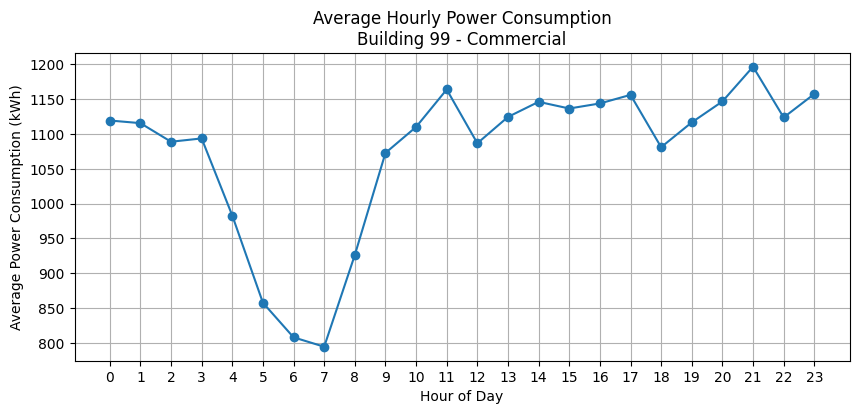

Plotting for Building Type: Hospital with 9 buildings


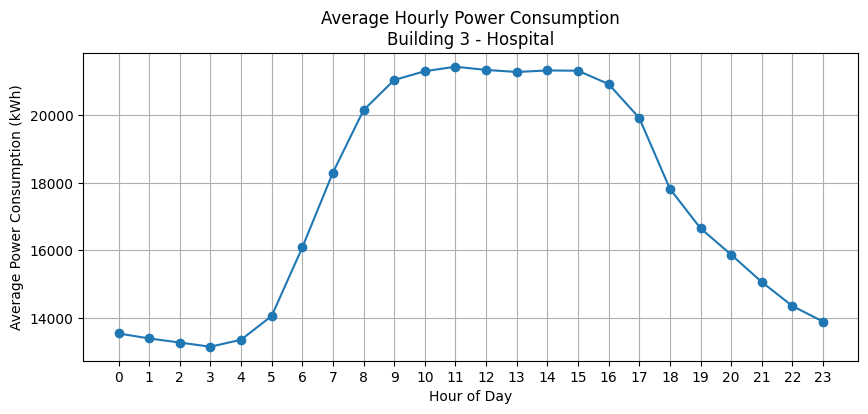

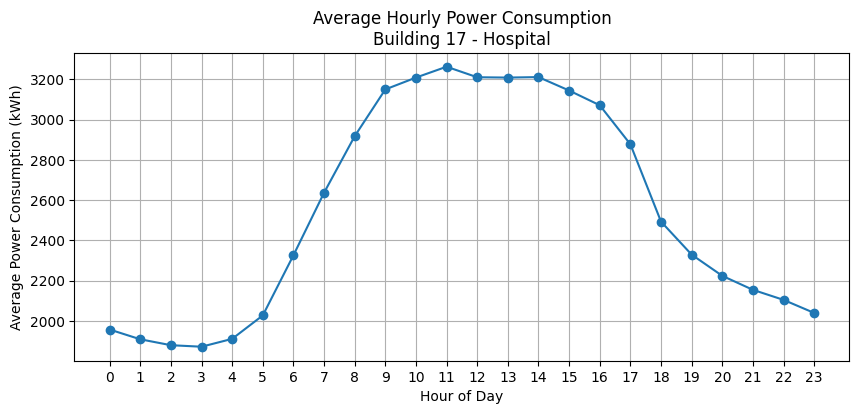

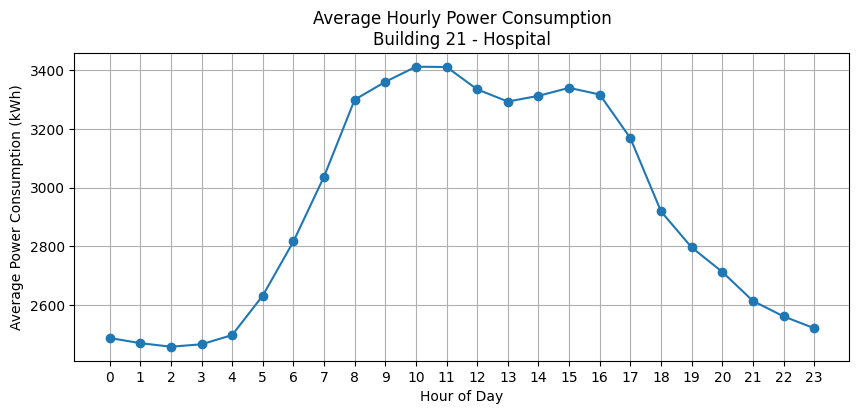

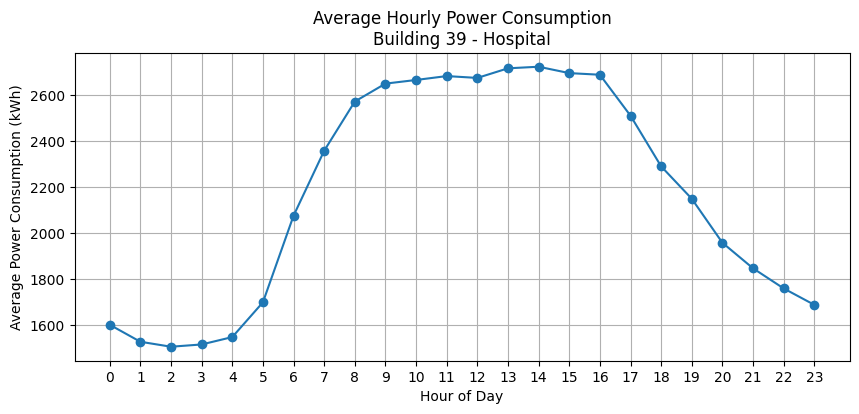

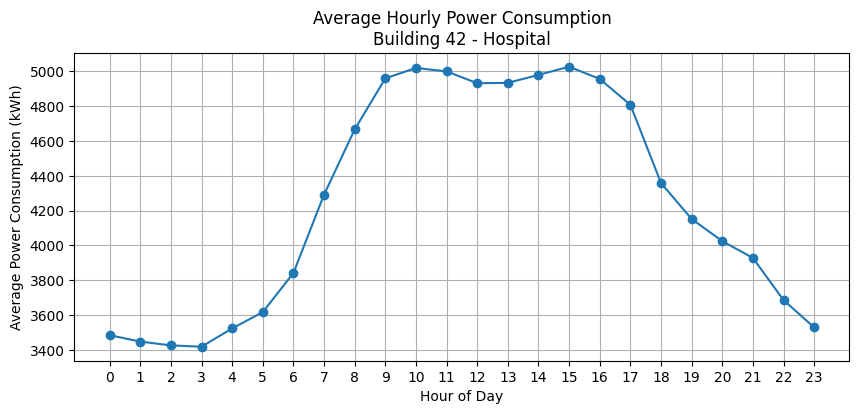

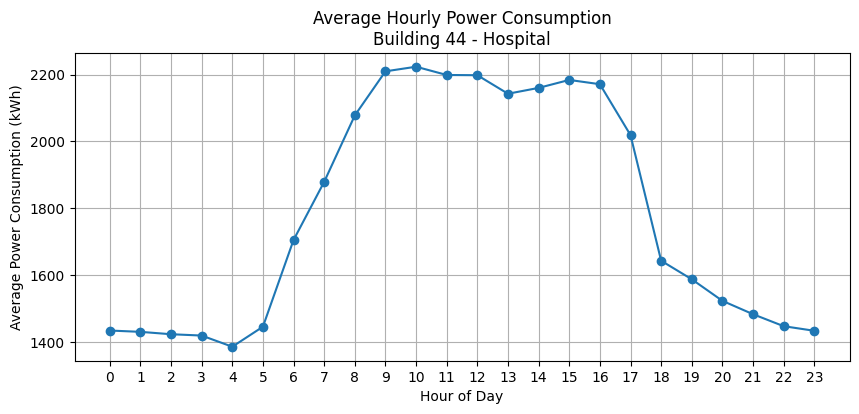

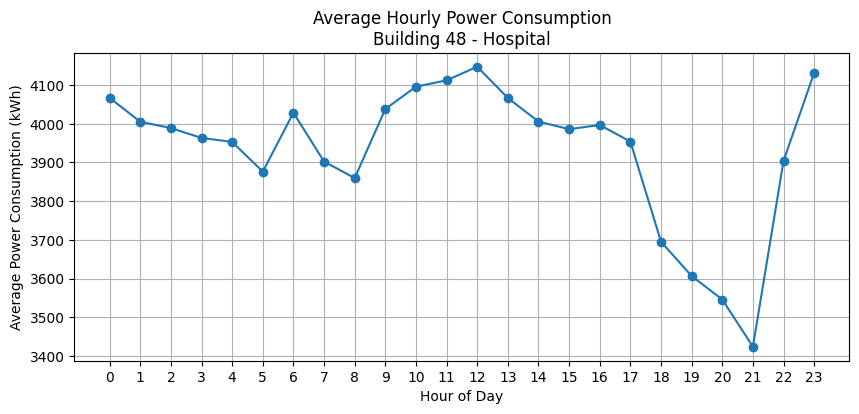

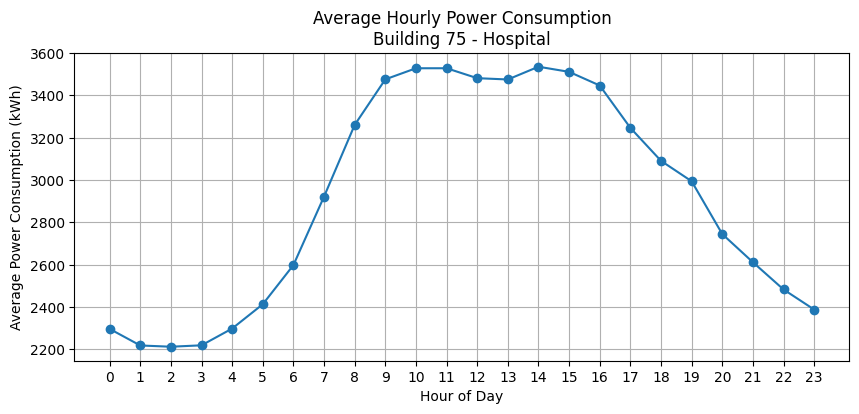

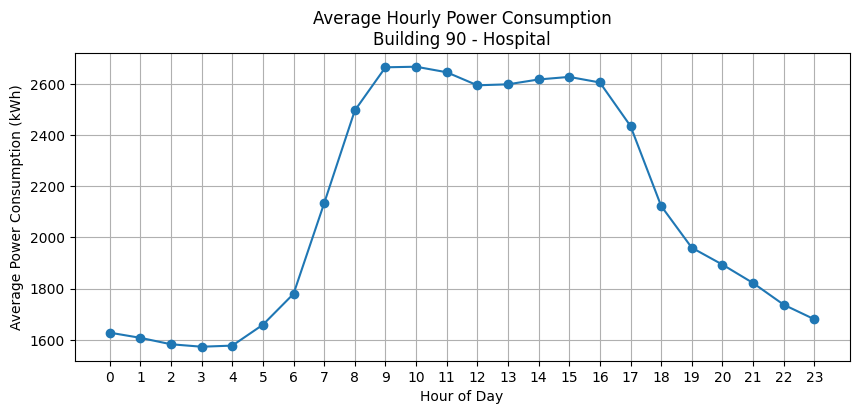

Plotting for Building Type: School with 10 buildings


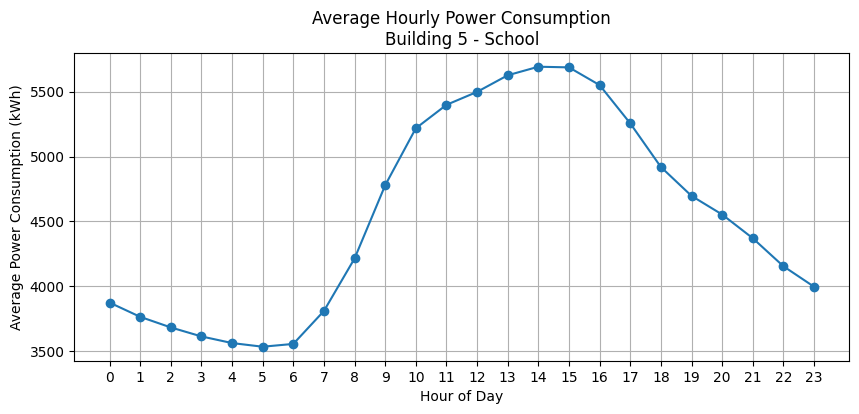

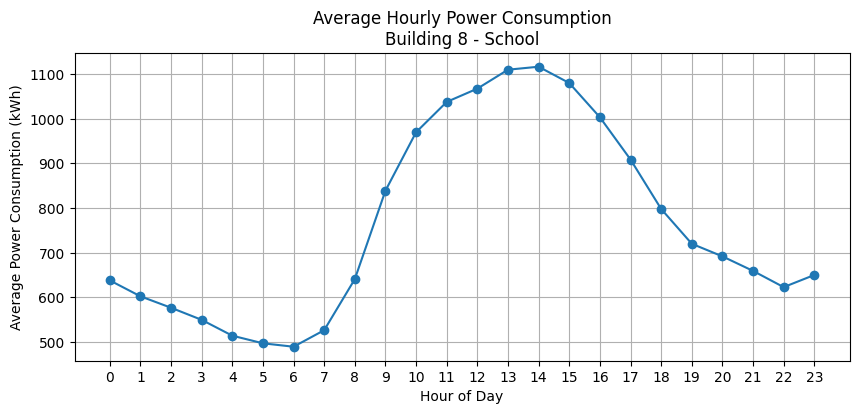

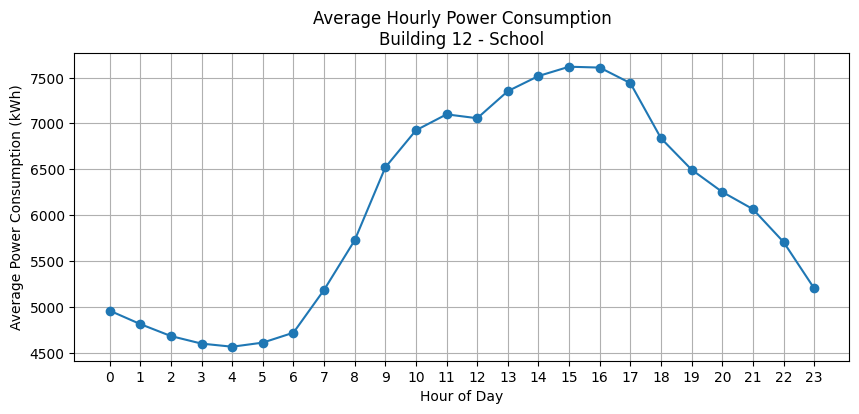

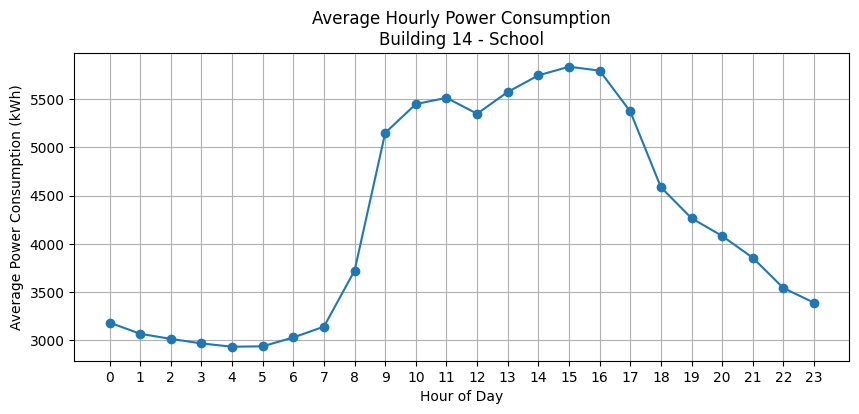

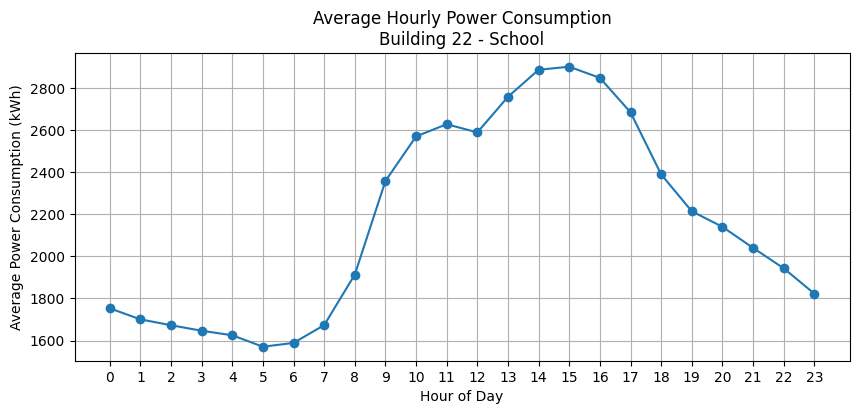

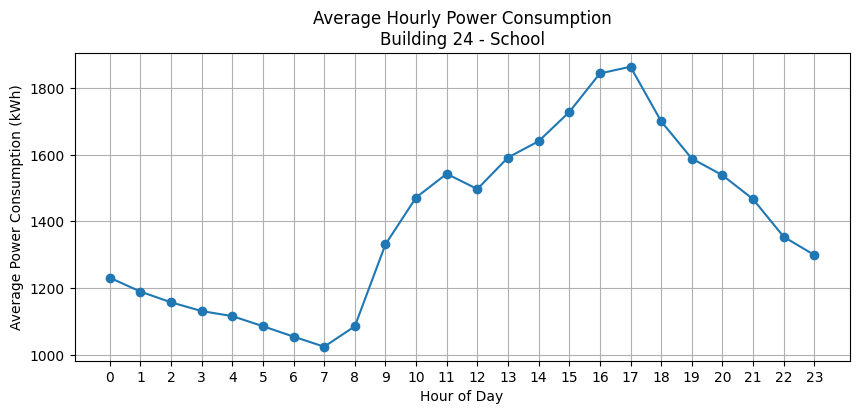

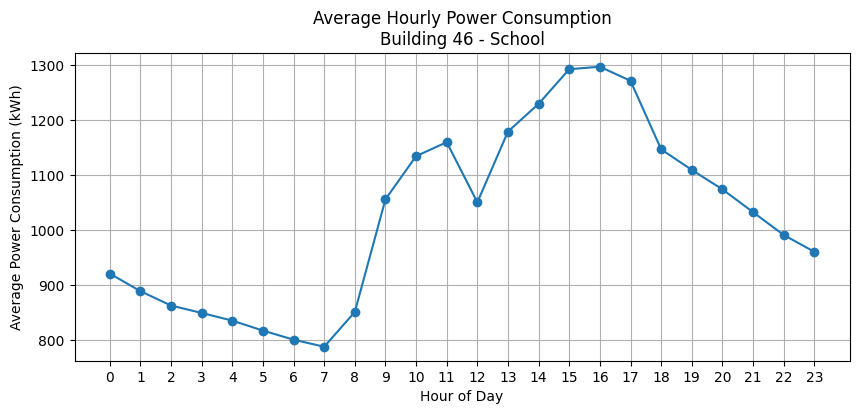

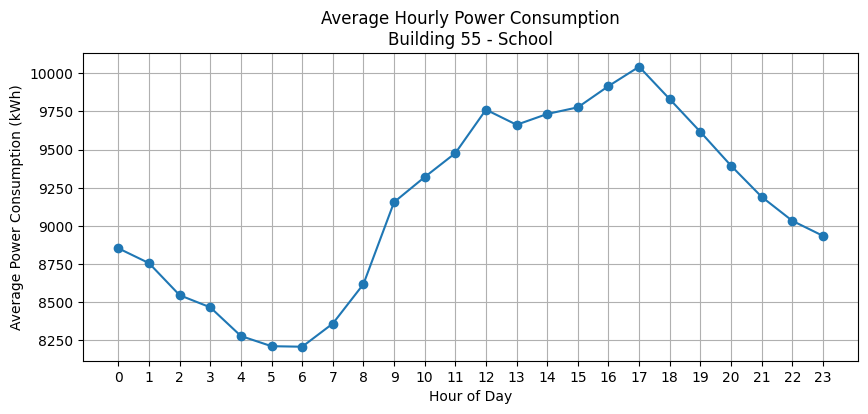

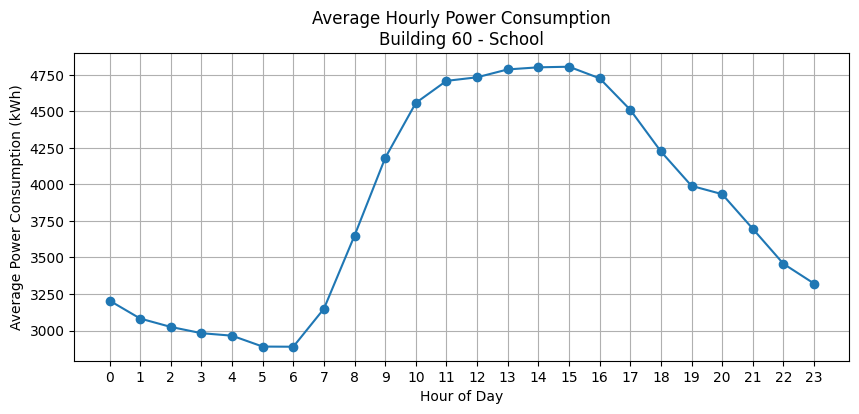

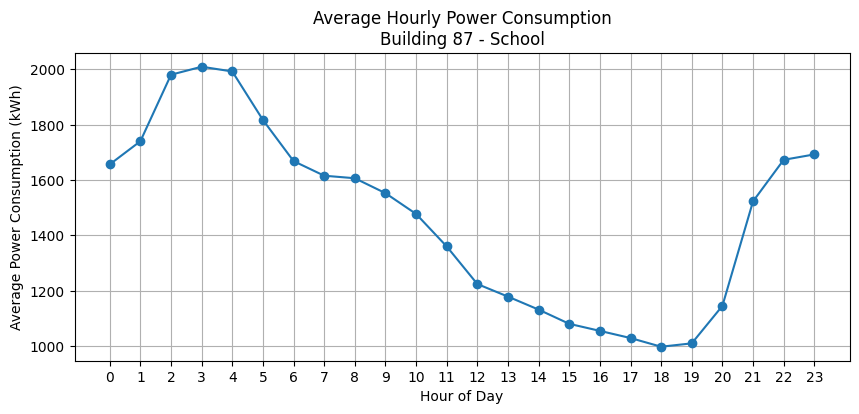

Plotting for Building Type: Other Building with 10 buildings


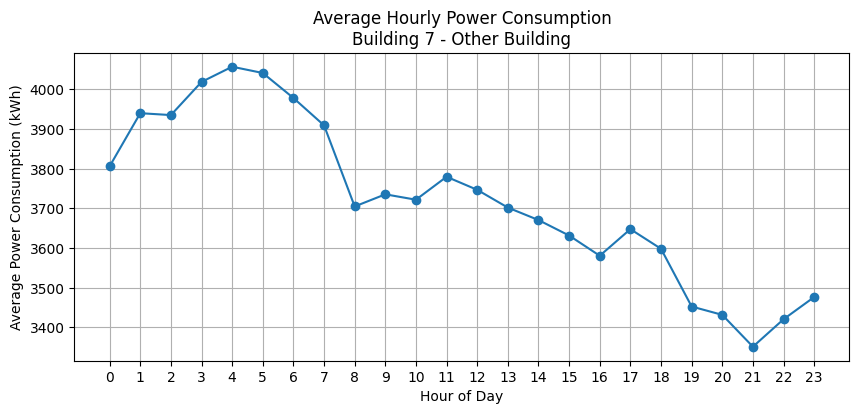

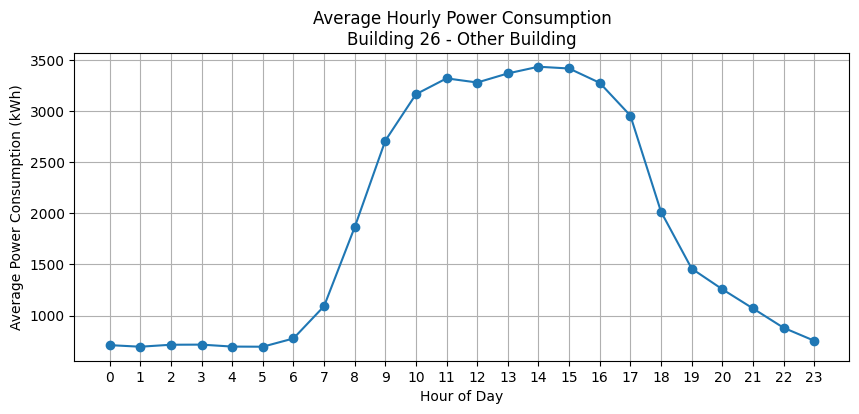

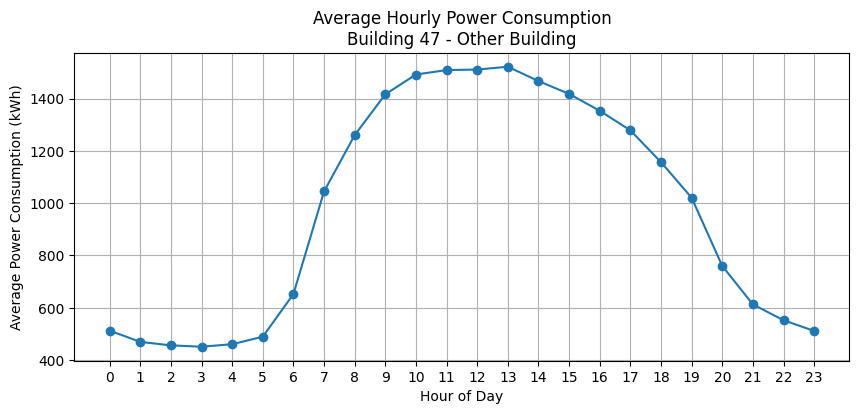

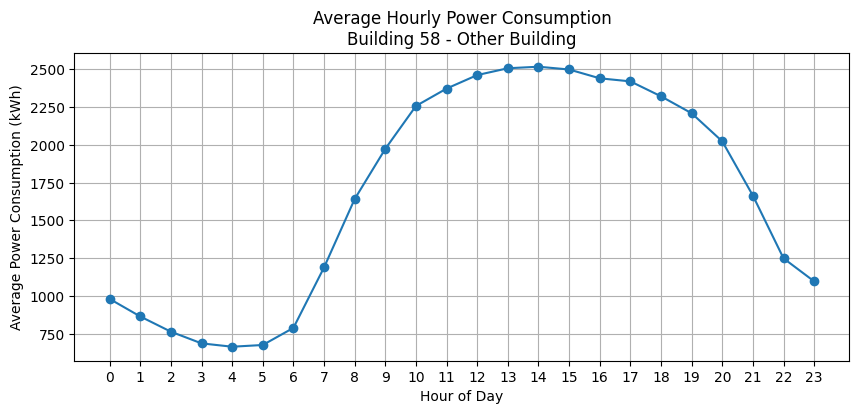

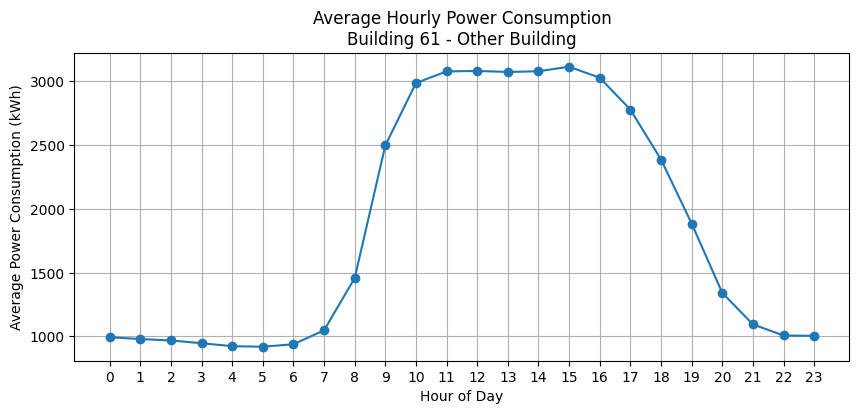

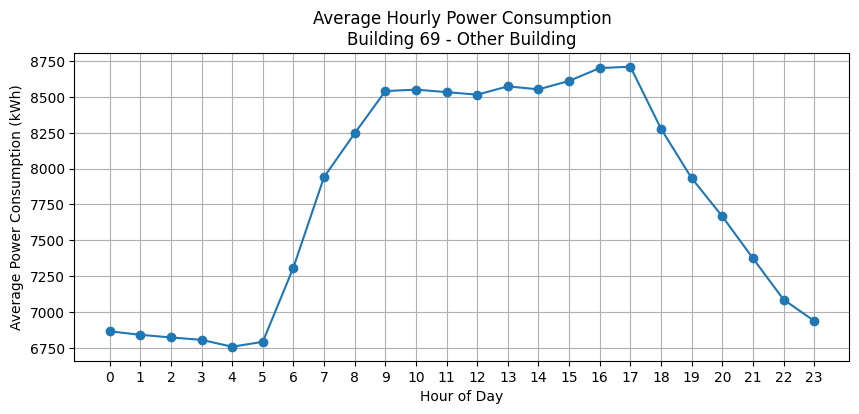

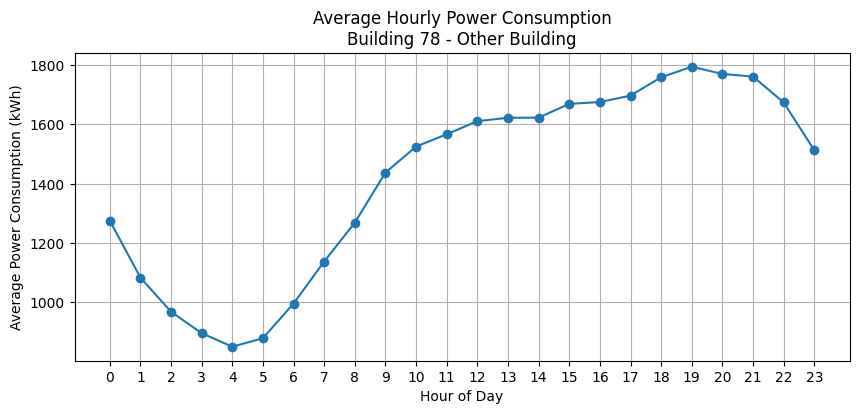

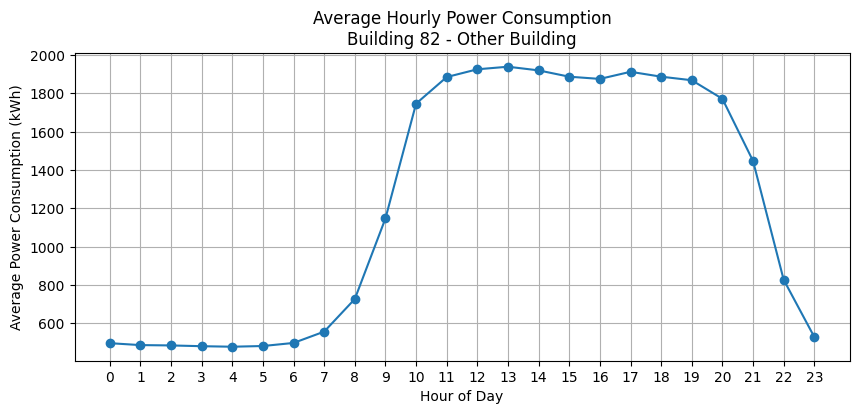

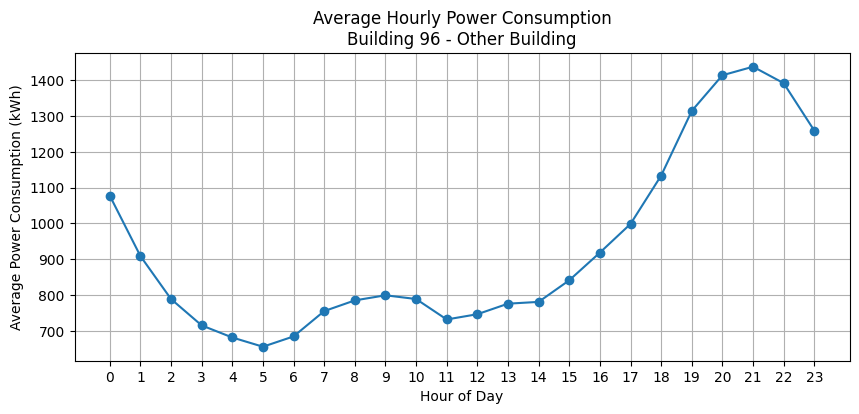

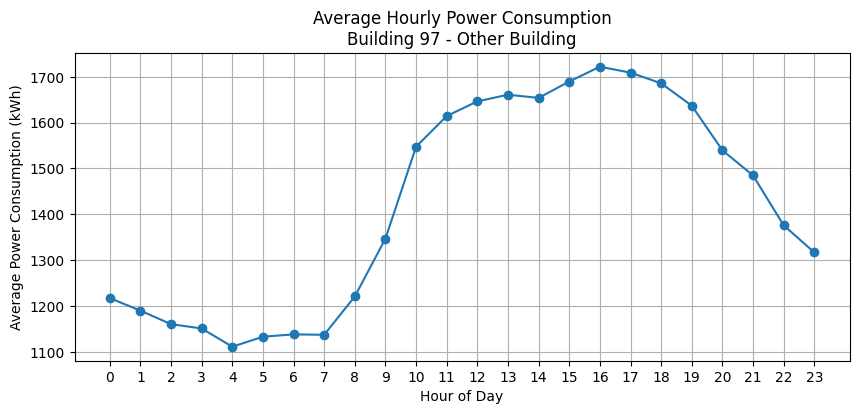

Plotting for Building Type: Apartment with 9 buildings


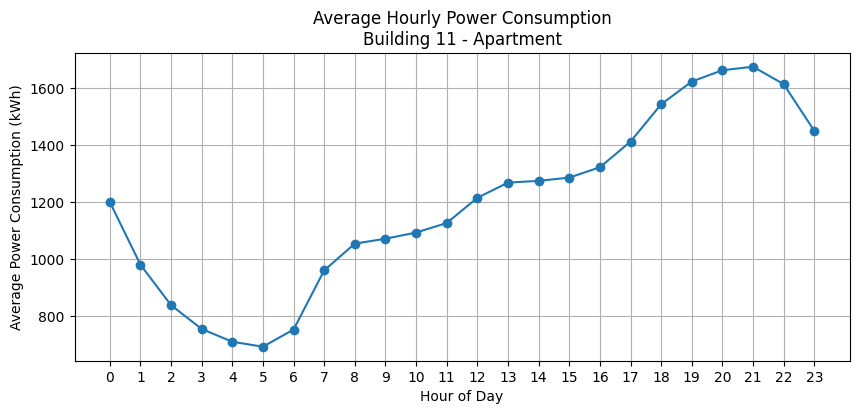

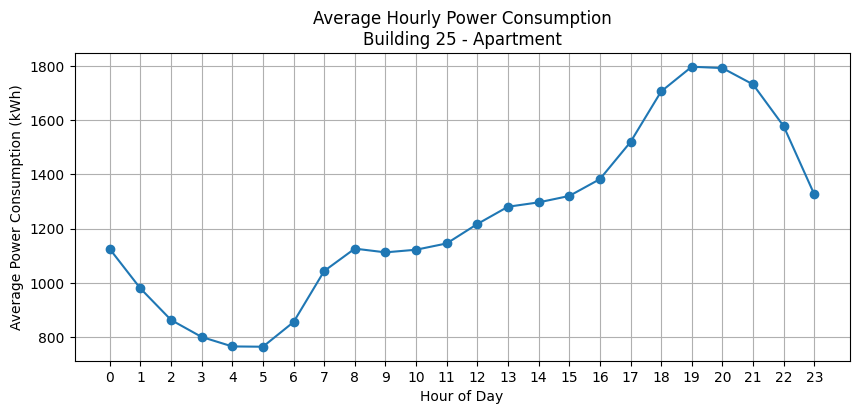

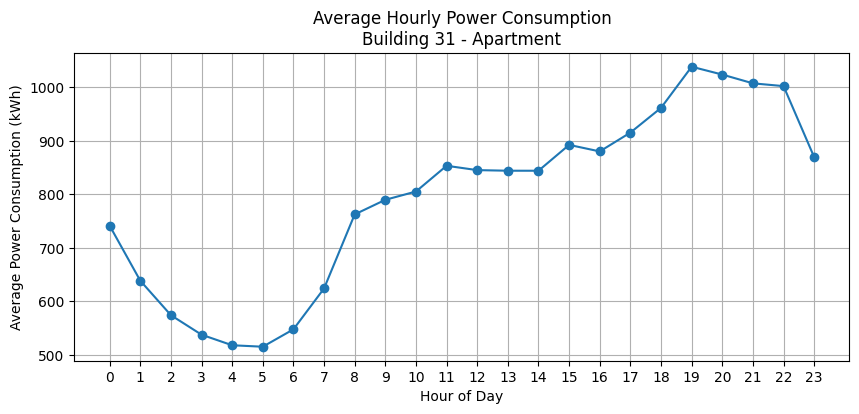

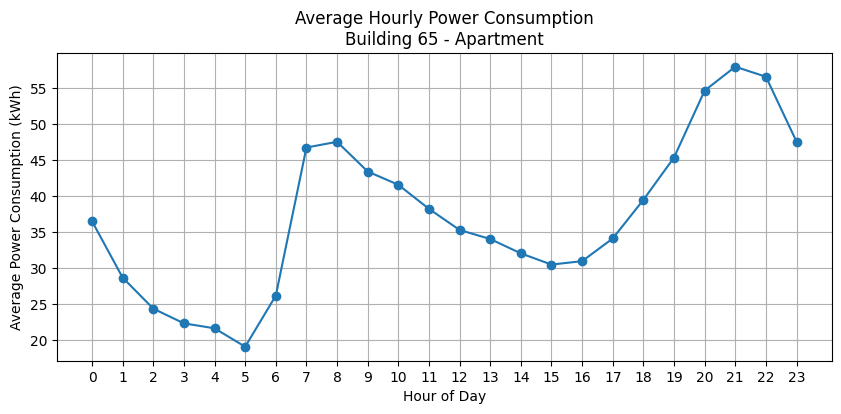

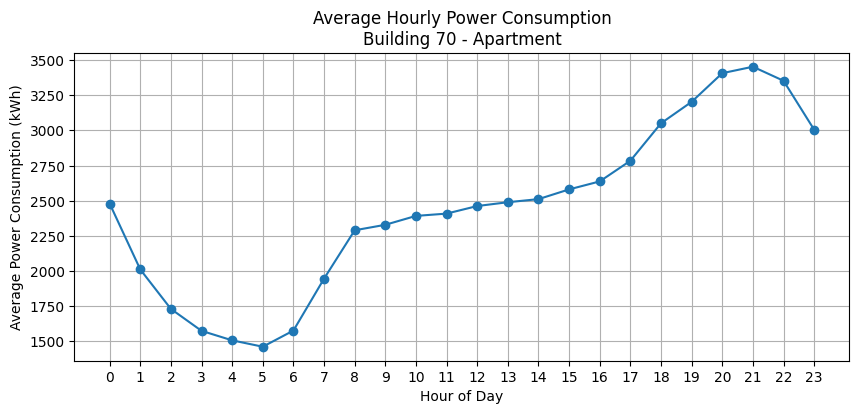

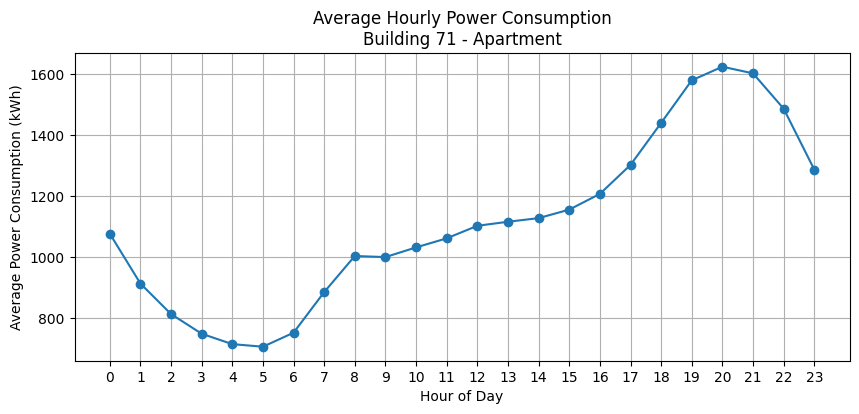

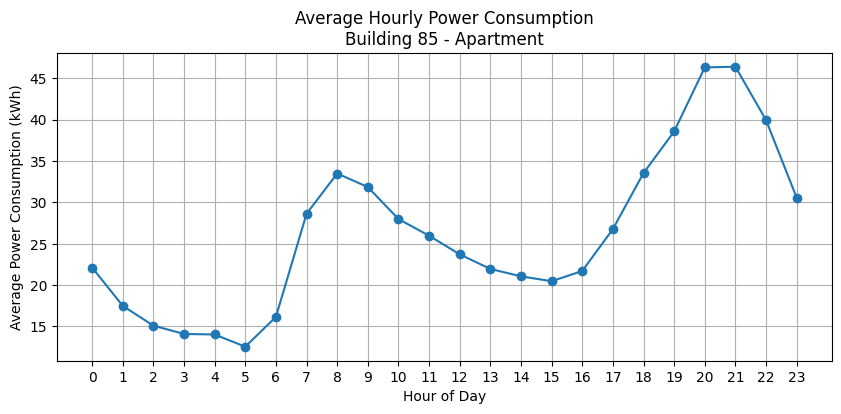

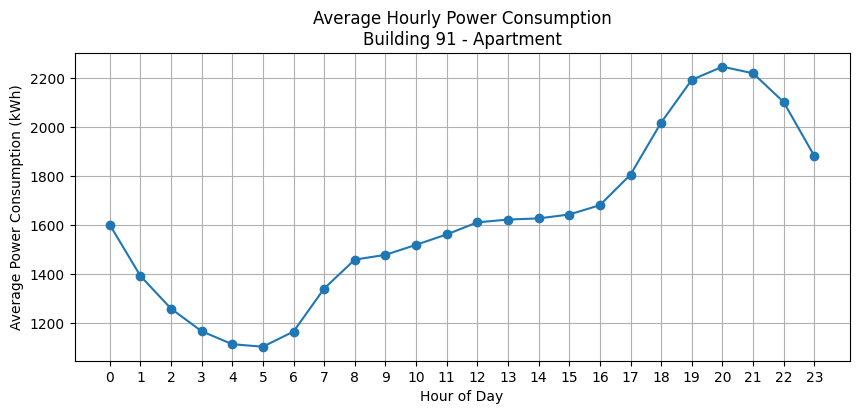

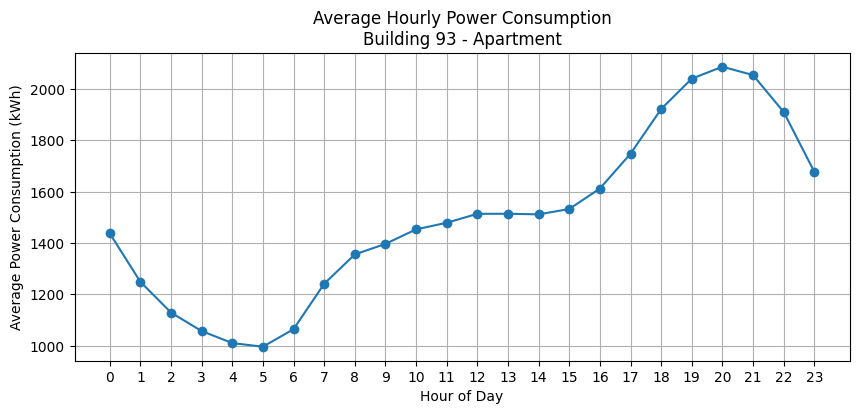

Plotting for Building Type: Research Institute with 9 buildings


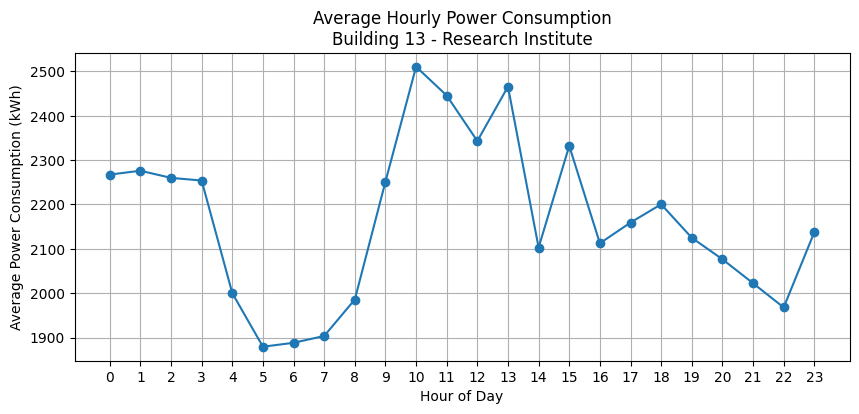

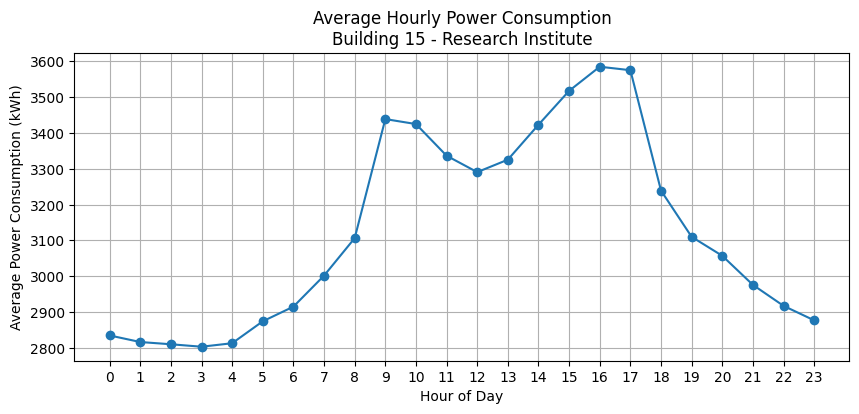

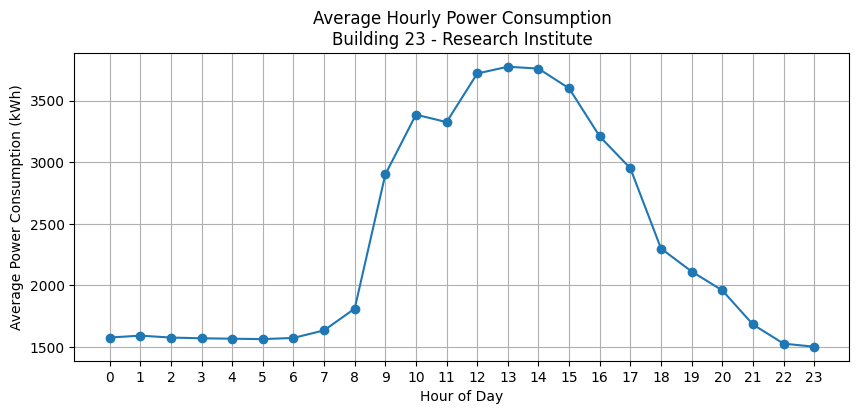

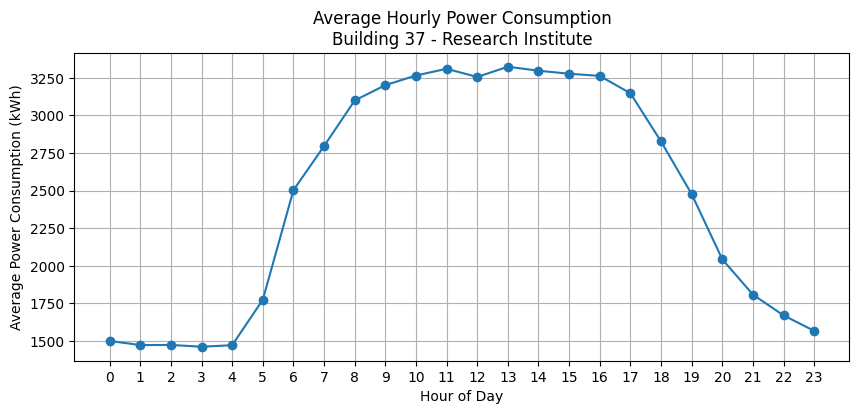

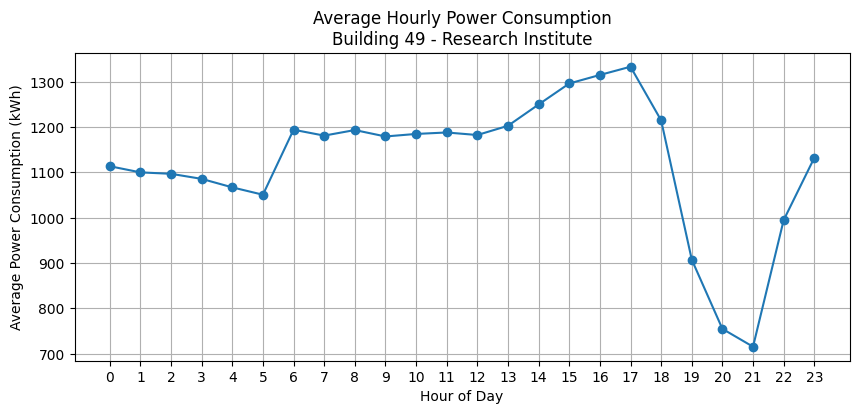

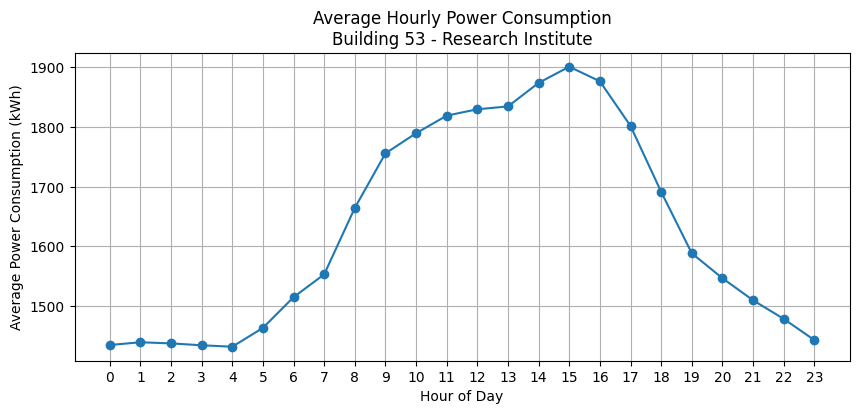

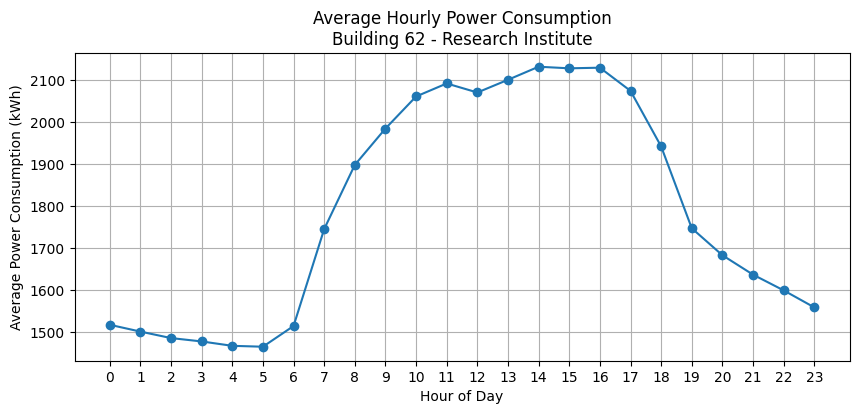

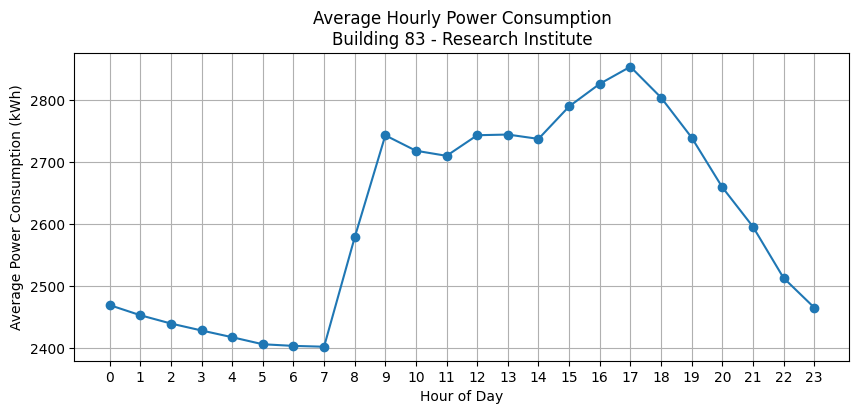

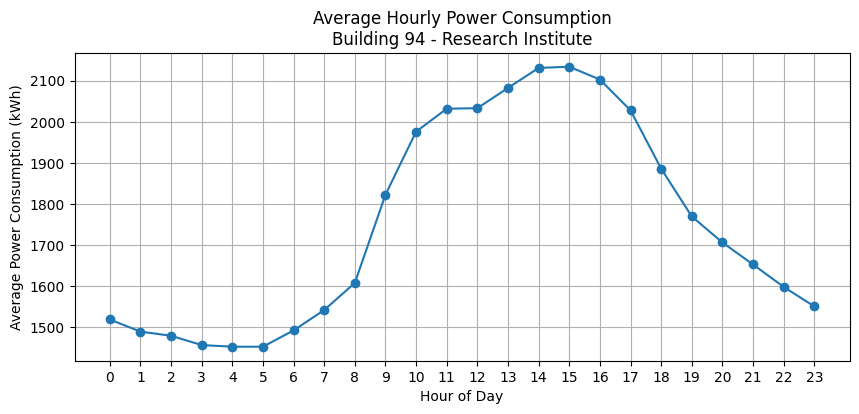

Plotting for Building Type: Department Store with 16 buildings


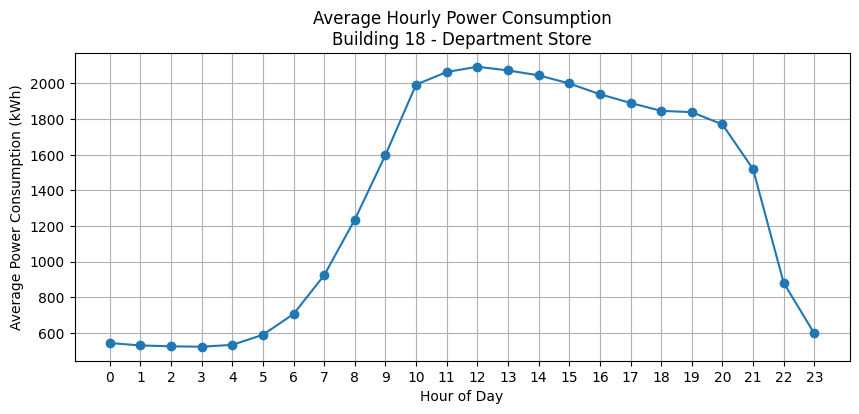

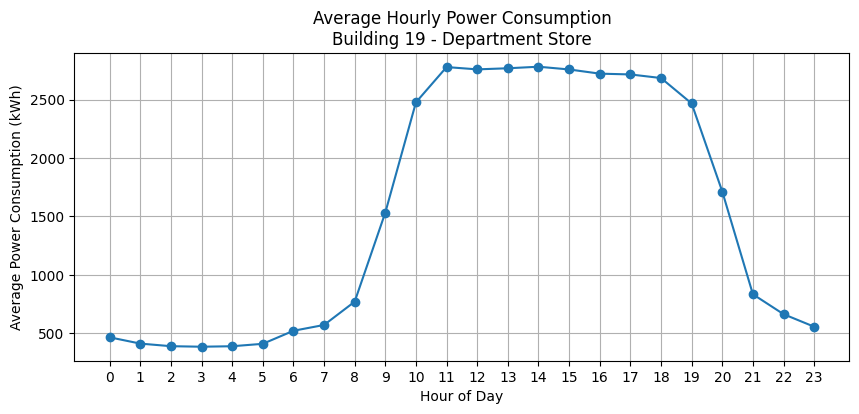

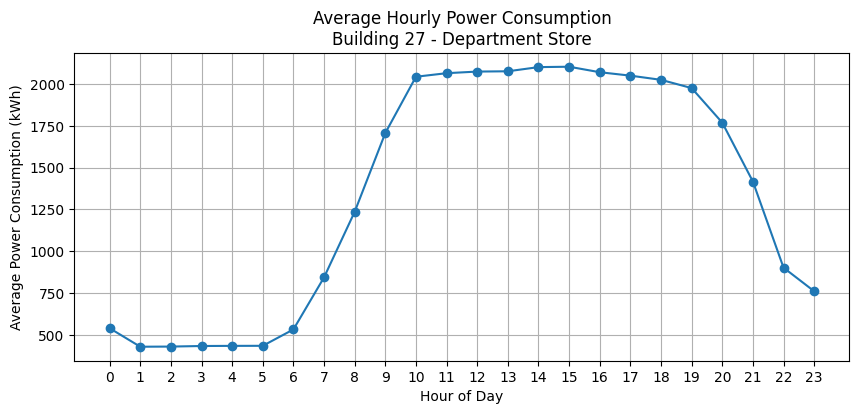

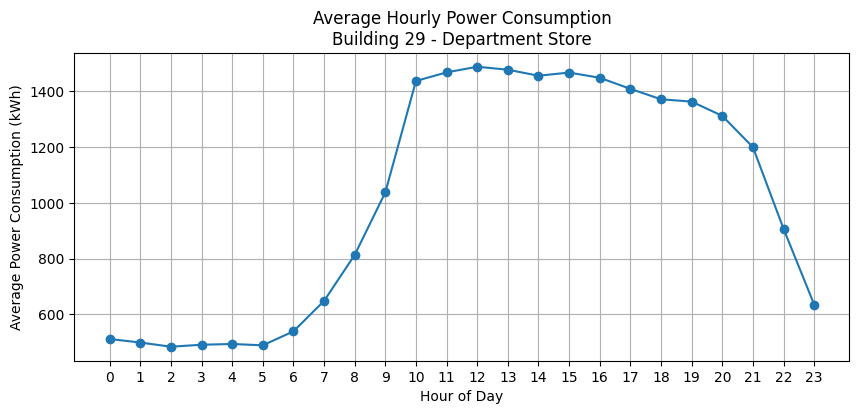

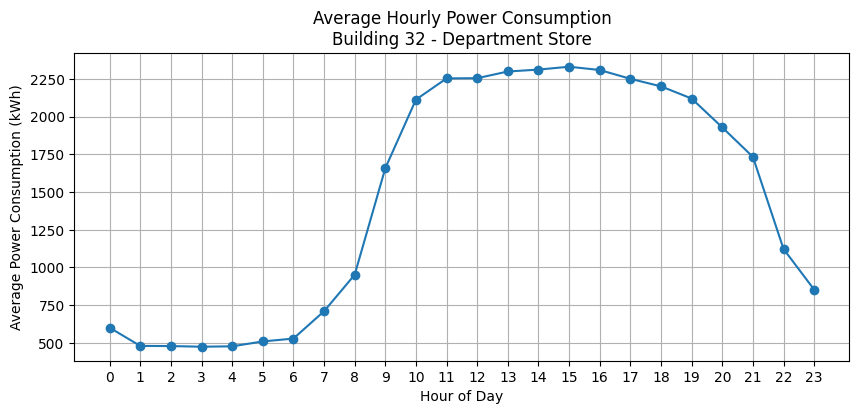

...

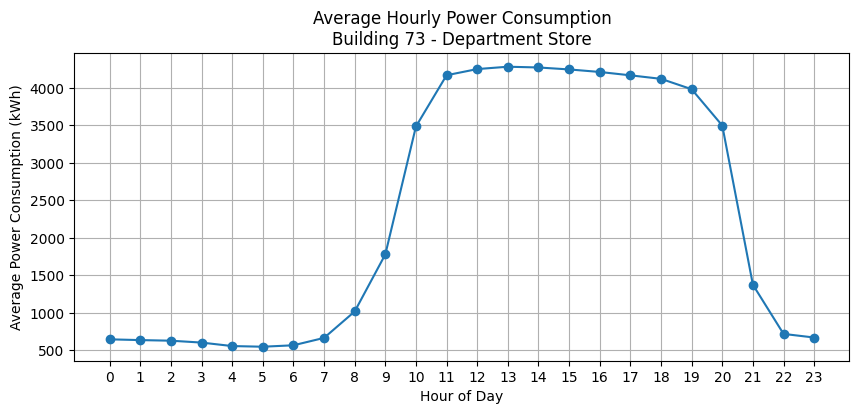

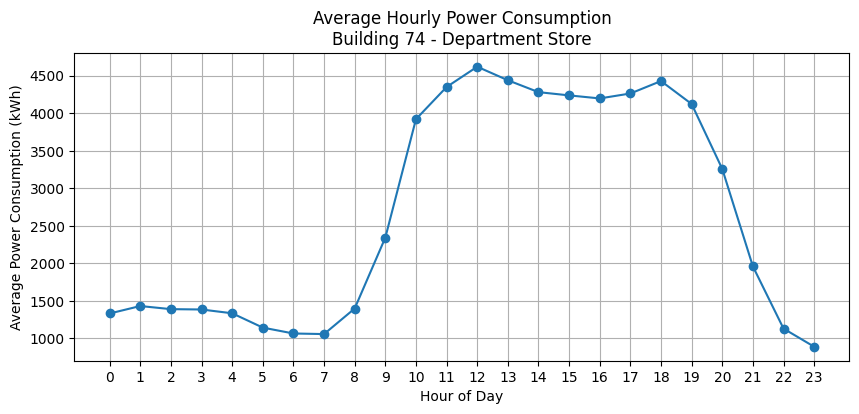

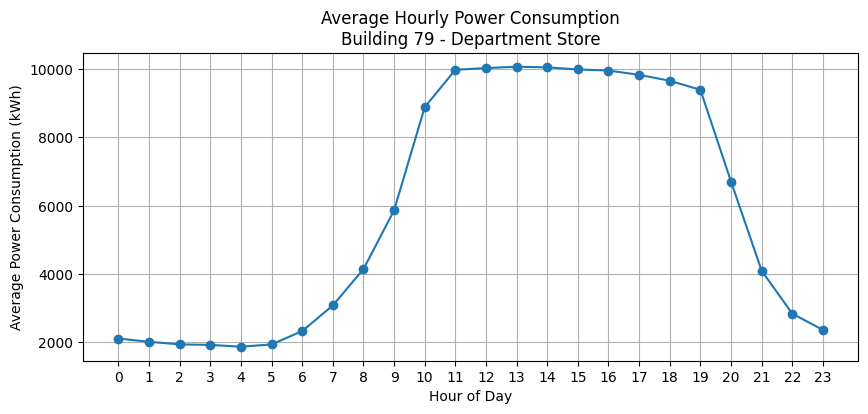

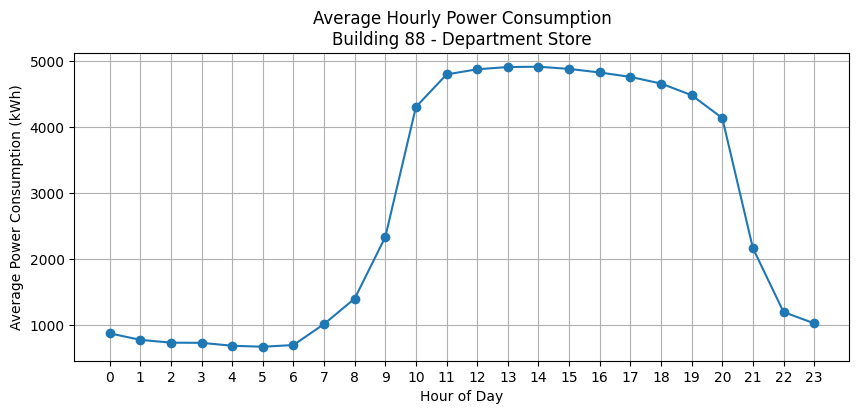

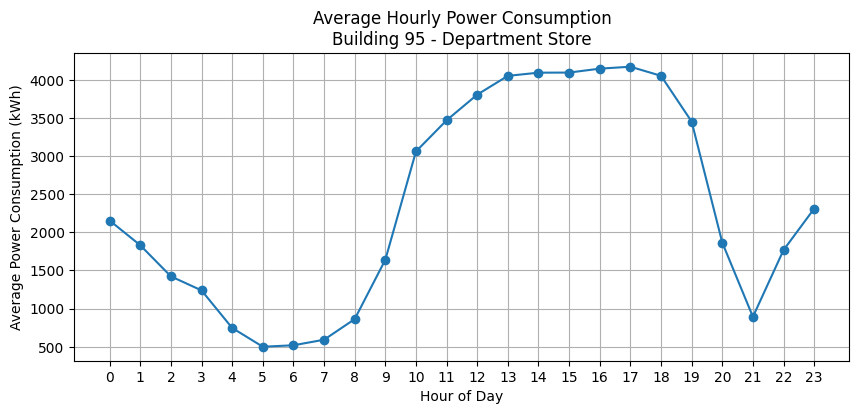

Plotting for Building Type: IDC (Telecom Center) with 9 buildings


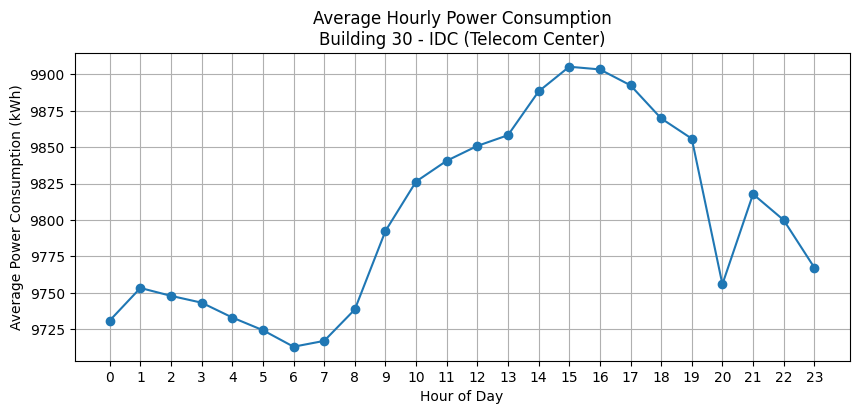

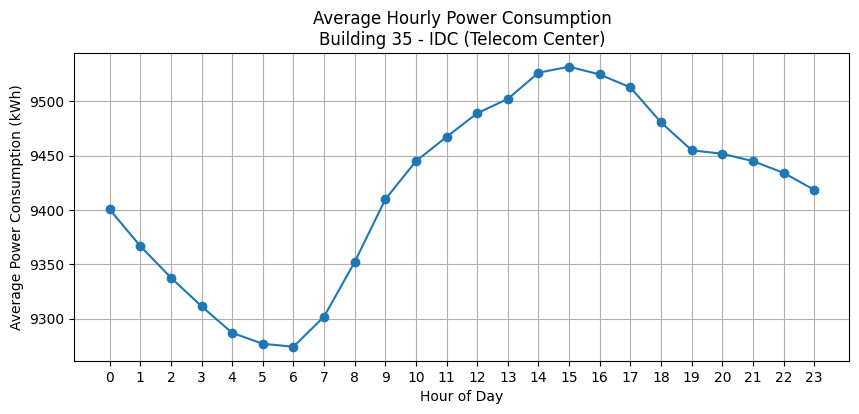

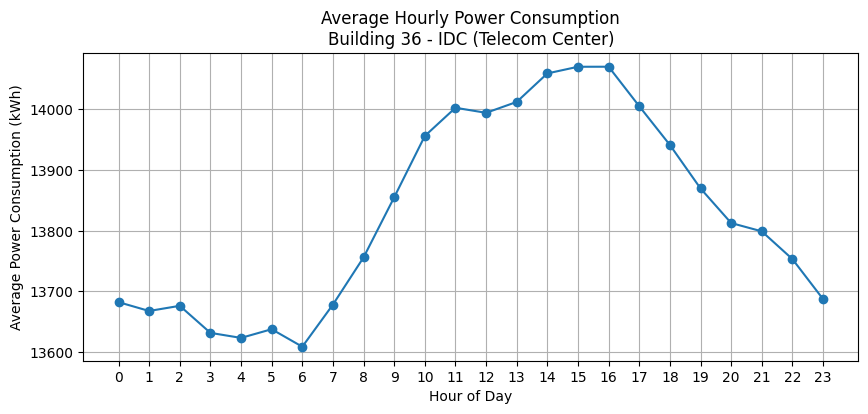

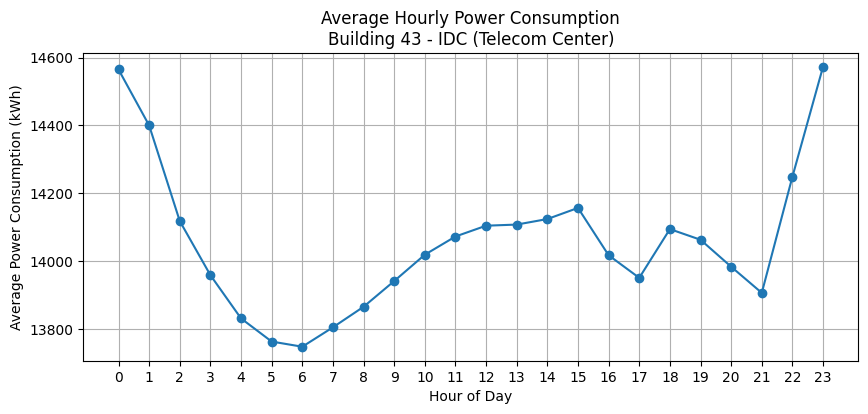

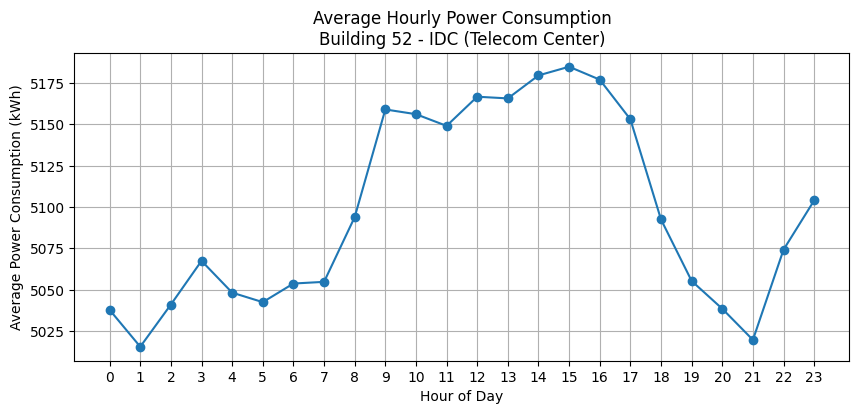

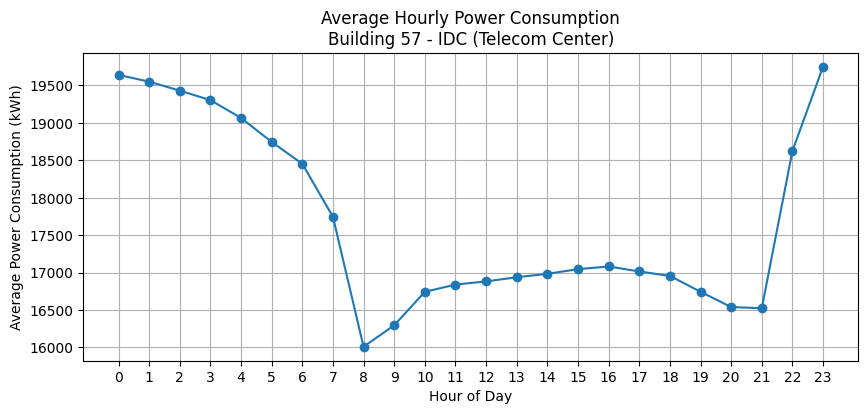

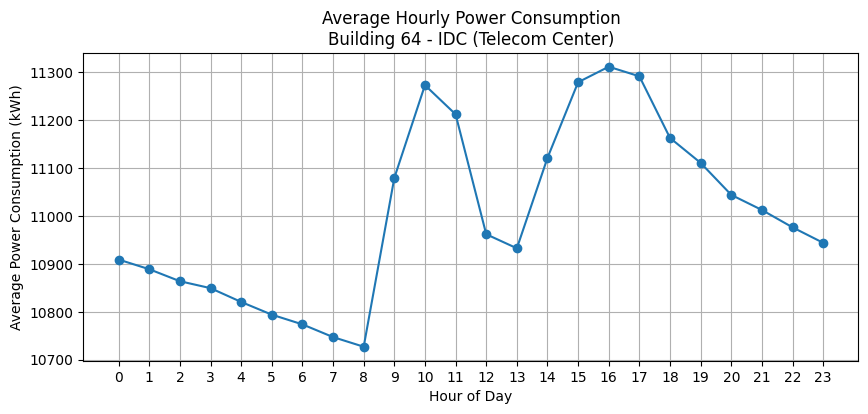

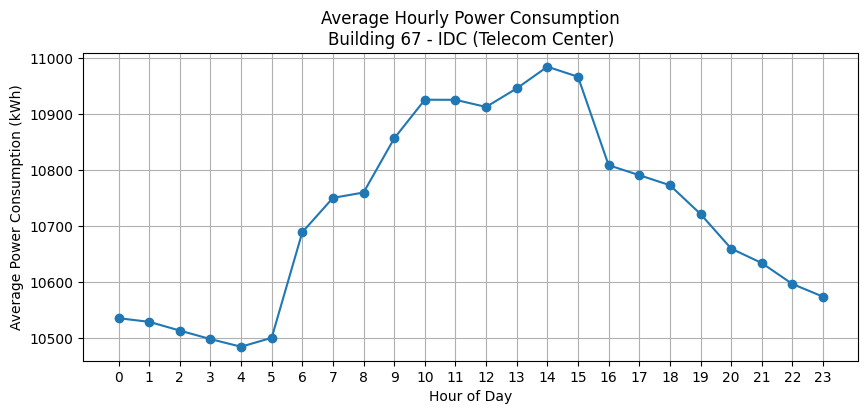

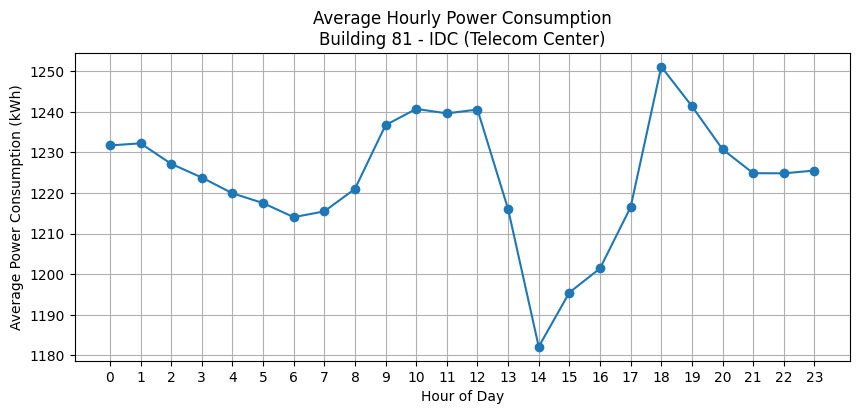

Plotting for Building Type: Public Facility with 8 buildings


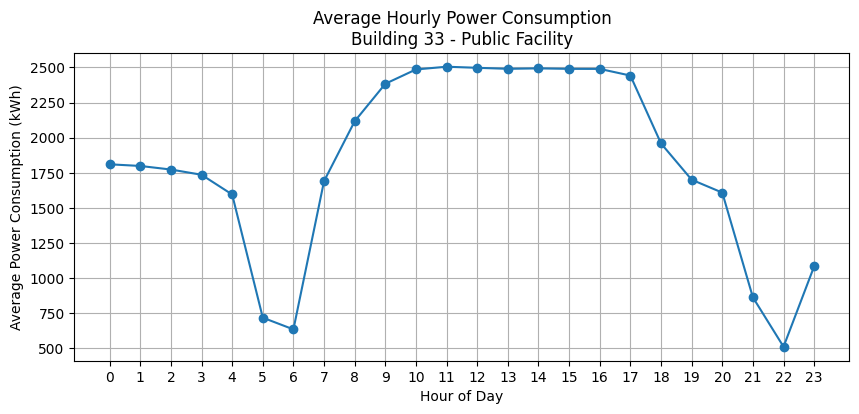

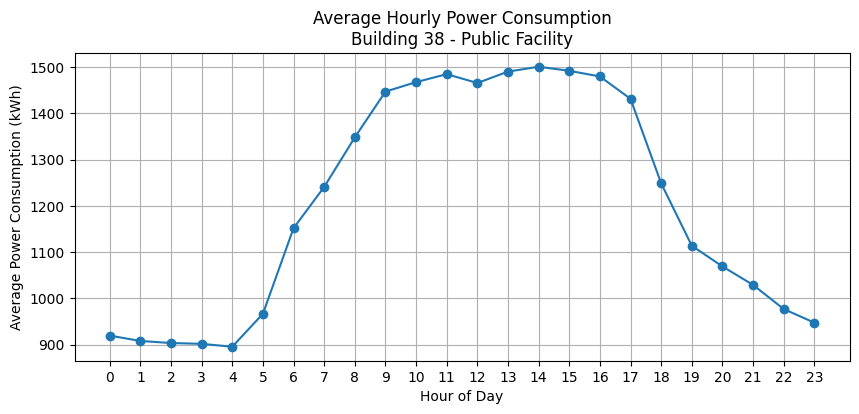

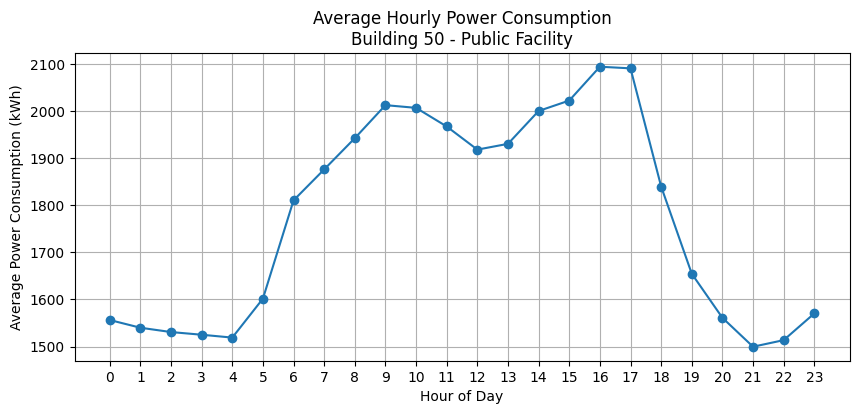

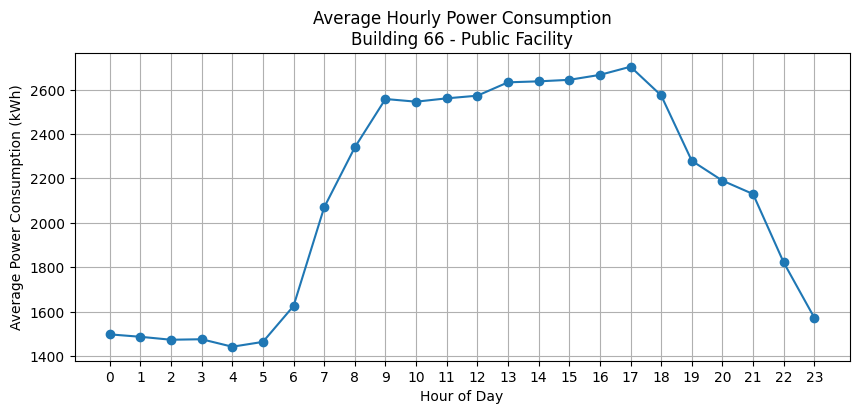

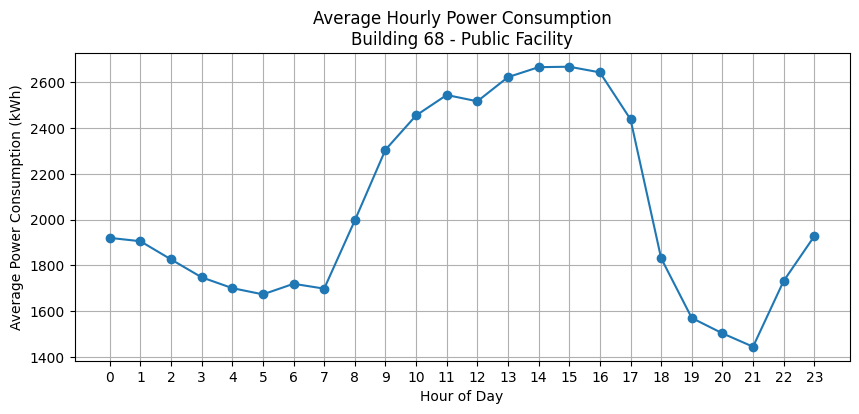

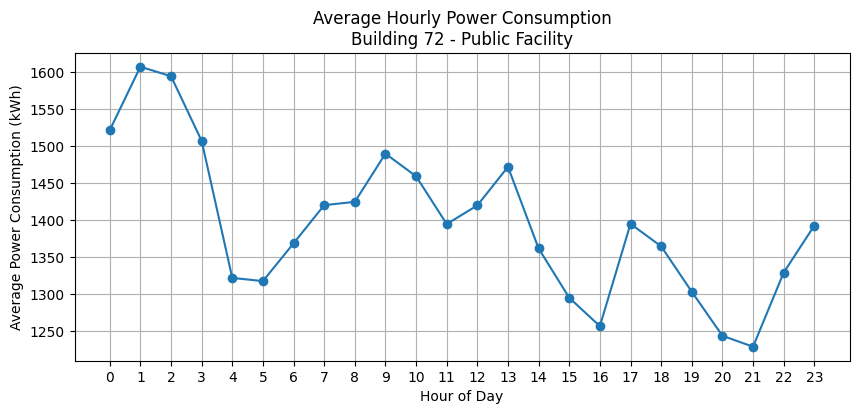

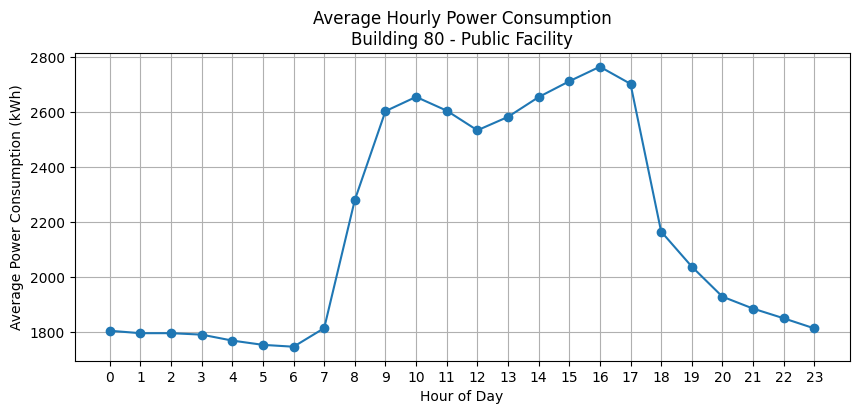

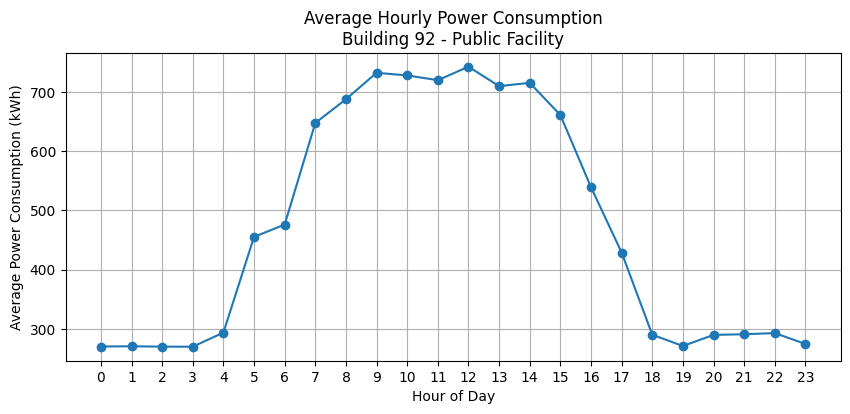

In [42]:
import matplotlib.pyplot as plt
import pandas as pd

# Merge usage data with building info
df_merged = train.merge(
    bld[['Building Number', 'Building Type']], 
    on='Building Number', how='left'
)

# Parse datetime and extract hour
df_merged['Datetime'] = pd.to_datetime(df_merged['Datetime'])
df_merged['Hour'] = df_merged['Datetime'].dt.hour

# Get all building types
building_types = df_merged['Building Type'].dropna().unique()

for btype in building_types:
    df_type = df_merged[df_merged['Building Type'] == btype]
    
    print(f"Plotting for Building Type: {btype} with {df_type['Building Number'].nunique()} buildings")
    
    # For each building in this type, plot separately
    for bnum, group in df_type.groupby('Building Number'):
        hourly_avg = group.groupby('Hour')['Power Consumption (kWh)'].mean()
        
        plt.figure(figsize=(10, 4))
        plt.plot(hourly_avg.index, hourly_avg.values, marker='o')
        plt.title(f'Average Hourly Power Consumption\nBuilding {bnum} - {btype}')
        plt.xlabel('Hour of Day')
        plt.ylabel('Average Power Consumption (kWh)')
        plt.xticks(range(0, 24))
        plt.grid(True)
        plt.show()


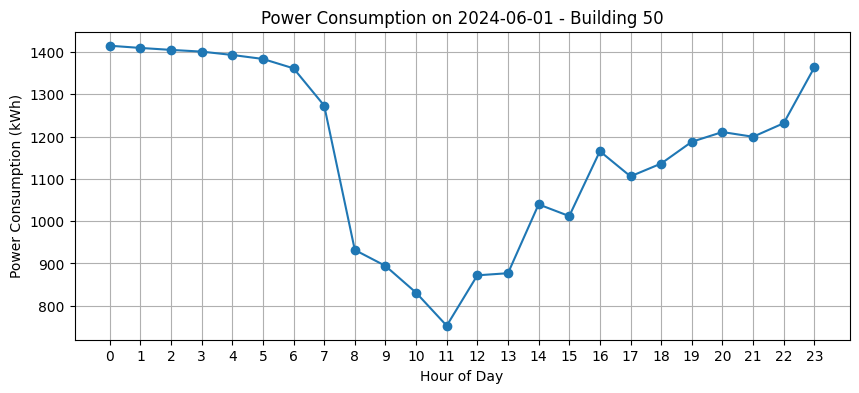

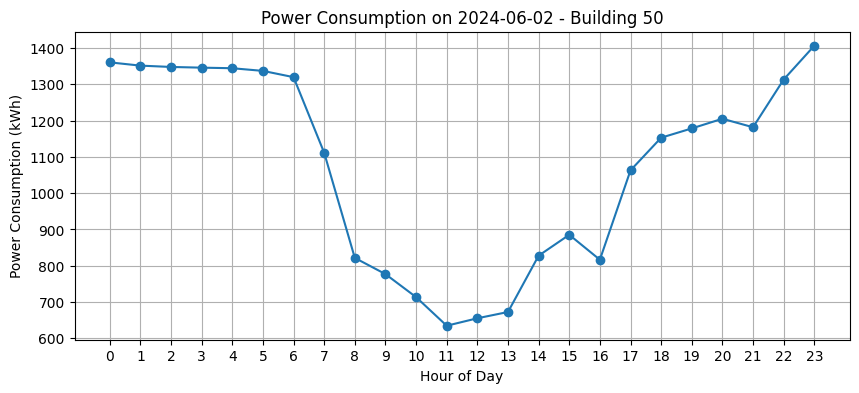

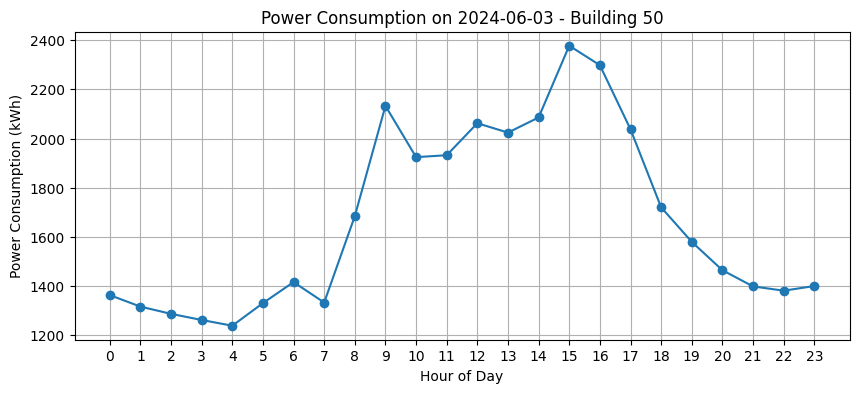

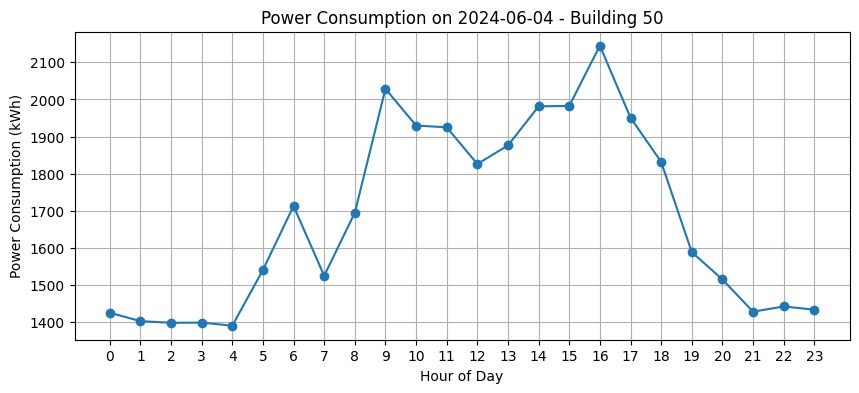

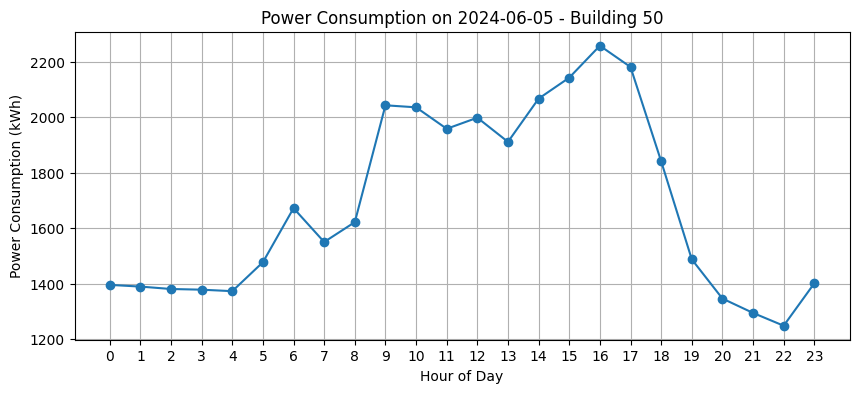

...

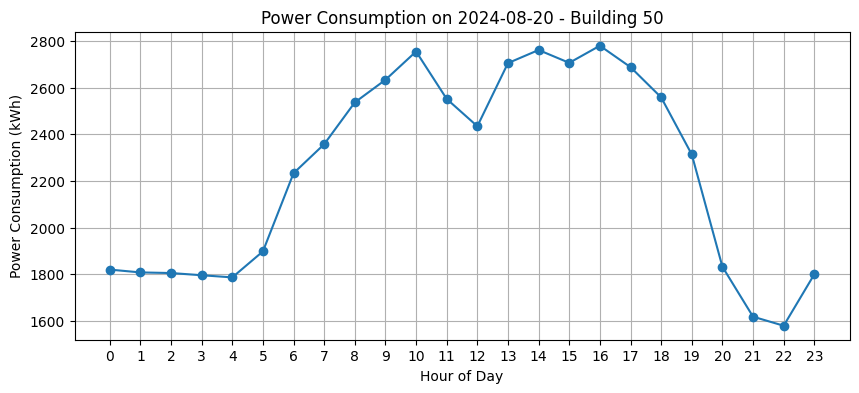

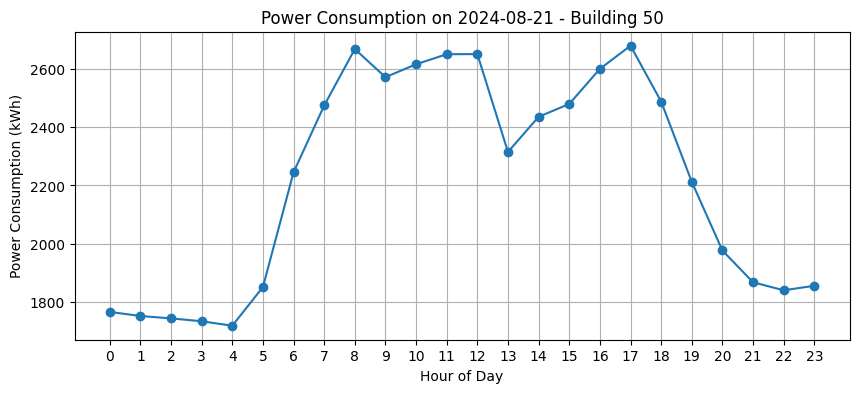

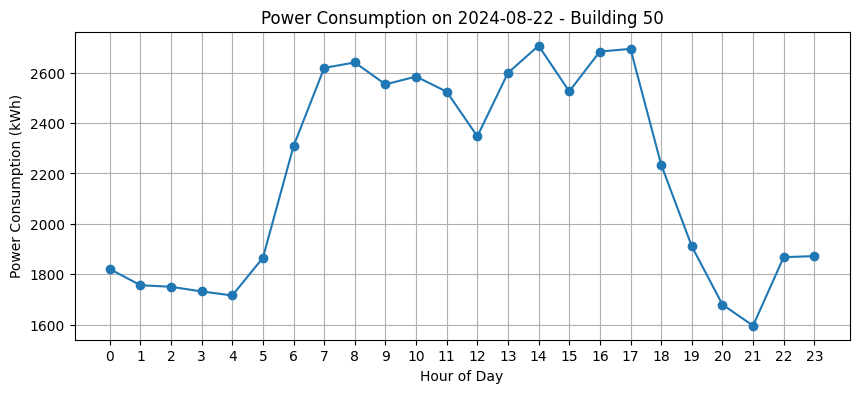

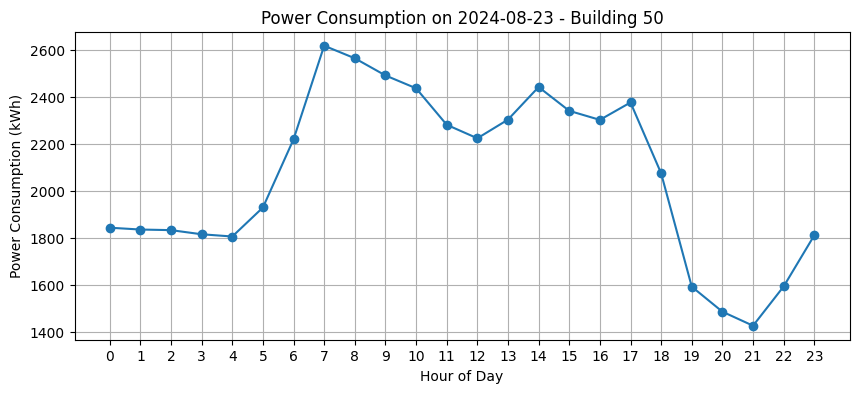

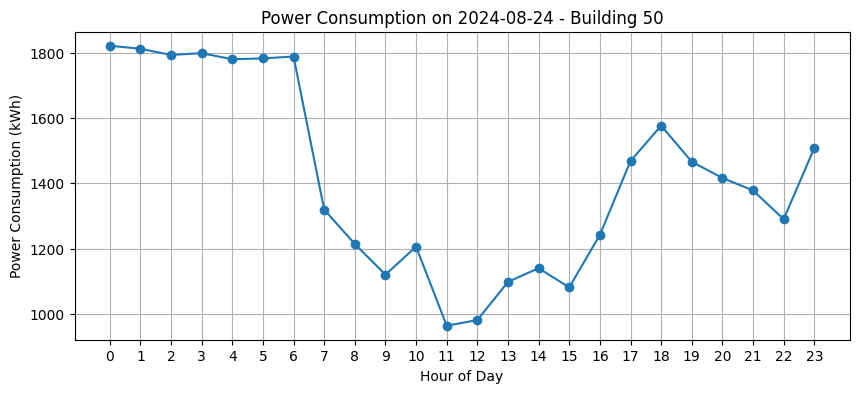

In [43]:
import matplotlib.pyplot as plt
import pandas as pd

# Example: pick one building number
building_number = 50  # replace with your building number

# Filter data for that building
df_building = train[train['Building Number'] == building_number].copy()

# Convert datetime to pandas datetime type
df_building['Datetime'] = pd.to_datetime(df_building['Datetime'])

# Extract date and hour separately
df_building['Date'] = df_building['Datetime'].dt.date
df_building['Hour'] = df_building['Datetime'].dt.hour

# Loop through each date and plot power consumption over hours
for date, group in df_building.groupby('Date'):
    hourly_consumption = group.sort_values('Hour').set_index('Hour')['Power Consumption (kWh)']
    
    plt.figure(figsize=(10, 4))
    plt.plot(hourly_consumption.index, hourly_consumption.values, marker='o')
    plt.title(f'Power Consumption on {date} - Building {building_number}')
    plt.xlabel('Hour of Day')
    plt.ylabel('Power Consumption (kWh)')
    plt.xticks(range(0, 24))
    plt.grid(True)
    plt.show()


In [44]:
# Assuming:
# train = original usage dataset (with 'Building Number' column)
# df_info = building info dataset (with 'Building Number' and 'Building Type')

# Merge train with building info to get building type
train_merged = train.merge(
    bld[['Building Number', 'Building Type']],
    on='Building Number', how='left'
)

# Filter rows where Building Type is '호텔' (hotel in Korean)
train_hotels = train_merged[train_merged['Building Type'] == 'Hotel'].copy()

# Now train_hotels contains only hotel building data from the train dataset


In [45]:
train_hotels['Building Type'].unique()

array(['Hotel'], dtype=object)

In [46]:
train1.iloc[4500:4505]

,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh)
4500,29.9,0.0,2.5,46.0,1.0,3.39,21912.54
4501,31.3,0.0,2.6,44.0,1.0,3.49,22468.50
4502,32.7,0.0,2.2,43.0,1.0,3.38,22801.74
4503,32.6,0.0,3.1,40.0,1.0,3.06,22619.04
4504,32.4,0.0,3.9,38.0,1.0,2.59,21944.04


In [47]:
train_merged.iloc[45:50]

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),Hour,Day,Building Type
45,1_20240602 21,1,2024-06-02 21:00:00,20.2,0.0,1.4,47.0,0.0,0.0,3765.72,21,2,Hotel
46,1_20240602 22,1,2024-06-02 22:00:00,19.7,0.0,1.1,48.0,0.0,0.0,2921.34,22,2,Hotel
47,1_20240602 23,1,2024-06-02 23:00:00,18.9,0.0,0.7,52.0,0.0,0.0,3983.07,23,2,Hotel
48,1_20240603 00,1,2024-06-03 00:00:00,18.1,0.0,1.0,59.0,0.0,0.0,4694.85,0,3,Hotel
49,1_20240603 01,1,2024-06-03 01:00:00,17.6,0.0,1.6,66.0,0.0,0.0,3556.89,1,3,Hotel


In [48]:
bld.iloc[35:40]

,Building Number,Building Type,Total Floor Area (m²),Air-conditioned Area (m²),Solar Power Capacity (kW),ESS Storage Capacity (kWh),PCS Capacity (kW)
35,36,IDC (Telecom Center),32558.00,16873.00,-,-,-
36,37,Research Institute,124037.00,77267.00,12.24,-,-
37,38,Public Facility,61375.47,19800.00,83.2,-,-
38,39,Hospital,99347.35,59803.08,74.25,-,-
39,40,Department Store,57684.93,15770.32,-,-,-


In [49]:
bld

,Building Number,Building Type,Total Floor Area (m²),Air-conditioned Area (m²),Solar Power Capacity (kW),ESS Storage Capacity (kWh),PCS Capacity (kW)
0,1,Hotel,82912.71,77586.00,-,-,-
1,2,Commercial,40658.90,30392.82,-,-,-
2,3,Hospital,560431.00,418992.00,278.58,-,-
3,4,Hotel,41813.29,23715.71,-,-,-
4,5,School,403749.39,248507.00,1983.05,1025,250
...,...,...,...,...,...,...,...
95,96,Other Building,3260213.41,1956128.00,-,-,-
96,97,Other Building,42370.93,3975.52,81.38,-,-
97,98,Hotel,99102.62,22097.00,-,-,-
98,99,Commercial,329867.95,13442.35,171.6,-,-


In [50]:
# Select only numeric columns from train_hotels
numeric_cols = train_hotels.select_dtypes(include=['number']).columns

# Compute correlation matrix on numeric columns
corr_matrix = train_hotels[numeric_cols].corr()

# Extract correlation of each feature with 'Power Consumption (kWh)'
# Make sure to use the exact column name for power consumption in your dataset
power_corr = corr_matrix['Power Consumption (kWh)'].drop('Power Consumption (kWh)')

# Print sorted correlations
print(power_corr.sort_values(ascending=False))


Temperature (°C)           0.210022
Hour                       0.095162
Sunshine Duration (hr)     0.052970
Day                        0.020703
Precipitation (mm)         0.015417
Solar Radiation (MJ/m²)   -0.021728
Humidity (%)              -0.056007
Wind Speed (m/s)          -0.116040
Building Number           -0.141519
Name: Power Consumption (kWh), dtype: float64


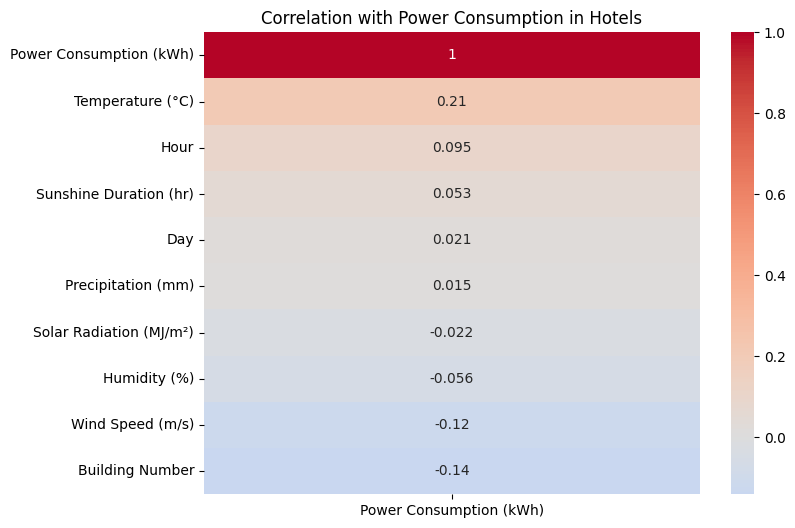

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix[['Power Consumption (kWh)']].sort_values(by='Power Consumption (kWh)', ascending=False), annot=True, cmap='coolwarm', center=0)
plt.title('Correlation with Power Consumption in Hotels')
plt.show()


In [52]:
target_col = 'Power Consumption (kWh)'

# Select feature columns - all numeric except target
feature_cols = train_hotels.select_dtypes(include=['number']).columns.drop(target_col)

X = train_hotels['Datetime']
y = train_hotels[target_col]

In [53]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [54]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on validation set
y_pred = model.predict(X_val)

# Evaluate
mse = mean_squared_error(y_val, y_pred)
r2 = r2_score(y_val, y_pred)

print(f'MSE: {mse:.3f}')
print(f'R2 Score: {r2:.3f}')


ValueError: Expected a 2-dimensional container but got <class 'pandas.core.series.Series'> instead. Pass a DataFrame containing a single row (i.e. single sample) or a single column (i.e. single feature) instead.

In [ ]:

# Import libraries
from sklearn.linear_model import LinearRegression
# from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Prepare data (assuming X and y are ready as before)

# Linear Regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_val)
print("Linear Regression MSE:", mean_squared_error(y_val, y_pred_lr))
print("Linear Regression R2:", r2_score(y_val, y_pred_lr))

# LightGBM
# lgb_model = LGBMRegressor(n_estimators=100, random_state=42)
# lgb_model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
# y_pred_lgb = lgb_model.predict(X_val)
# print("LightGBM MSE:", mean_squared_error(y_val, y_pred_lgb))
# print("LightGBM R2:", r2_score(y_val, y_pred_lgb))


Linear Regression MSE: 7545850.709717764
Linear Regression R2: 0.0947452728549607


C:\Users\Dell\AppData\Local\Temp\ipykernel_3272\2265695235.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


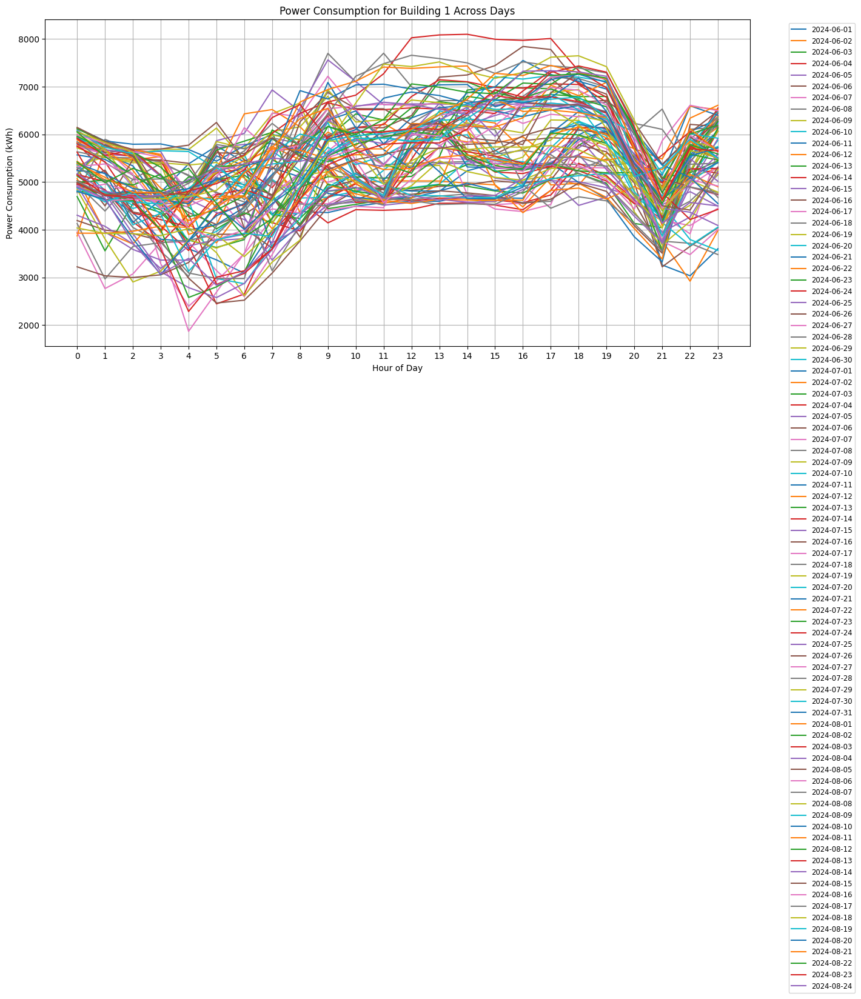

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Replace with the building number you want to analyze
building_number = 1 

# Filter data for that building
df_building = train_hotels[train_hotels['Building Number'] == building_number].copy()

# Make sure datetime column is in datetime format
df_building['Datetime'] = pd.to_datetime(df_building['Datetime'])

# Extract date and hour
df_building['Date'] = df_building['Datetime'].dt.date
df_building['Hour'] = df_building['Datetime'].dt.hour

# Pivot the data: rows = hour, columns = date, values = power consumption
pivot_table = df_building.pivot(index='Hour', columns='Date', values='Power Consumption (kWh)')

# Plot
plt.figure(figsize=(15, 7))
for date in pivot_table.columns:
    plt.plot(pivot_table.index, pivot_table[date], label=str(date))

plt.title(f'Power Consumption for Building {building_number} Across Days')
plt.xlabel('Hour of Day')
plt.ylabel('Power Consumption (kWh)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
train_hotels

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),Hour,Day,Building Type
0,1_20240601 00,1,2024-06-01 00:00:00,18.3,0.0,2.6,82.0,0.0,0.00,5794.80,0,1,Hotel
1,1_20240601 01,1,2024-06-01 01:00:00,18.3,0.0,2.7,82.0,0.0,0.00,5591.85,1,1,Hotel
2,1_20240601 02,1,2024-06-01 02:00:00,18.1,0.0,2.6,80.0,0.0,0.00,5338.17,2,1,Hotel
3,1_20240601 03,1,2024-06-01 03:00:00,18.0,0.0,2.6,81.0,0.0,0.00,4554.42,3,1,Hotel
4,1_20240601 04,1,2024-06-01 04:00:00,17.8,0.0,1.3,81.0,0.0,0.00,3602.25,4,1,Hotel
...,...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100_20240824 19,100,2024-08-24 19:00:00,29.1,0.0,4.4,76.0,0.4,0.18,3276.00,19,24,Hotel
203996,100_20240824 20,100,2024-08-24 20:00:00,28.6,0.0,3.7,74.0,0.0,0.00,3197.52,20,24,Hotel
203997,100_20240824 21,100,2024-08-24 21:00:00,28.3,0.0,2.9,74.0,0.0,0.00,3006.60,21,24,Hotel
203998,100_20240824 22,100,2024-08-24 22:00:00,28.0,0.0,1.7,76.0,0.0,0.00,2649.72,22,24,Hotel


In [ ]:
bld

,Building Number,Building Type,Total Floor Area (m²),Air-conditioned Area (m²),Solar Power Capacity (kW),ESS Storage Capacity (kWh),PCS Capacity (kW)
0,1,Hotel,82912.71,77586.00,-,-,-
1,2,Commercial,40658.90,30392.82,-,-,-
2,3,Hospital,560431.00,418992.00,278.58,-,-
3,4,Hotel,41813.29,23715.71,-,-,-
4,5,School,403749.39,248507.00,1983.05,1025,250
...,...,...,...,...,...,...,...
95,96,Other Building,3260213.41,1956128.00,-,-,-
96,97,Other Building,42370.93,3975.52,81.38,-,-
97,98,Hotel,99102.62,22097.00,-,-,-
98,99,Commercial,329867.95,13442.35,171.6,-,-


In [ ]:
bld_cons = bld.merge(
    train[['Building Number', 'Power Consumption (kWh)']],  # keep only needed columns
    on='Building Number',
    how='left'
)
bld_cons


,Building Number,Building Type,Total Floor Area (m²),Air-conditioned Area (m²),Solar Power Capacity (kW),ESS Storage Capacity (kWh),PCS Capacity (kW),Power Consumption (kWh)
0,1,Hotel,82912.71,77586.0,-,-,-,5794.80
1,1,Hotel,82912.71,77586.0,-,-,-,5591.85
2,1,Hotel,82912.71,77586.0,-,-,-,5338.17
3,1,Hotel,82912.71,77586.0,-,-,-,4554.42
4,1,Hotel,82912.71,77586.0,-,-,-,3602.25
...,...,...,...,...,...,...,...,...
203995,100,Hotel,162070.24,152943.0,-,-,-,3276.00
203996,100,Hotel,162070.24,152943.0,-,-,-,3197.52
203997,100,Hotel,162070.24,152943.0,-,-,-,3006.60
203998,100,Hotel,162070.24,152943.0,-,-,-,2649.72


In [ ]:
train_hotels

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),Hour,Day,Building Type
0,1_20240601 00,1,2024-06-01 00:00:00,18.3,0.0,2.6,82.0,0.0,0.00,5794.80,0,1,Hotel
1,1_20240601 01,1,2024-06-01 01:00:00,18.3,0.0,2.7,82.0,0.0,0.00,5591.85,1,1,Hotel
2,1_20240601 02,1,2024-06-01 02:00:00,18.1,0.0,2.6,80.0,0.0,0.00,5338.17,2,1,Hotel
3,1_20240601 03,1,2024-06-01 03:00:00,18.0,0.0,2.6,81.0,0.0,0.00,4554.42,3,1,Hotel
4,1_20240601 04,1,2024-06-01 04:00:00,17.8,0.0,1.3,81.0,0.0,0.00,3602.25,4,1,Hotel
...,...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100_20240824 19,100,2024-08-24 19:00:00,29.1,0.0,4.4,76.0,0.4,0.18,3276.00,19,24,Hotel
203996,100_20240824 20,100,2024-08-24 20:00:00,28.6,0.0,3.7,74.0,0.0,0.00,3197.52,20,24,Hotel
203997,100_20240824 21,100,2024-08-24 21:00:00,28.3,0.0,2.9,74.0,0.0,0.00,3006.60,21,24,Hotel
203998,100_20240824 22,100,2024-08-24 22:00:00,28.0,0.0,1.7,76.0,0.0,0.00,2649.72,22,24,Hotel


In [ ]:
bld_cons_hotel = train_hotels.merge(
    bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)']],
    on='Building Number',
    how='left'
)
bld_cons_hotel

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),Hour,Day,Building Type,Total Floor Area (m²),Air-conditioned Area (m²)
0,1_20240601 00,1,2024-06-01 00:00:00,18.3,0.0,2.6,82.0,0.0,0.00,5794.80,0,1,Hotel,82912.71,77586.0
1,1_20240601 01,1,2024-06-01 01:00:00,18.3,0.0,2.7,82.0,0.0,0.00,5591.85,1,1,Hotel,82912.71,77586.0
2,1_20240601 02,1,2024-06-01 02:00:00,18.1,0.0,2.6,80.0,0.0,0.00,5338.17,2,1,Hotel,82912.71,77586.0
3,1_20240601 03,1,2024-06-01 03:00:00,18.0,0.0,2.6,81.0,0.0,0.00,4554.42,3,1,Hotel,82912.71,77586.0
4,1_20240601 04,1,2024-06-01 04:00:00,17.8,0.0,1.3,81.0,0.0,0.00,3602.25,4,1,Hotel,82912.71,77586.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20395,100_20240824 19,100,2024-08-24 19:00:00,29.1,0.0,4.4,76.0,0.4,0.18,3276.00,19,24,Hotel,162070.24,152943.0
20396,100_20240824 20,100,2024-08-24 20:00:00,28.6,0.0,3.7,74.0,0.0,0.00,3197.52,20,24,Hotel,162070.24,152943.0
20397,100_20240824 21,100,2024-08-24 21:00:00,28.3,0.0,2.9,74.0,0.0,0.00,3006.60,21,24,Hotel,162070.24,152943.0
20398,100_20240824 22,100,2024-08-24 22:00:00,28.0,0.0,1.7,76.0,0.0,0.00,2649.72,22,24,Hotel,162070.24,152943.0


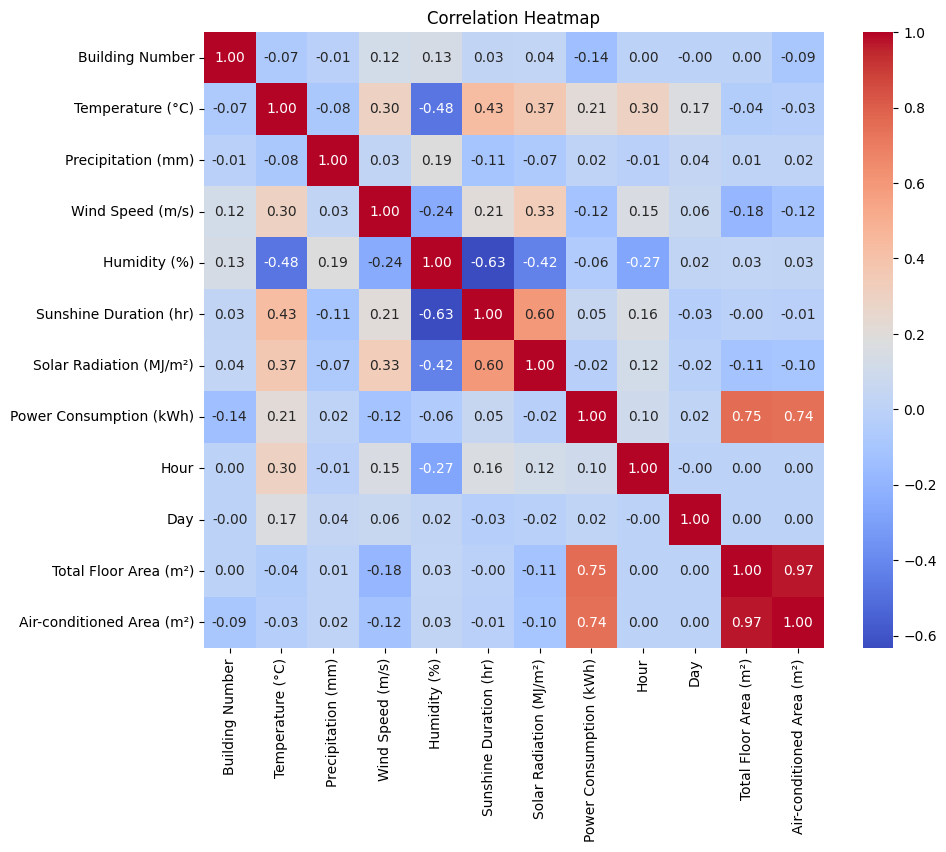

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute correlation matrix for numeric columns
corr_matrix = bld_cons_hotel.corr(numeric_only=True)

# Plot
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
%pip install statsmodels pmdarima


   ---------------------------------------- 0.0/9.6 MB ? eta -:--:--
   ------- -------------------------------- 1.8/9.6 MB 14.4 MB/s eta 0:00:01
   ----------------- ---------------------- 4.2/9.6 MB 12.6 MB/s eta 0:00:01
   ------------------------------------- -- 8.9/9.6 MB 16.3 MB/s eta 0:00:01
   ---------------------------------------- 9.6/9.6 MB 15.4 MB/s  0:00:00
   ---------------------------------------- 0.0/625.1 kB ? eta -:--:--
   ---------------------------------------- 625.1/625.1 kB 11.7 MB/s  0:00:00
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ----------------------------------- ---- 2.4/2.7 MB 12.2 MB/s eta 0:00:01
   ---------------------------------------- 2.7/2.7 MB 10.4 MB/s  0:00:00
   ---------------------------------------- 0.0/1.2 MB ? eta -:--:--
   ---------------------------------- ----- 1.0/1.2 MB 5.6 MB/s eta 0:00:01
   ---------------------------------------- 1.2/1.2 MB 5.5 MB/s  0:00:00

   -----------------------------------

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 368
[LightGBM] [Info] Number of data points in the train set: 16320, number of used features: 6
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 3188.655270
LightGBM MSE: 139298.61
LightGBM RMSE: 373.23
LightGBM R2: 0.9833
LightGBM MAPE: 8.42%


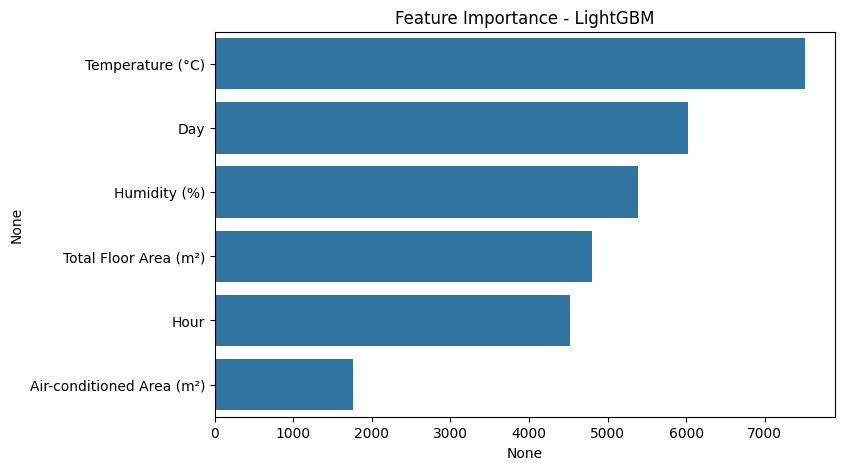

In [ ]:
# import lightgbm as lgb
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import mean_squared_error, r2_score
# import numpy as np

# # ===== Prepare features & target =====
# X = bld_cons_hotel[['Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Hour', 'Day', 'Temperature (°C)']]  # Add more features if available
# y = bld_cons_hotel['Power Consumption (kWh)']



# # ===== Train-test split =====
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # ===== LightGBM model =====
# model = lgb.LGBMRegressor(
#     boosting_type='gbdt',
#     n_estimators=1000,
#     learning_rate=0.08,
#     num_leaves=31,
#     random_state=42
# )

# from lightgbm import early_stopping

# model.fit(
#     X_train, y_train,
#     eval_set=[(X_test, y_test)],
#     eval_metric='rmse',
#     callbacks=[early_stopping(stopping_rounds=50)]
# )


# # ===== Predictions =====
# y_pred = model.predict(X_test)

# # ===== Metrics =====
# mse = mean_squared_error(y_test, y_pred)
# r2 = r2_score(y_test, y_pred)

# print(f"LightGBM MSE: {mse}")
# print(f"LightGBM RMSE: {np.sqrt(mse)}")
# print(f"LightGBM R2: {r2}")

# # ===== Feature importance =====
# import matplotlib.pyplot as plt
# import seaborn as sns

# feat_imp = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)

# plt.figure(figsize=(8, 5))
# sns.barplot(x=feat_imp, y=feat_imp.index)
# plt.title("Feature Importance - LightGBM")
# plt.show()


import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# ===== Prepare features & target =====
X = bld_cons_hotel[['Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Hour', 'Day', 'Temperature (°C)', 'Humidity (%)']]  # Add more features if available
y = bld_cons_hotel['Power Consumption (kWh)']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ===== LightGBM model =====
model = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=1000,
    learning_rate=0.08,
    num_leaves=31,
    random_state=42
)

# Train (no 'verbose' here)
model.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # %

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")

# ===== Feature importance =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()


In [ ]:
test.head()

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%)
0,1_20240825 00,1,20240825 00,26.5,0.0,0.7,80.0
1,1_20240825 01,1,20240825 01,26.1,0.0,0.0,80.0
2,1_20240825 02,1,20240825 02,25.9,0.0,0.3,83.0
3,1_20240825 03,1,20240825 03,25.7,0.0,1.1,83.0
4,1_20240825 04,1,20240825 04,25.5,0.0,1.0,86.0


In [ ]:
test_hotel = test.merge(
    bld_cons_hotel[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)','Building Type']],
    on='Building Number',
    how='left'
)
test_hotel = test_hotel[test_hotel['Building Type'] == 'School']

test_hotel.head()

NameError: name 'test' is not defined

In [ ]:
import pandas as pd


# Convert to datetime first
test_hotel['Datetime'] = pd.to_datetime(test_hotel['Datetime'], format='%Y%m%d %H')

# Now extract the hour
test_hotel['Hour'] = test_hotel['Datetime'].dt.hour
test_hotel['Day'] = test_hotel['Datetime'].dt.day



# Features for prediction — must match training features
X_future = test_hotel[['Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Hour', 'Day', 'Temperature (°C)', 'Humidity (%)']]

# Predict
test_hotel['Predicted Power Consumption (kWh)'] = model.predict(X_future)

# Save predictions
test_hotel.to_csv("future_predictions.csv", index=False)


In [ ]:
df_new = pd.read_csv("future_predictions.csv")
df_new.head()

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Total Floor Area (m²),Air-conditioned Area (m²),Building Type,Hour,Day,Predicted Power Consumption (kWh)
0,1_20240825 00,1,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,25,4672.367021
1,1_20240825 00,1,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,25,4672.367021
2,1_20240825 00,1,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,25,4672.367021
3,1_20240825 00,1,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,25,4672.367021
4,1_20240825 00,1,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,25,4672.367021


In [ ]:
test_hotel.head()

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Total Floor Area (m²)_x,Air-conditioned Area (m²)_x,Building Type,Hour,Total Floor Area (m²)_y,Air-conditioned Area (m²)_y
0,1_20240825 00,1,2024-08-25,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,82912.71,77586.0
1,1_20240825 00,1,2024-08-25,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,82912.71,77586.0
2,1_20240825 00,1,2024-08-25,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,82912.71,77586.0
3,1_20240825 00,1,2024-08-25,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,82912.71,77586.0
4,1_20240825 00,1,2024-08-25,26.5,0.0,0.7,80.0,82912.71,77586.0,Hotel,0,82912.71,77586.0


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Replace with your building number
building_number = 50

# Filter data for that building
df_building = train_hotels[train_hotels['Building Number'] == building_number].copy()

# Ensure datetime is datetime type
df_building['Datetime'] = pd.to_datetime(df_building['Datetime'])

# Extract date and hour
df_building['Date'] = df_building['Datetime'].dt.date
df_building['Hour'] = df_building['Datetime'].dt.hour

# Group by each day and plot separately
for date, group in df_building.groupby('Date'):
    hourly_consumption = group.sort_values('Hour').set_index('Hour')['Power Consumption (kWh)']
    
    plt.figure(figsize=(10, 4))
    plt.plot(hourly_consumption.index, hourly_consumption.values, marker='o')
    plt.title(f'Power Consumption on {date} - Building {building_number}')
    plt.xlabel('Hour of Day')
    plt.ylabel('Power Consumption (kWh)')
    plt.xticks(range(0, 24))
    plt.grid(True)
    plt.show()


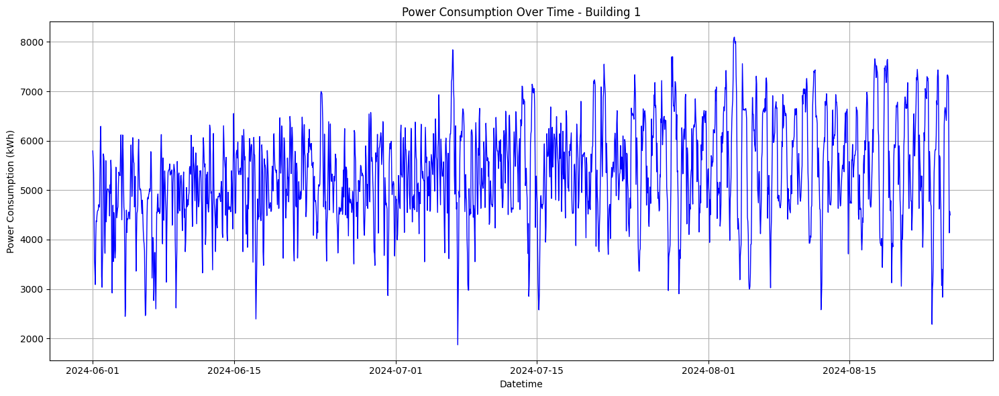

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Select building number
building_number = 1  

# Filter for the building
df_building = train_hotels[train_hotels['Building Number'] == building_number].copy()

# Ensure datetime is in correct format
df_building['Datetime'] = pd.to_datetime(df_building['Datetime'])

# Sort by datetime (important for plotting)
df_building = df_building.sort_values('Datetime')

# Plot
plt.figure(figsize=(15, 6))
plt.plot(df_building['Datetime'], df_building['Power Consumption (kWh)'], color='blue', linewidth=1)
plt.title(f'Power Consumption Over Time - Building {building_number}')
plt.xlabel('Datetime')
plt.ylabel('Power Consumption (kWh)')
plt.grid(True)
plt.tight_layout()
plt.show()


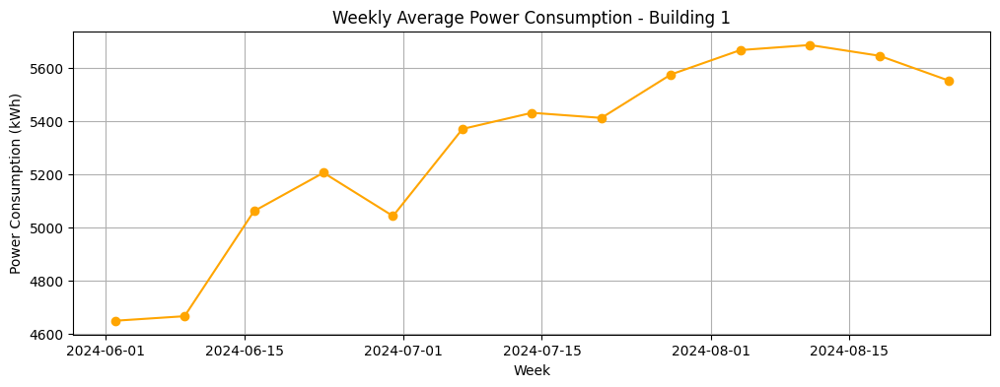

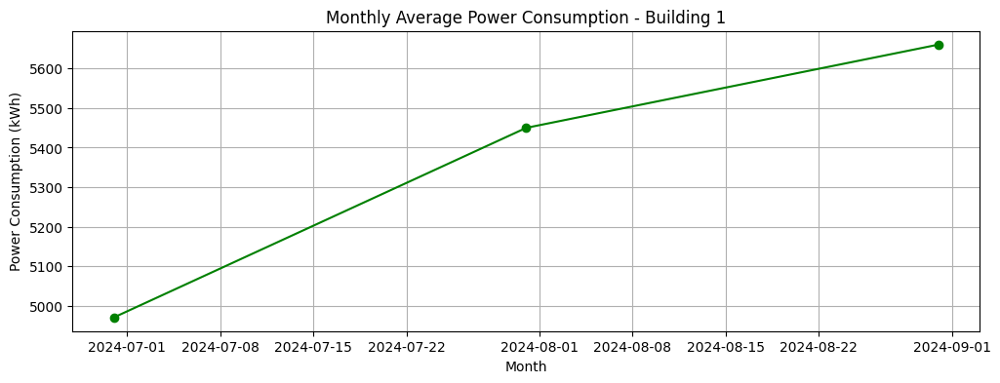

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Select building number
building_number = 1

# Filter for that building
df_building = train_hotels[train_hotels['Building Number'] == building_number].copy()

# Ensure datetime is in correct format
df_building['Datetime'] = pd.to_datetime(df_building['Datetime'])
df_building = df_building.sort_values('Datetime')

# Resample for weekly and monthly means
weekly_data = df_building.resample('W', on='Datetime')['Power Consumption (kWh)'].mean()
monthly_data = df_building.resample('M', on='Datetime')['Power Consumption (kWh)'].mean()

# Plot weekly
plt.figure(figsize=(12, 4))
plt.plot(weekly_data.index, weekly_data.values, marker='o', color='orange')
plt.title(f'Weekly Average Power Consumption - Building {building_number}')
plt.xlabel('Week')
plt.ylabel('Power Consumption (kWh)')
plt.grid(True)
plt.show()

# Plot monthly
plt.figure(figsize=(12, 4))
plt.plot(monthly_data.index, monthly_data.values, marker='o', color='green')
plt.title(f'Monthly Average Power Consumption - Building {building_number}')
plt.xlabel('Month')
plt.ylabel('Power Consumption (kWh)')
plt.grid(True)
plt.show()


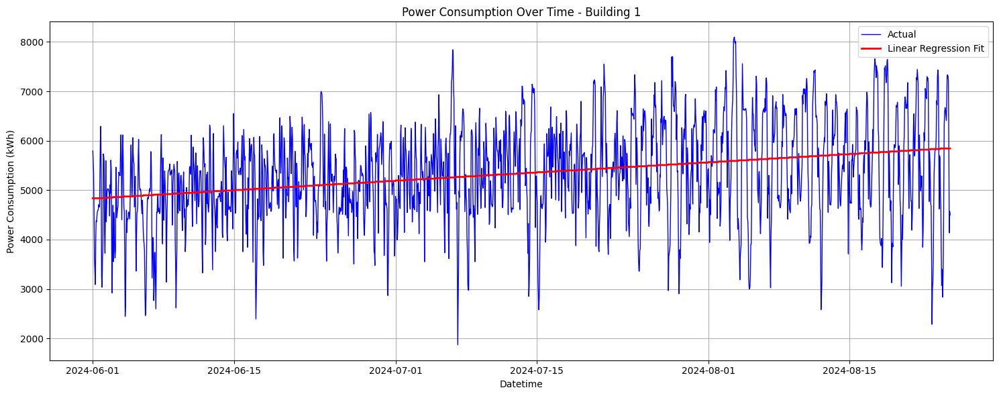

In [ ]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Select building number
building_number = 1  

# Filter for that building
df_building = train_hotels[train_hotels['Building Number'] == building_number].copy()

# Ensure datetime is in correct format
df_building['Datetime'] = pd.to_datetime(df_building['Datetime'])
df_building = df_building.sort_values('Datetime')

# Convert datetime to numeric (ordinal for regression)
X = df_building['Datetime'].map(pd.Timestamp.toordinal).values.reshape(-1, 1)
y = df_building['Power Consumption (kWh)'].values

# Fit linear regression
model = LinearRegression()
model.fit(X, y)

# Predict values
y_pred = model.predict(X)

# Plot
plt.figure(figsize=(15, 6))
plt.plot(df_building['Datetime'], y, color='blue', linewidth=1, label='Actual')
plt.plot(df_building['Datetime'], y_pred, color='red', linewidth=2, label='Linear Regression Fit')
plt.title(f'Power Consumption Over Time - Building {building_number}')
plt.xlabel('Datetime')
plt.ylabel('Power Consumption (kWh)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
bld

,Building Number,Building Type,Total Floor Area (m²),Air-conditioned Area (m²),Solar Power Capacity (kW),ESS Storage Capacity (kWh),PCS Capacity (kW)
0,1,Hotel,82912.71,77586.00,-,-,-
1,2,Commercial,40658.90,30392.82,-,-,-
2,3,Hospital,560431.00,418992.00,278.58,-,-
3,4,Hotel,41813.29,23715.71,-,-,-
4,5,School,403749.39,248507.00,1983.05,1025,250
...,...,...,...,...,...,...,...
95,96,Other Building,3260213.41,1956128.00,-,-,-
96,97,Other Building,42370.93,3975.52,81.38,-,-
97,98,Hotel,99102.62,22097.00,-,-,-
98,99,Commercial,329867.95,13442.35,171.6,-,-
